# Explore Given Data Set

In [1]:
import PIL
from PIL import Image
import os
import matplotlib.pyplot as plt
from glob import glob
import pandas as pd 
import numpy as np

project_path = os.path.normpath(os.path.join(os.getcwd(), '../'))
train_path = os.path.join(project_path, 'datasets/train/')
cells_path = os.path.join(project_path, 'datasets/cells/')

def get_meta(path, file_type, glob_col = "file_path"): 
    file_list = glob(os.path.join(path, f"*.{file_type}"))
    meta_df = pd.DataFrame(file_list, columns=[glob_col])
    meta_df["file_name"] = meta_df[glob_col].apply(lambda f: os.path.basename(f))
    meta_df["item_name"] = meta_df["file_name"].apply(lambda g: os.path.splitext(g)[0])
    
    return meta_df

train_tifs = glob(train_path + "*.tif")
cells_tifs = glob(cells_path + "*.tif")
cells_xmls = glob(cells_path + "*.xml")

train_labels = pd.read_csv(os.path.join(project_path, 'datasets/train_labels.csv'))

In [2]:
import re
cells_tif_meta = get_meta(cells_path, file_type="tif")
cells_tif_meta["base_name"] = cells_tif_meta["item_name"].apply(lambda x: "_".join(x.split("_")[:-1]))
cells_tif_meta["item_type"] = cells_tif_meta["item_name"].apply(lambda x: x.split("_")[-1])
cells_xml_meta = get_meta(cells_path, file_type="xml")
cells_xml_meta["base_name"] = cells_xml_meta["item_name"].apply(lambda x:  "_".join(x.split("_")[:-1]))

cells_meta = cells_tif_meta.merge(
    cells_xml_meta, 
    on="base_name", 
    how="outer", 
    suffixes = ["_tif", "_xml"]
)

print(len(cells_meta), len(cells_tif_meta), len(cells_xml_meta))

308 308 154


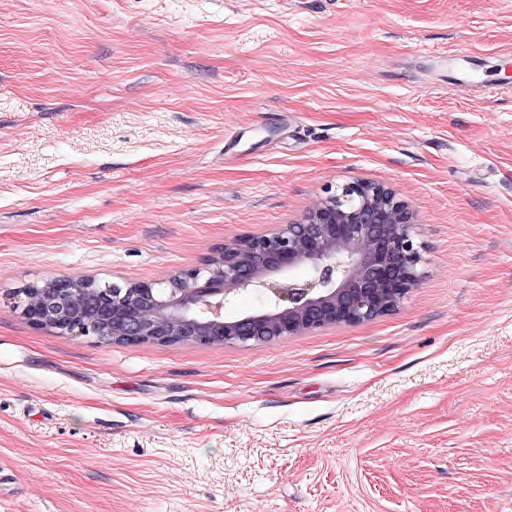

In [3]:
# Read train_image
train_tif = train_tifs[0]
PIL.Image.open(train_tif)

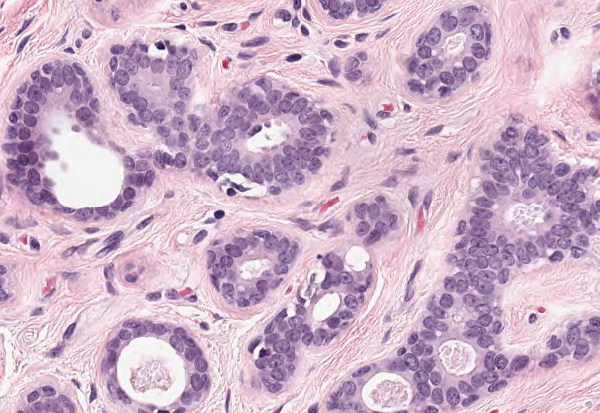

In [4]:
cells_tif = cells_tifs[0]
PIL.Image.open(cells_tif)

In [5]:
# Create cell mask from cells_tif
import xml.etree.ElementTree as ET
# First read in cell xml
def get_ptslist_from_str(xml_str, graphic_tag='graphic'): 
    elem_open_indices = [idx for (idx, line) in enumerate(xml_str) if f"<{graphic_tag}" in line]
    elem_close_indices = [idx for (idx, line) in enumerate(xml_str) if f"</{graphic_tag}" in line]
    
    elem_lines = [ 
        [l.strip() for l in xml_str[start:end+1]]
        for (start, end) in zip(elem_open_indices, elem_close_indices)
        ]
    
    return [ET.XML('\n'.join(elem_line)) for elem_line in elem_lines]

def get_pts_from_graphic(graphic_elem, point_list_tag="point-list"):
    
    point_list_elem = graphic_elem.findall("point-list")[0]
    
    pts_df = pd.DataFrame([
        [int(p) for p in point_elem.text.split(",")] 
        for point_elem in point_list_elem
    ], columns=["x","y"])
    
    for key, val in graphic_elem.attrib.items(): 
        pts_df[key] = [val]*len(pts_df)

    return pts_df
 

In [6]:
import numpy as np
idx = np.random.randint(low=0, high=len(cells_xmls), size=1)[0]
with open(cells_xmls[idx], 'r') as f: 
    raw_xml = f.readlines()
    
graphic_list = get_ptslist_from_str(raw_xml, graphic_tag="graphic")

pts_dfs = pd.DataFrame()
for graphic_elem in graphic_list: 
    pts_df = get_pts_from_graphic(graphic_elem)
    pts_dfs = pd.concat([pts_dfs, pts_df], axis=0)

In [7]:
from tqdm import tqdm_notebook as tqdm
all_cells_regions_pts_dfs = pd.DataFrame()
for idx, row in tqdm(cells_xml_meta.iterrows(), total=len(cells_xml_meta)):
    with open(row['file_path'], 'r') as f: 
        raw_xml = f.readlines()
        graphic_list = get_ptslist_from_str(raw_xml, graphic_tag="graphic")
    pts_dfs = pd.DataFrame()
    for graphic_elem in graphic_list: 
        pts_df = get_pts_from_graphic(graphic_elem)
        pts_dfs = pd.concat([pts_dfs, pts_df], axis=0)
        
    all_cells_regions_pts_dfs = pd.concat([all_cells_regions_pts_dfs, pts_dfs], axis=0)

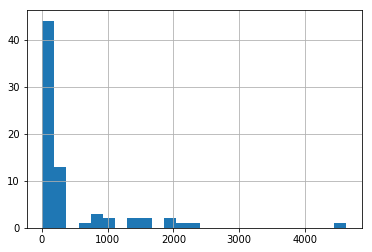

In [8]:
# Visualize region with high vs. low cellularity
# train_labels['y'].hist(bins=30)
all_cells_regions_pts_dfs.groupby(['name'])['x'].agg('count').hist(bins=25)

Text(0.5,1,'high cellularity: y=0.95, 99845_4.tif')

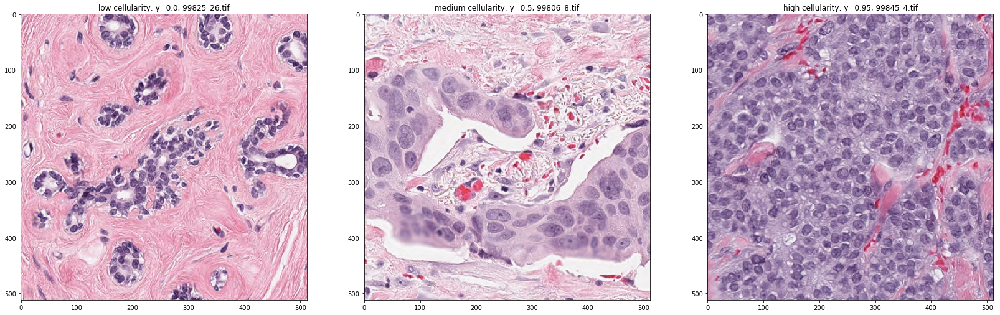

In [60]:
high_cellularity_labels = train_labels[train_labels['y'] >= 0.9]
medium_cellularity_labels = train_labels[(train_labels['y'] >= 0.35) & (train_labels['y'] <= 0.65)]
low_cellularity_labels = train_labels[train_labels['y'] <= 0.1]

hidx = np.random.randint(low=0, high=len(high_cellularity_labels), size=1)[0]
hrow = high_cellularity_labels.iloc[hidx]
hfile = os.path.join(train_path, f"{int(hrow['slide'])}_{int(hrow['rid'])}.tif")

midx = np.random.randint(low=0, high=len(medium_cellularity_labels), size=1)[0]
mrow = medium_cellularity_labels.iloc[midx]
mfile = os.path.join(train_path, f"{int(mrow['slide'])}_{int(mrow['rid'])}.tif")

lidx = np.random.randint(low=0, high=len(low_cellularity_labels), size=1)[0]
lrow = low_cellularity_labels.iloc[lidx]
lfile = os.path.join(train_path, f"{int(lrow['slide'])}_{int(lrow['rid'])}.tif")

fig, axes = plt.subplots(1, 3, figsize=(28, 9))
axes[0].imshow(plt.imread(lfile))
axes[0].set_title(f"low cellularity: y={lrow['y']}, {os.path.basename(lfile)}")
axes[1].imshow(plt.imread(mfile))
axes[1].set_title(f"medium cellularity: y={mrow['y']}, {os.path.basename(mfile)}")
axes[2].imshow(plt.imread(hfile))
axes[2].set_title(f"high cellularity: y={hrow['y']}, {os.path.basename(hfile)}")

# Explore External DataSet MonuSeq

In [7]:
# Representation Learning for Nuclear Segmentation
# Use external data: /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/Annotations/
# https://monuseg.grand-challenge.org/Data/
# Predict on provided data in cells folder

# Read MoNuSeg Annotation:
monuseg_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/'
monuseg_xmls = get_meta(os.path.join(monuseg_path, "Annotations"), file_type="xml")
monuseg_imgs = get_meta(os.path.join(monuseg_path, "TissueImages"), file_type="tif")
monuseg_meta = monuseg_xmls.merge(monuseg_imgs, on='item_name', suffixes=["_xml", "_tif"])

## Work with one data instance

In [8]:
def get_pts_from_regions(region_elem, vertex_tag="Vertex"):    
    vertices_elem = region_elem.findall("Vertices")[0].findall(vertex_tag)
    pts_df = pd.DataFrame([vertex_elem.attrib for vertex_elem in vertices_elem])
    pts_df.columns=['x', 'y']
    
    for key, val in region_elem.attrib.items(): 
        pts_df[key] = [val]*len(pts_df)

    return pts_df

idx = np.random.randint(low=0, high=len(monuseg_meta), size=1)[0]
row = monuseg_meta.iloc[idx]

with open(row['file_path_xml'], 'r') as f: 
    raw_nuc_xml = f.readlines()
    
regions_elem = get_ptslist_from_str(xml_str=raw_nuc_xml, graphic_tag='Regions')
region_elem_list = regions_elem[0].findall("Region")
region_elem = region_elem_list[0]

region_pts_dfs = pd.DataFrame()
for region_elem in region_elem_list: 
    region_pts_df = get_pts_from_regions(region_elem)
    region_pts_dfs = pd.concat([region_pts_dfs, region_pts_df], axis=0)

In [11]:
# Compute centroid
region_pts_dfs = region_pts_dfs.drop_duplicates()
region_pts_dfs['x'] = region_pts_dfs['x'].astype(float)
region_pts_dfs['y'] = region_pts_dfs['y'].astype(float)
region_centroids = region_pts_dfs.groupby('Id')[['x', 'y']].agg(np.mean).reset_index()
# region_points = region_pts_dfs.groupby('Id').apply(lambda x: x.sample(frac=0.1)).reset_index()
region_points = region_pts_dfs.groupby('Id')[['x', 'y']].apply(lambda x: x.sample(frac=0.2))
print(len(region_centroids), len(region_points), len(region_pts_dfs))

378 20602 103003


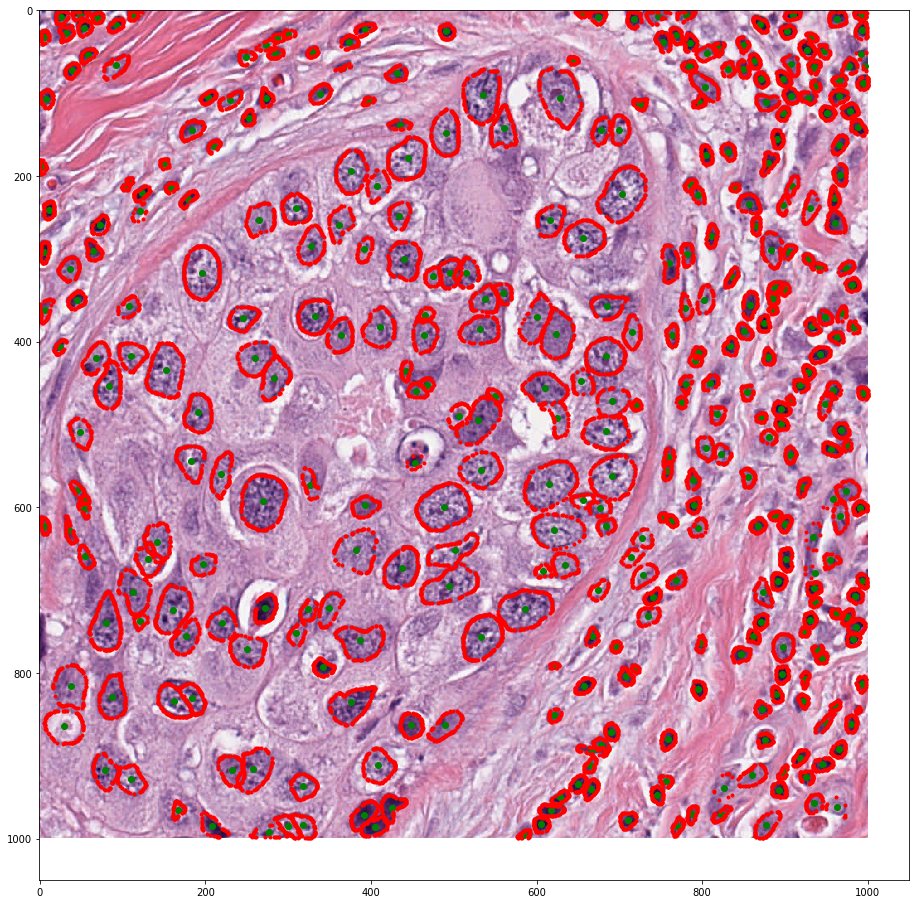

In [53]:
img = PIL.Image.open(row['file_path_tif'])
fig, ax = plt.subplots(figsize=(16, 16))
plt.imshow(img)
plt.plot(region_centroids['x'], region_centroids['y'], 'go')
plt.plot(region_points['x'], region_points['y'], 'r.')
plt.show()

In [21]:
num_regions = len(region_pts_dfs['Id'].unique())
nuc_mask = np.zeros((img.size[0], img.size[1], num_regions), dtype=float)
region_pts_dfs['Id'] = region_pts_dfs['Id'].astype(int)

In [46]:
from matplotlib.path import Path
from tqdm import tqdm_notebook as tqdm

x, y = np.meshgrid(np.arange(img.size[0]), np.arange(img.size[1])) # make a canvas with coordinates
x, y = x.flatten(), y.flatten()
points = np.vstack((x,y)).T 

num_regions = len(region_pts_dfs['Id'].unique())
nuc_mask = np.zeros((img.size[0], img.size[1], num_regions), dtype=float)
nuc_mask.shape

for idx, nuc_id in tqdm(enumerate(region_pts_dfs['Id'].unique()), total=num_regions): 
    grp = region_pts_dfs[region_pts_dfs['Id']==nuc_id]
    p = Path(list(zip(grp['x'], grp['y'])))
    grid = p.contains_points(points)
    mask = grid.reshape(img.size[0], img.size[1]).astype(int)
    nuc_mask[:, :, idx] = mask*idx
    
nuc_groundtruth = np.amax(nuc_mask, axis=2).astype(int)

Text(0.5,1,'labeled nuclei image TCGA-E2-A14V-01Z-00-DX1')

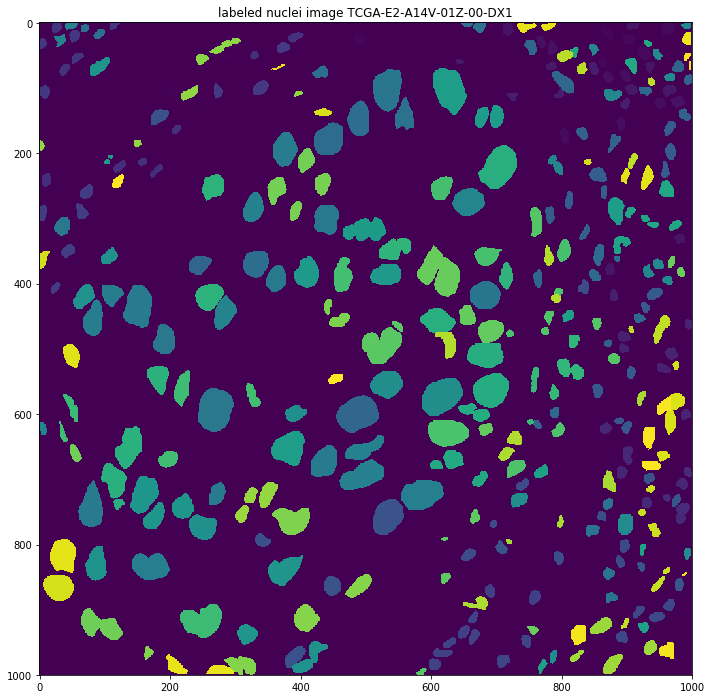

In [56]:
fig, ax = plt.subplots(figsize=(12, 12))
plt.imshow(nuc_groundtruth)
plt.title(f"labeled nuclei image {row['item_name']}")

In [14]:
def get_nuc_regions(raw_nuc_xml, graphic_tag='Regions', elem_tag="Region"):
    regions_elem = get_ptslist_from_str(xml_str=raw_nuc_xml, graphic_tag=graphic_tag)
    region_elem_list = regions_elem[0].findall(elem_tag)
    region_elem = region_elem_list[0]

    region_pts_dfs = pd.DataFrame()
    for region_elem in region_elem_list: 
        region_pts_df = get_pts_from_regions(region_elem)
        region_pts_dfs = pd.concat([region_pts_dfs, region_pts_df], axis=0)
    
    region_pts_dfs['x'] = region_pts_dfs['x'].astype(float)
    region_pts_dfs['y'] = region_pts_dfs['y'].astype(float)

    return region_pts_dfs

def get_bounded_pts(img, region_pts_dfs):
    x, y = np.meshgrid(np.arange(img.size[0]), np.arange(img.size[1])) # make a canvas with coordinates
    x, y = x.flatten(), y.flatten()
    points = np.vstack((x,y)).T 

    num_regions = len(region_pts_dfs['Id'].unique())
    nuc_mask = np.zeros((img.size[0], img.size[1], num_regions), dtype=float)

    for idx, nuc_id in tqdm(enumerate(region_pts_dfs['Id'].unique()), total=num_regions): 
        grp = region_pts_dfs[region_pts_dfs['Id']==nuc_id]
        p = Path(list(zip(grp['x'], grp['y'])))
        grid = p.contains_points(points)
        mask = grid.reshape(img.size[0], img.size[1]).astype(int)
        nuc_mask[:, :, idx] = mask*idx

    nuc_groundtruth = np.amax(nuc_mask, axis=2).astype(int)
    
    return nuc_groundtruth

## Build Nuclei Segmentation Groundtruth from MoNuSeg Data Set

In [75]:
# Build MoNuSeg nuclei segmentation ground truth
# 1. Create metadata df
# Read MoNuSeg Annotation:
monuseg_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/'
monuseg_xmls = get_meta(os.path.join(monuseg_path, "Annotations"), file_type="xml")
monuseg_imgs = get_meta(os.path.join(monuseg_path, "TissueImages"), file_type="tif")
monuseg_meta = monuseg_xmls.merge(monuseg_imgs, on='item_name', suffixes=["_xml", "_tif"])

# 2. Iterate through monuseg_meta
grouth_truth_img_path = os.path.join(monuseg_path, "LabeledNucImages")
centroid_output_path = os.path.join(monuseg_path, "NucCentroids")

for output_dir in [grouth_truth_img_path, centroid_output_path]:
    if not os.path.isdir(output_dir): 
        os.makedirs(output_dir)
    
for idx, instance in tqdm(monuseg_meta.iterrows(), total=len(monuseg_meta)):
    with open(instance['file_path_xml'], 'r') as f: 
        raw_nuc_xml = f.readlines()
        
    print(f"Parsing xml for {instance['item_name']}")
    region_pts_dfs = get_nuc_regions(raw_nuc_xml, graphic_tag='Regions', elem_tag="Region")
    region_pts_dfs.groupby('Id')[['x', 'y']].agg(np.mean).reset_index()
    region_centroids = region_pts_dfs.groupby('Id')[['x', 'y']].agg(np.mean).reset_index()
    # Save region centroids
    region_centroids.to_csv(os.path.join(centroid_output_path, f"{instance['item_name']}.csv"), index=False)
    
    print(f"Creating groundtruth image for {instance['item_name']}")
    img = PIL.Image.open(instance['file_path_tif'])
    nuc_groundtruth = get_bounded_pts(img, region_pts_dfs)
    
    output_file = os.path.join(grouth_truth_img_path, f"{instance['item_name']}.png")
    print(f"Saving labeled image to {output_file}")
    plt.imsave(output_file, nuc_groundtruth)

Parsing xml for TCGA-38-6178-01Z-00-DX1
Creating groundtruth image for TCGA-38-6178-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-38-6178-01Z-00-DX1.png
Parsing xml for TCGA-HE-7129-01Z-00-DX1
Creating groundtruth image for TCGA-HE-7129-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-HE-7129-01Z-00-DX1.png
Parsing xml for TCGA-A7-A13E-01Z-00-DX1
Creating groundtruth image for TCGA-A7-A13E-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-A7-A13E-01Z-00-DX1.png
Parsing xml for TCGA-HE-7128-01Z-00-DX1
Creating groundtruth image for TCGA-HE-7128-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-HE-7128-01Z-00-DX1.png
Parsing xml for TCGA-G9-6356-01Z-00-DX1
Creating groundtruth image for TCGA-G9-6356-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G9-6356-01Z-00-DX1.png
Parsing xml for TCGA-AY-A8YK-01A-01-TS1
Creating groundtruth image for TCGA-AY-A8YK-01A-01-TS1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-AY-A8YK-01A-01-TS1.png
Parsing xml for TCGA-NH-A8F7-01A-01-TS1
Creating groundtruth image for TCGA-NH-A8F7-01A-01-TS1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-NH-A8F7-01A-01-TS1.png
Parsing xml for TCGA-G2-A2EK-01A-02-TSB
Creating groundtruth image for TCGA-G2-A2EK-01A-02-TSB


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G2-A2EK-01A-02-TSB.png
Parsing xml for TCGA-HE-7130-01Z-00-DX1
Creating groundtruth image for TCGA-HE-7130-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-HE-7130-01Z-00-DX1.png
Parsing xml for TCGA-DK-A2I6-01A-01-TS1
Creating groundtruth image for TCGA-DK-A2I6-01A-01-TS1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-DK-A2I6-01A-01-TS1.png
Parsing xml for TCGA-A7-A13F-01Z-00-DX1
Creating groundtruth image for TCGA-A7-A13F-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-A7-A13F-01Z-00-DX1.png
Parsing xml for TCGA-E2-A1B5-01Z-00-DX1
Creating groundtruth image for TCGA-E2-A1B5-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-E2-A1B5-01Z-00-DX1.png
Parsing xml for TCGA-G9-6348-01Z-00-DX1
Creating groundtruth image for TCGA-G9-6348-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G9-6348-01Z-00-DX1.png
Parsing xml for TCGA-G9-6336-01Z-00-DX1
Creating groundtruth image for TCGA-G9-6336-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G9-6336-01Z-00-DX1.png
Parsing xml for TCGA-AR-A1AS-01Z-00-DX1
Creating groundtruth image for TCGA-AR-A1AS-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-AR-A1AS-01Z-00-DX1.png
Parsing xml for TCGA-CH-5767-01Z-00-DX1
Creating groundtruth image for TCGA-CH-5767-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-CH-5767-01Z-00-DX1.png
Parsing xml for TCGA-49-4488-01Z-00-DX1
Creating groundtruth image for TCGA-49-4488-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-49-4488-01Z-00-DX1.png
Parsing xml for TCGA-21-5784-01Z-00-DX1
Creating groundtruth image for TCGA-21-5784-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-21-5784-01Z-00-DX1.png
Parsing xml for TCGA-B0-5710-01Z-00-DX1
Creating groundtruth image for TCGA-B0-5710-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-B0-5710-01Z-00-DX1.png
Parsing xml for TCGA-50-5931-01Z-00-DX1
Creating groundtruth image for TCGA-50-5931-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-50-5931-01Z-00-DX1.png
Parsing xml for TCGA-B0-5711-01Z-00-DX1
Creating groundtruth image for TCGA-B0-5711-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-B0-5711-01Z-00-DX1.png
Parsing xml for TCGA-E2-A14V-01Z-00-DX1
Creating groundtruth image for TCGA-E2-A14V-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-E2-A14V-01Z-00-DX1.png
Parsing xml for TCGA-KB-A93J-01A-01-TS1
Creating groundtruth image for TCGA-KB-A93J-01A-01-TS1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-KB-A93J-01A-01-TS1.png
Parsing xml for TCGA-RD-A8N9-01A-01-TS1
Creating groundtruth image for TCGA-RD-A8N9-01A-01-TS1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-RD-A8N9-01A-01-TS1.png
Parsing xml for TCGA-AR-A1AK-01Z-00-DX1
Creating groundtruth image for TCGA-AR-A1AK-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-AR-A1AK-01Z-00-DX1.png
Parsing xml for TCGA-G9-6362-01Z-00-DX1
Creating groundtruth image for TCGA-G9-6362-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G9-6362-01Z-00-DX1.png
Parsing xml for TCGA-G9-6363-01Z-00-DX1
Creating groundtruth image for TCGA-G9-6363-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G9-6363-01Z-00-DX1.png
Parsing xml for TCGA-B0-5698-01Z-00-DX1
Creating groundtruth image for TCGA-B0-5698-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-B0-5698-01Z-00-DX1.png
Parsing xml for TCGA-18-5592-01Z-00-DX1
Creating groundtruth image for TCGA-18-5592-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-18-5592-01Z-00-DX1.png
Parsing xml for TCGA-21-5786-01Z-00-DX1
Creating groundtruth image for TCGA-21-5786-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-21-5786-01Z-00-DX1.png


# Try Pytorch UNet

In [10]:
# Split data set into training/validation/testing
import cv2
from PIL import Image
dataset_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining'
image_path = os.path.join(dataset_path, 'TissueImages')
mask_path = os.path.join(dataset_path, 'LabeledNucImages')
centroid_path = os.path.join(dataset_path, "NucCentroids")

cell_image_meta = get_meta(path=image_path, file_type="tif")
mask_meta = get_meta(path=mask_path, file_type="png")
centroid_meta = get_meta(path=centroid_path, file_type="csv")

image_with_mask_meta = cell_image_meta.merge(mask_meta, on='item_name', suffixes=['_image', '_mask'])
image_mask_centroid_meta = image_with_mask_meta.merge(centroid_meta, on='item_name')
row = image_mask_centroid_meta.sample(1).iloc[0]

image =  cv2.imread(row['file_path_image'])
mask = cv2.imread(row['file_path_mask'])
centroid_df = pd.read_csv(row['file_path'])

# fig, axes = plt.subplots(1, 2, figsize=(11, 7))
# axes[0].imshow(image)
# axes[1].imshow(mask[:, :, :3])

/Users/trimchala/miniconda/envs/fastai/lib/python3.6/site-packages/skimage/color/colorconv.py:275: RuntimeWarning: divide by zero encountered in true_divide
  out[idx, 0] = (arr[idx, 1] - arr[idx, 2]) / delta[idx]
/Users/trimchala/miniconda/envs/fastai/lib/python3.6/site-packages/skimage/color/colorconv.py:283: RuntimeWarning: divide by zero encountered in true_divide
  out[idx, 0] = 4. + (arr[idx, 0] - arr[idx, 1]) / delta[idx]


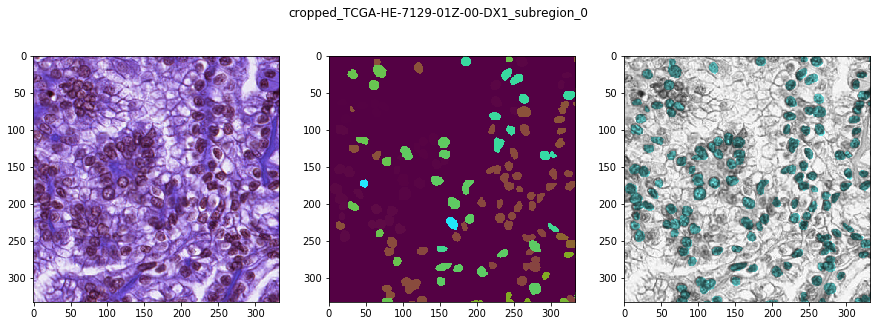

In [11]:
# def 
from skimage import data, color

def crop_image_and_mask(image, mask, centroid_df, num_grid = 4, item_name="unknown", display_crop=False): 
    image_w, image_h, image_c = image.shape
    mask_w, mask_h, _ = mask.shape

    x = np.linspace(0, image_w, num_grid).astype(int)
    y = np.linspace(0, image_h, num_grid).astype(int)

    image_crops = []
    mask_crops = []
    centroid_crops = []
    for x1, x2 in zip(x[:-1], x[1:]): 
        for y1, y2 in zip(y[:-1], y[1:]):
            image_crops.append(image[x1:x2, y1:y2, :])
            mask_crops.append(mask[x1:x2, y1:y2])
            
            adjusted_centroid_df = centroid_df.apply(
                    lambda row: 
                        (x1 < row['x'] <= x2) and (y1 < row['y'] <= y2), 
                    axis=1
                ).reset_index(drop=True)
            
            adjusted_centroid_df = centroid_df[
                centroid_df.apply(
                    lambda row: (x1 < row['x'] <= x2) and (y1 < row['y'] <= y2), axis=1)
            ].reset_index(drop=True)
            adjusted_centroid_df['x'] = adjusted_centroid_df['x'] - x1
            adjusted_centroid_df['y'] = adjusted_centroid_df['y'] - y1            

            centroid_crops.append(adjusted_centroid_df)

    if display_crop: 
        sidx = np.random.randint(low=0, high=len(image_crops), size=1)[0]
        image_hsv = color.rgb2hsv(image_crops[sidx])
        mask_hsv = mask_crops[sidx]
        mask_hsv = (mask_crops[sidx][:, :, :3] > np.min(mask_crops[sidx][:, :, :3])).astype(int)

        alpha=0.5
        image_hsv[..., 0] = mask_hsv[..., 0] * (1-alpha)
        image_hsv[..., 1] = mask_hsv[..., 1] * alpha

        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(image_crops[sidx])
        axes[1].imshow(mask_crops[sidx])
        axes[2].imshow(color.hsv2rgb(image_hsv))
        
        plt.suptitle(f'cropped_{item_name}_subregion_{sidx}')

        plt.show()
    
    return image_crops, mask_crops, centroid_crops

image_crops, mask_crops, centroid_crops = crop_image_and_mask(
    image, 
    mask, 
    centroid_df,
    item_name = row['item_name'], 
    display_crop=True, 
    num_grid=4
)

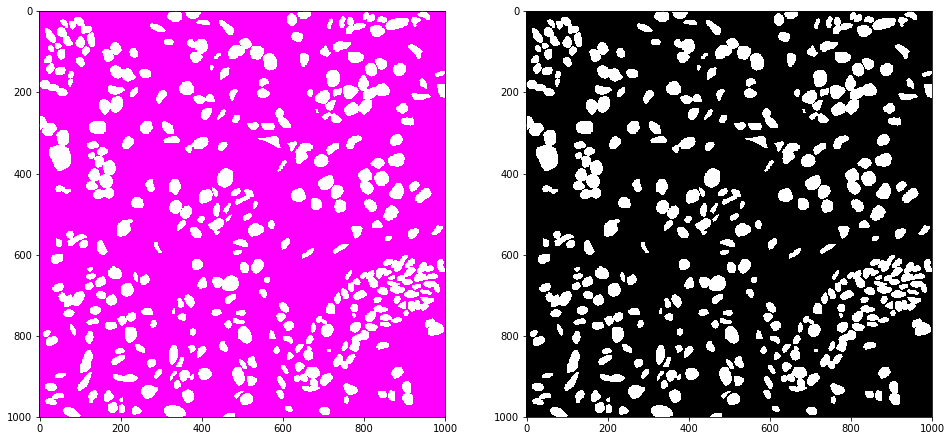

In [80]:
mask = cv2.imread(row['file_path_mask'])
retval, mask = cv2.threshold(mask, 10, 255, cv2.THRESH_BINARY)
gray = cv2.cvtColor(mask, cv2.COLOR_RGB2GRAY)
gray.min(), gray.max()
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
axes[0].imshow(mask, cmap='gray')
axes[1].imshow(gray, cmap='gray')

# gray[np.where(gray == gray.min())] = 0

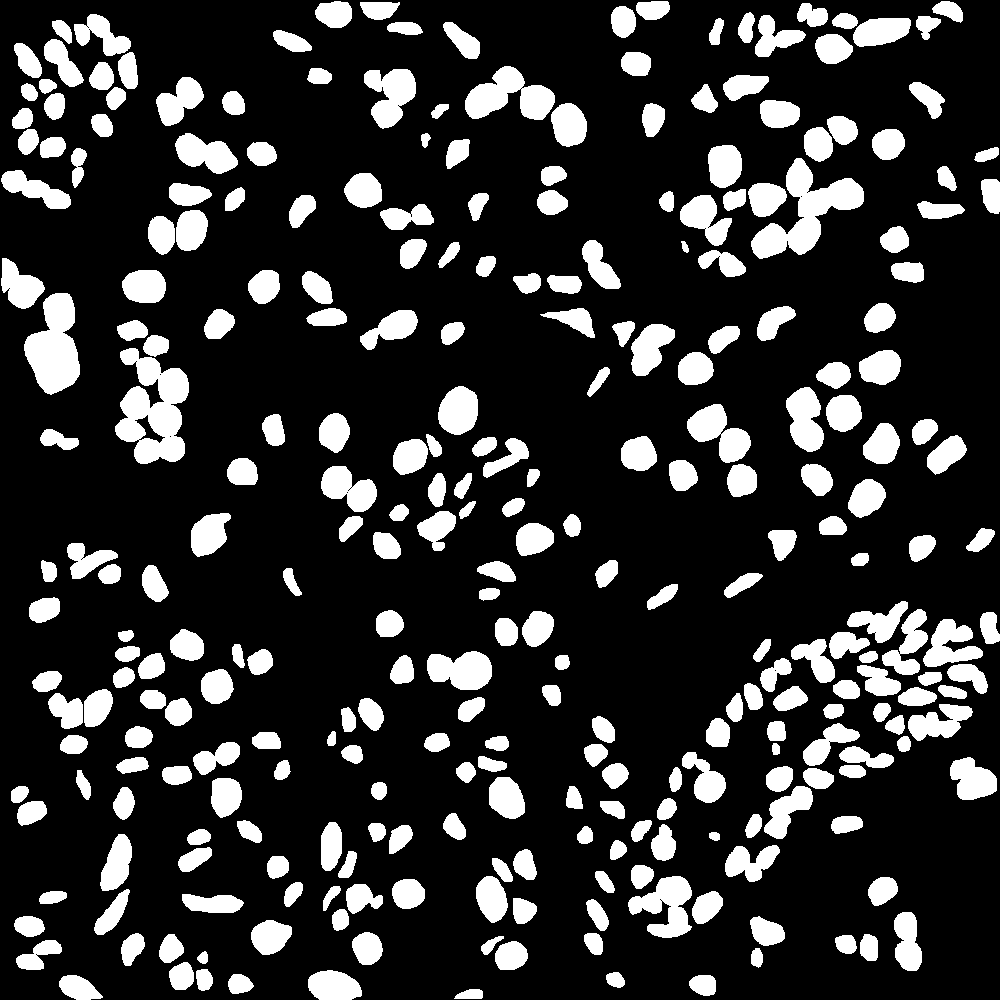

In [81]:
gray2 = gray - gray.min()
gray2[np.where(gray2 == gray2.max())] = 255 
PIL.Image.fromarray(gray2)

0.8 0.09999999999999998 0.09999999999999998


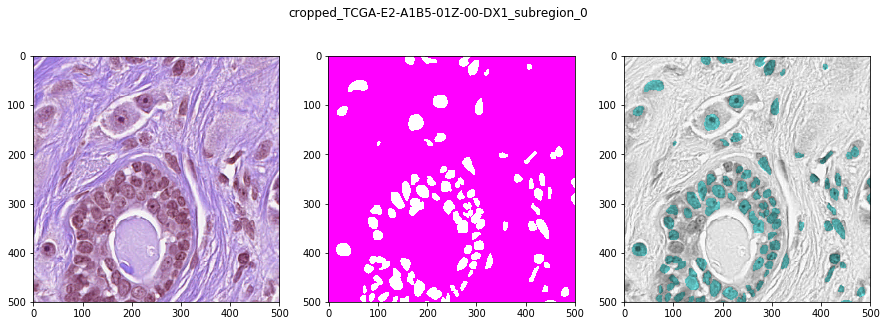

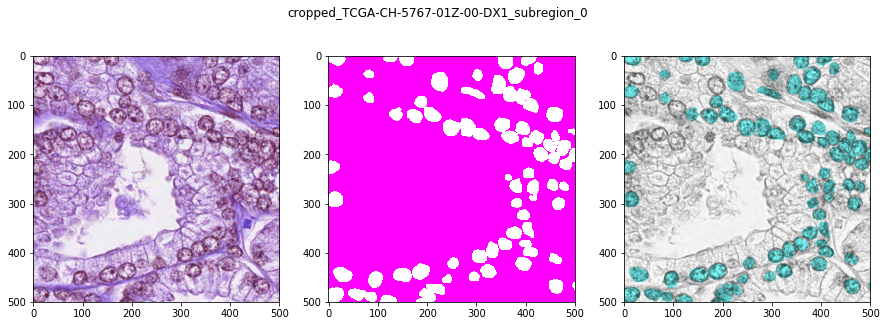

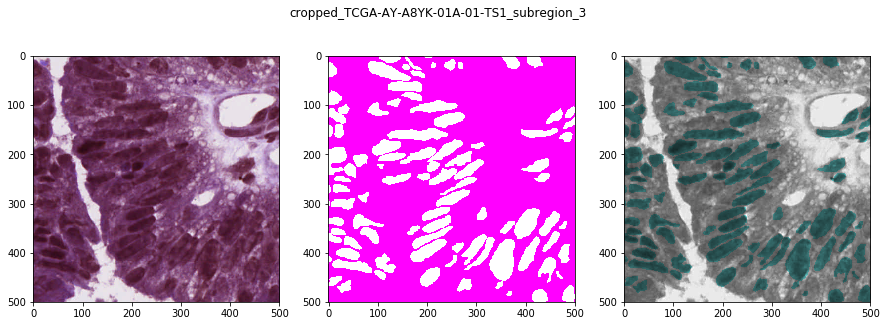

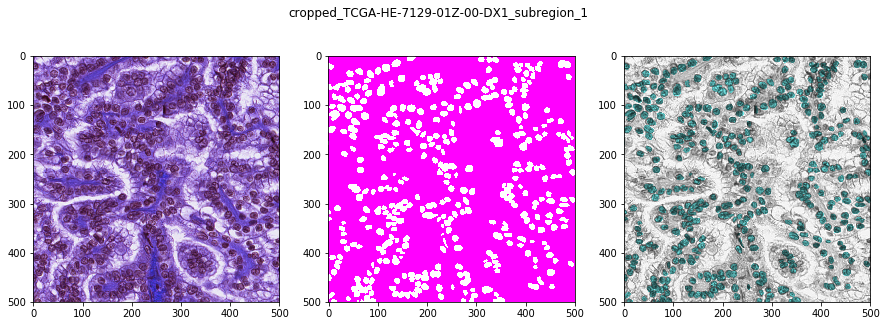

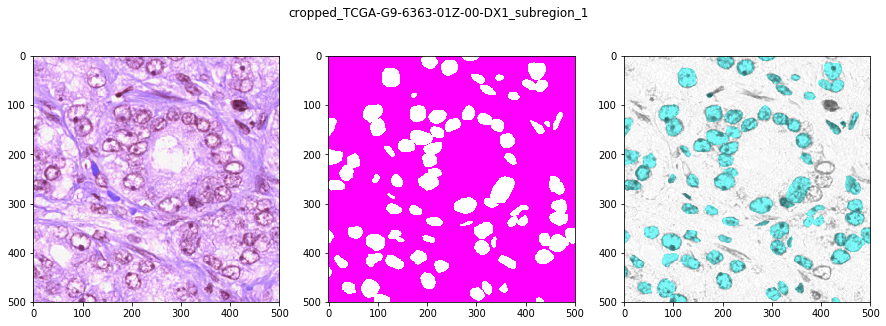

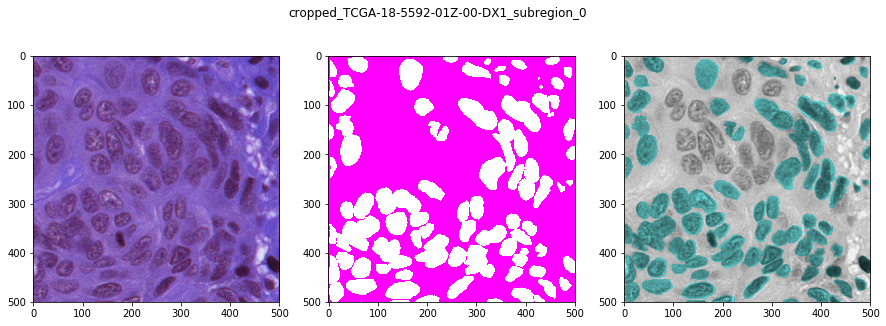

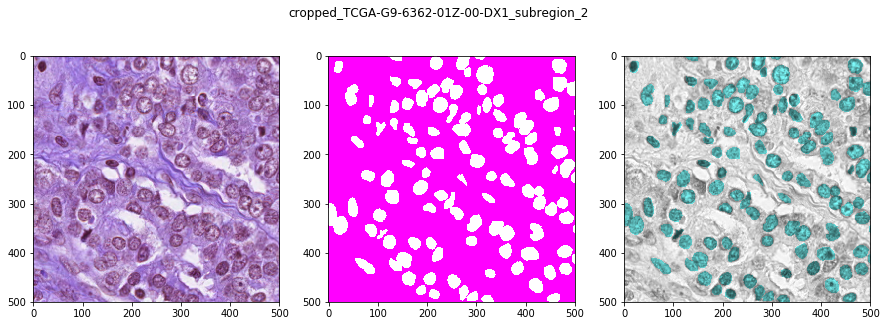

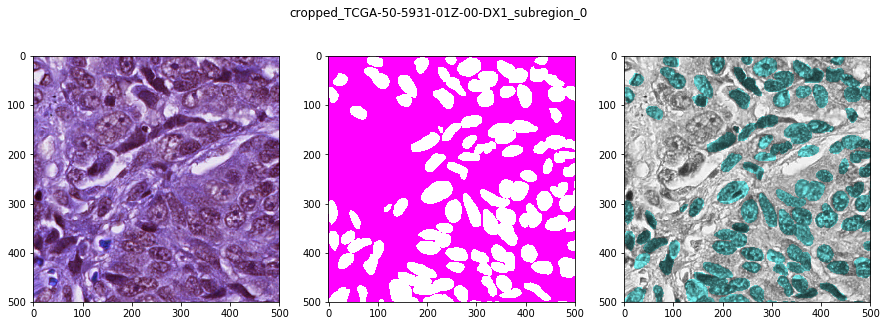

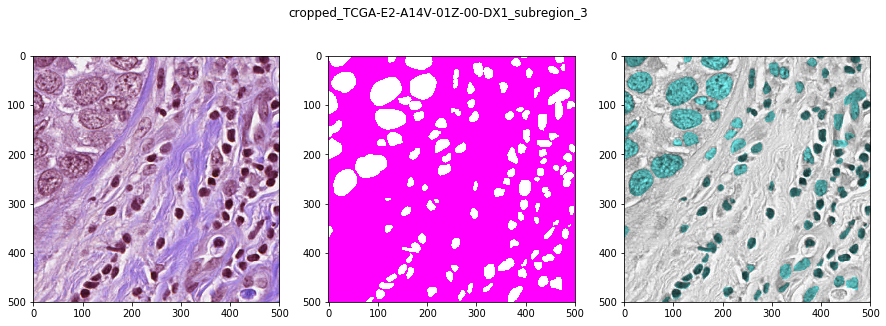

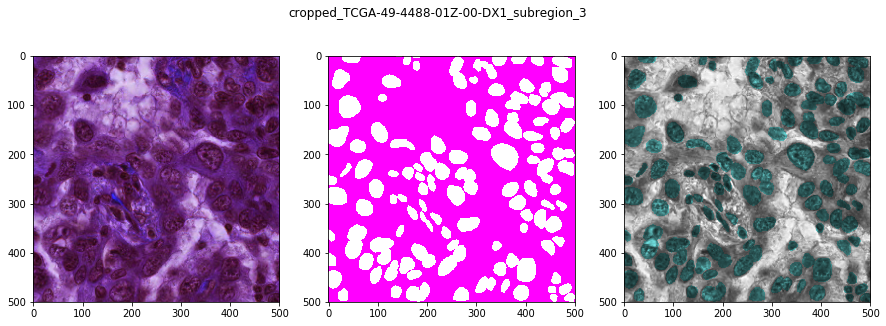

In [53]:
# Also need to crop centroids
# centroid_meta . . . 
monuseg_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/'
grouth_truth_img_path = os.path.join(monuseg_path, "LabeledNucImages")
centroid_output_path = os.path.join(monuseg_path, "NucCentroids")

display_rate = 0.3
random_display = np.array([(r > (1-display_rate)) for r in np.random.random(len(image_with_mask_meta))])

num_grid = 3
frac_train = 0.8
frac_validation = 0.5*(1 - frac_train)
frac_test = 1 - frac_train - frac_validation
print(frac_train, frac_validation, frac_test)

for (idx, row), display_flag in tqdm(zip(image_mask_centroid_meta.iterrows(), random_display), total=len(image_with_mask_meta)): 
    image = cv2.imread(row['file_path_image'])
    mask_rgb = cv2.imread(row['file_path_mask'])

    retval, mask = cv2.threshold(mask_rgb, 10, 255, cv2.THRESH_BINARY)
    mask_gray = cv2.cvtColor(mask, cv2.COLOR_RGB2GRAY)
#     mask_gray = mask_gray - mask_gray.min()
#     mask_gray[np.where(mask_gray == mask_gray.max())] = 255 
    
    centroid_df = pd.read_csv(row['file_path'])
    image_crops, mask_crops, centroid_crops = crop_image_and_mask(
        image, mask, centroid_df, item_name=row['item_name'], display_crop=display_flag, num_grid=num_grid
    )
    
    ml_set = np.random.choice(
        ['train', 'validation', 'test'], 
        replace=True, 
        p=[frac_train, frac_validation, frac_test], 
        size=len(image_crops)
    )
    
    # Save to different ml_set
    for (idx, image_crop), mask_crop, centroid_crop, set_name in zip(enumerate(image_crops), mask_crops, centroid_crops, ml_set): 
        img_crop_out_path = os.path.join(image_path, set_name)
        mask_crop_out_path = os.path.join(mask_path, set_name)
        centroid_crop_out_path = os.path.join(centroid_output_path, set_name)
        
        for ml_set_path in [img_crop_out_path, mask_crop_out_path, centroid_crop_out_path]:             
            if not os.path.isdir(ml_set_path): 
                os.makedirs(ml_set_path)
        
        plt.imsave(os.path.join(img_crop_out_path, f"{row['item_name']}_{idx}.tif"), image_crop)
        plt.imsave(os.path.join(mask_crop_out_path, f"{row['item_name']}_{idx}.png"), PIL.Image.fromarray(mask_crop))
        centroid_crop.to_csv(os.path.join(centroid_crop_out_path, f"{row['item_name']}_{idx}.csv"), index=False)
        

In [56]:
print(
    len(glob(os.path.join(grouth_truth_img_path, "train", "*"))), 
    len(glob(os.path.join(grouth_truth_img_path, "validation", "*"))),
    len(glob(os.path.join(grouth_truth_img_path, "test", "*")))
)

99 15 21


In [55]:
grouth_truth_img_path

'/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages'

In [158]:
# cells_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/cells/'
# !ulimit -n 10000

In [40]:
import torch
import torch.nn as nn
from torch.nn import Conv2d as Conv2D
import torch.nn.init as init
import torch.nn.functional as F
import numpy
from torch.nn import Upsample
from tqdm import tqdm_notebook as tqdm

class Up(nn.Module):
    def __init__(self, channel_in, channel_out):
        super(Up, self).__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear')
        self.conv = nn.Sequential(
            Conv2D(channel_in, channel_out, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(channel_out),
            nn.ReLU(inplace=True)
        )

        
        
    def forward(self, x1, x2):
        # Input size - Batch_Size X Channel X Height of Activation Map  X Width of Activation Map
        # Upsample using bilinear mode and scale it to twice its size
        x1 = self.upsample(x1)
        # in 4D array - matching the last two in case of 5D it will take 
        # last three dimensions
        difference_in_X = x1.size()[2] - x2.size()[2]
        difference_in_Y = x1.size()[3] - x2.size()[3]
        # Padding it with the required value
        x2 = F.pad(x2, (difference_in_X // 2, int(difference_in_X / 2),
                        difference_in_Y // 2, int(difference_in_Y / 2)))
        # concat on channel axis
        x = torch.cat([x2, x1], dim=1)
        # Use convolution
        x = self.conv(x)
        return x

class Down(nn.Module):
    def __init__(self, channel_in, channel_out):
        super(Down, self).__init__()
        self.conv = nn.Sequential(
            Conv2D(channel_in, channel_out, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(channel_out),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        # Input size - Batch_Size X Channel X Height of Activation Map  X Width of Activation Map
        # Downsample First
        x = F.max_pool2d(x,2)
        # Use convolution
        x = self.conv(x)
        return x

class UNet(nn.Module):
    def __init__(self, channel_in, classes):
        super(UNet, self).__init__()
        self.input_conv = self.conv = nn.Sequential(
            Conv2D(channel_in, 8, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True)
        )
        self.down1 = Down(8, 16)
        self.down2 = Down(16, 32)
        self.down3 = Down(32, 32)
        self.up1 = Up(64, 16)
        self.up2 = Up(32, 8)
        self.up3 = Up(16, 4)
        self.output_conv = nn.Conv2d(4, classes, kernel_size = 1)
        
    def forward(self, x):
        x1 = self.input_conv(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x = self.up1(x4, x3)
        x = self.up2(x, x2)
        x = self.up3(x, x1)
        output = self.output_conv(x)
        return F.sigmoid(output)
    
def weights_init(m):
    if isinstance(m, nn.Conv2d):
        init.xavier_uniform(m.weight, gain=numpy.sqrt(2.0))
        init.constant(m.bias, 0.1)
    
def train_unet(model, epoch, train_dataloader, criterion):
    model.train()
    correct = 0
    for batch_idx, data in tqdm(enumerate(train_dataloader), total=len(train_dataloader)):
        data, target = Variable(data["image"]), Variable(data["mask"])
        optimizer.zero_grad()
        output = model.forward(data.float())
        loss = criterion(output.float(), target.float())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if batch_idx % 1 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_dataloader.dataset),
                100. * batch_idx / len(train_dataloader), loss.data[0]))
            
def test_unet(model, val_dataloader, criterion):
    model.eval()
    test_loss = 0
    for data in tqdm(val_dataloader):
        data, target = Variable(data["image"], volatile=True), Variable(data["mask"])
        output = model(data.float())
        # print(output.data[0])
        test_loss += criterion(output.float(), target.float()).data[0] # sum up batch loss
    test_loss /= len(val_dataloader.dataset)
    print("Average Loss: ", test_loss)

# Continue Training from saved state

In [52]:
# Data Augmentation 
# Random Crop
# Random Flip

import skimage
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, utils
from torch.autograd import Variable
from torch.utils.data.dataset import Dataset
from torchvision import transforms
from torchvision.transforms import Compose, TenCrop, Lambda
import torchvision.transforms as vis_tf
from glob import glob
import cv2
from matplotlib import pyplot as plt
%matplotlib inline
# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

%load_ext autoreload

%autoreload 2
plt.ion()   # interactive mode

dataset_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining'
image_path = os.path.join(dataset_path, 'TissueImages')
mask_path = os.path.join(dataset_path, 'LabeledNucImages')

class NuclearMaskedDataSet(Dataset): 
    def __init__(self, image_path, mask_path, transforms=None):
        # stuff
        self.image_path = image_path
        self.mask_path = mask_path
        self.transforms = transforms
        self.image_list = glob(os.path.join(self.image_path, "*.tif"))
        self.mask_list = glob(os.path.join(self.mask_path, "*.png"))
        
    def __getitem__(self, index):
        img = PIL.Image.fromarray(cv2.imread(self.image_list[index]))
        mask = PIL.Image.fromarray(cv2.imread(self.mask_list[index]))

        # Transform only on training set
        if self.transforms is not None:
            img = self.transforms(img)
            mask = self.transforms(mask)
        else: 
            pil2tensor = vis_tf.Compose([vis_tf.ToTensor()])
            img = pil2tensor(img)
            mask = pil2tensor(mask)
            
        return {
            "image": img, 
            "mask": mask
        }

    def __len__(self):
        return len(self.image_list)
    
crop_size = 256
crop_padding = 4
transformations = vis_tf.Compose([
    vis_tf.RandomHorizontalFlip(),
    vis_tf.RandomVerticalFlip(),
    vis_tf.RandomCrop(size=crop_size, padding=crop_padding), 
    vis_tf.ToTensor()
])

train_ds = NuclearMaskedDataSet(
    image_path=os.path.join(image_path, "train"), 
    mask_path=os.path.join(mask_path, "train"),
    transforms=transformations
)

val_ds = NuclearMaskedDataSet(
    image_path=os.path.join(image_path, "validation"),
    mask_path=os.path.join(mask_path, "validation"), 
    transforms=transformations
)

test_ds = NuclearMaskedDataSet(
    image_path=os.path.join(image_path, "test"), 
    mask_path=os.path.join(mask_path, "test"), 
    transforms=transformations
)

batch_size = 32
train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=True, num_workers=4)
test_loader = DataLoader(test_ds, batch_size=batch_size, shuffle=True, num_workers=4)


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


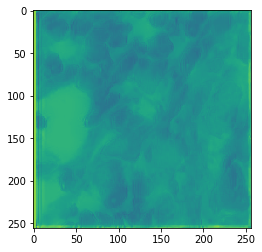

In [117]:
outputs = output.float().detach().numpy()
outputs.shape

# plt.imshow((outputs[0, 1, :, :] - outputs[0, 1, :, :].min())/(outputs[0, 1, :, :].max() - outputs[0, 1, :, :].min()), cmap='gray')

plt.imshow(skimage.color.rgb2gray(chw_to_hwc(outputs[0, :, :, :].squeeze())))

In [ ]:
outputs = output.float().detach().numpy

torch.Size([15, 3, 256, 256]) torch.Size([15, 3, 256, 256])


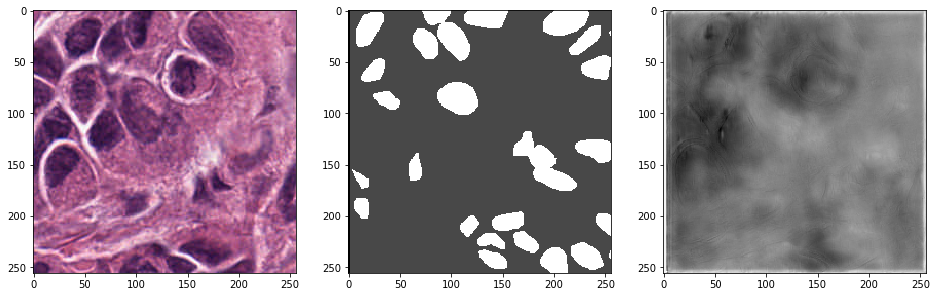

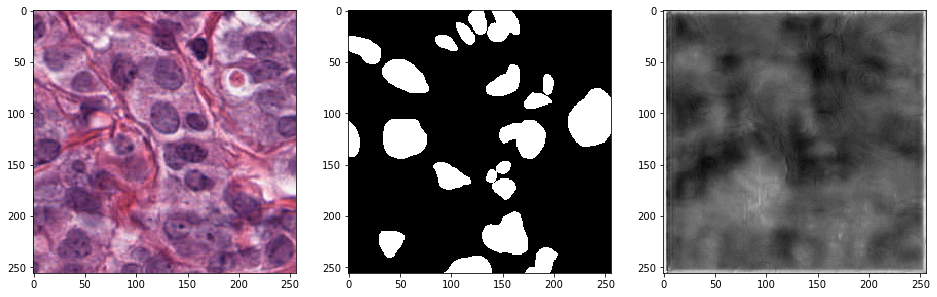

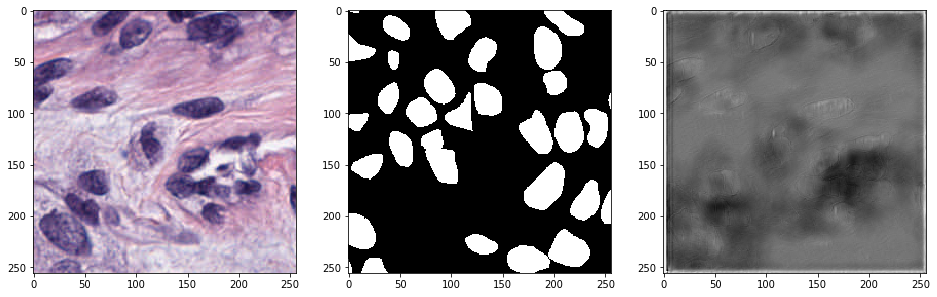

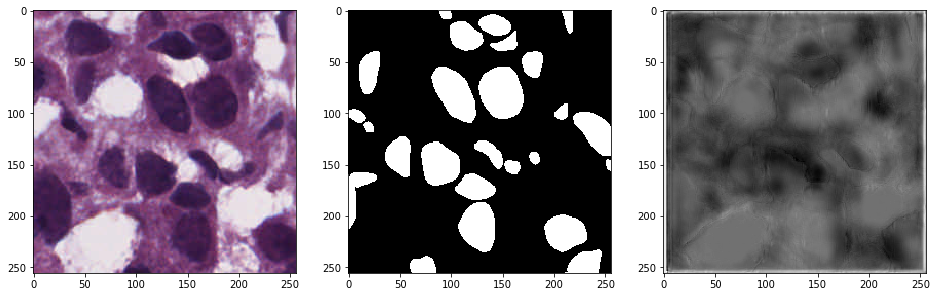

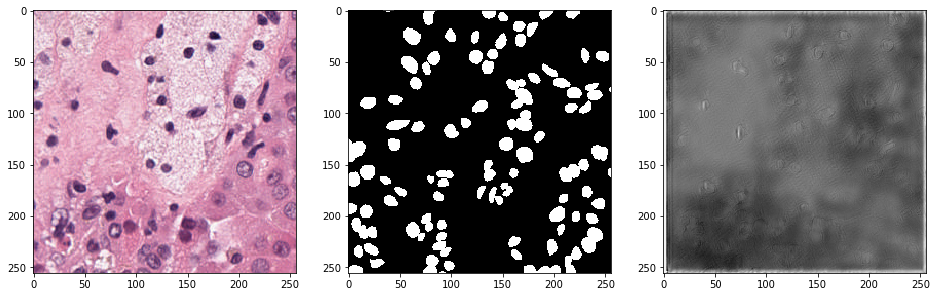

...

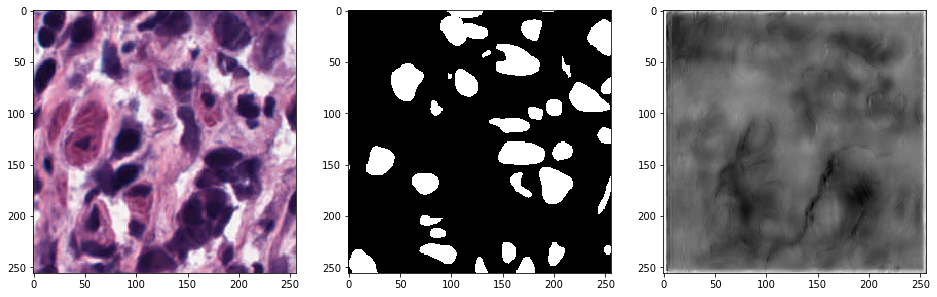

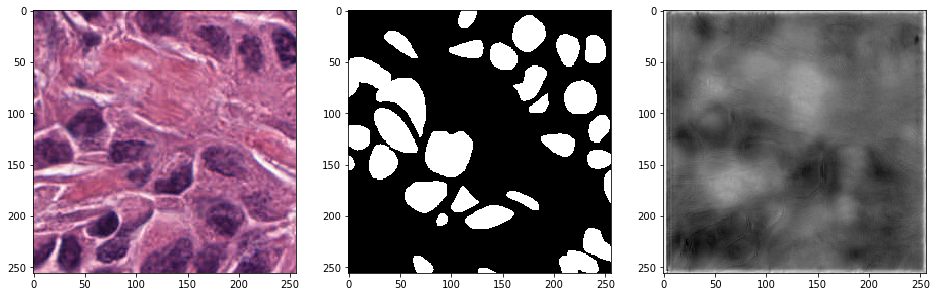

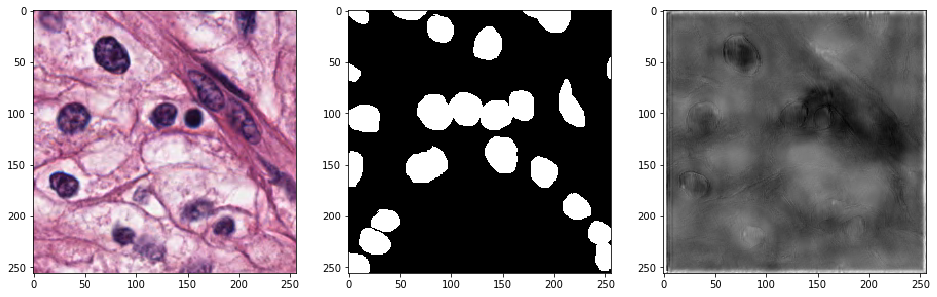

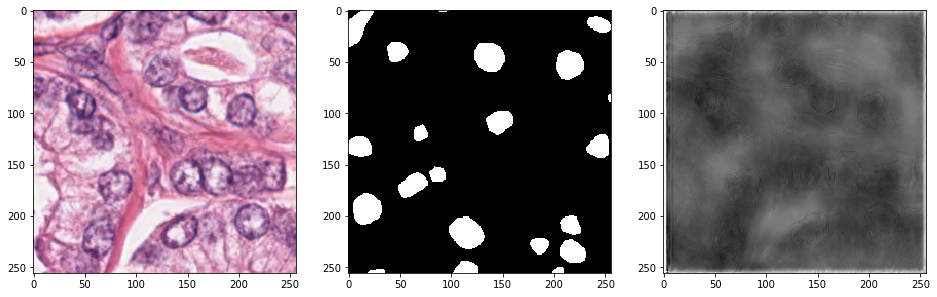

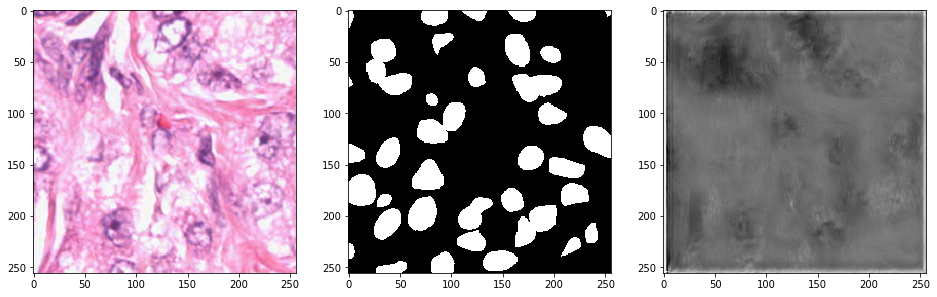

In [129]:
def chw_to_hwc(img):
    return np.transpose(img, axes=[1, 2, 0])

trained_model = model_instance
trained_model.eval()
for data in tqdm(val_loader):
    data, target = Variable(data["image"], volatile=True), Variable(data["mask"])
    output = trained_model(data.float())
print(data.shape, output.shape)

for input_instance, target_instance, output_instance in zip(data, target, output):     
    input_hwc = chw_to_hwc(input_instance.detach().numpy())
    target_hwc =  skimage.color.rgb2gray(chw_to_hwc(target_instance.detach().numpy()))
    output_hwc = skimage.color.rgb2gray(chw_to_hwc(output_instance.detach().numpy()))
    
    fig, axes = plt.subplots(1, 3, figsize=(16, 8))
    axes[0].imshow(input_hwc)
    axes[1].imshow(target_hwc, cmap='gray')
    axes[2].imshow(output_hwc, cmap='gray')

In [92]:
target.shape

torch.Size([15, 3, 256, 256])

In [126]:
epoches = 1000
checkpoint_interval = 100

base_epoch = 1000
trained_model_path = os.path.join(monuseg_path, "torch_models")
last_train_path = os.path.join(trained_model_path, "last_trained")

# for checkpoint_dir in [trained_model_path, last_train_path]:
#     if not os.path.isdir(checkpoint_dir): 
#         os.makedirs(checkpoint_dir)
    
# last_trained_model = glob(last_train_path)[-1]
# model_instance = UNet(3, 3)
# model_instance.load_state_dict(torch.load(last_trained_model))
optimizer = optim.Adam(model_instance.parameters(), lr=0.0001, decay=float(args.decay), amsgrad=True))
# criterion = nn.BCELoss()

for epoch in range(epoches):
    if (epoch > 0) and (np.mod(epoch, checkpoint_interval) == 0): 
        torch.save(
            model_instance.state_dict(), 
            os.path.join(trained_model_path, f"monuseg_unet33_{epoch+base_epoch}ep.pth")
        )
        test_unet(model=model_instance, val_dataloader=val_loader, criterion=criterion)
    train_unet(model=model_instance, epoch=epoch, train_dataloader=train_loader, criterion=criterion)


torch.save(
    model_instance.state_dict(), 
    os.path.join(trained_model_path, "last_trained", f"monuseg_unet33_{epoch+base_epoch}ep.pth")
)


Train Epoch: 0 [0/99 (0%)]	Loss: 0.186441
Train Epoch: 0 [32/99 (25%)]	Loss: 0.180685
Train Epoch: 0 [64/99 (50%)]	Loss: 0.184947
Train Epoch: 0 [9/99 (75%)]	Loss: 0.185570


Train Epoch: 1 [0/99 (0%)]	Loss: 0.174977
Train Epoch: 1 [32/99 (25%)]	Loss: 0.183545
Train Epoch: 1 [64/99 (50%)]	Loss: 0.192982
Train Epoch: 1 [9/99 (75%)]	Loss: 0.178582


Train Epoch: 2 [0/99 (0%)]	Loss: 0.186438
Train Epoch: 2 [32/99 (25%)]	Loss: 0.181782
Train Epoch: 2 [64/99 (50%)]	Loss: 0.176912
Train Epoch: 2 [9/99 (75%)]	Loss: 0.216501


Train Epoch: 3 [0/99 (0%)]	Loss: 0.184056
Train Epoch: 3 [32/99 (25%)]	Loss: 0.175181
Train Epoch: 3 [64/99 (50%)]	Loss: 0.186041
Train Epoch: 3 [9/99 (75%)]	Loss: 0.236259


Train Epoch: 4 [0/99 (0%)]	Loss: 0.186919
Train Epoch: 4 [32/99 (25%)]	Loss: 0.174624
Train Epoch: 4 [64/99 (50%)]	Loss: 0.185385
Train Epoch: 4 [9/99 (75%)]	Loss: 0.161935


Train Epoch: 5 [0/99 (0%)]	Loss: 0.180802
Train Epoch: 5 [32/99 (25%)]	Loss: 0.179818
Train Epoch: 5 [64/99 (50%)]	Loss: 0.194312
Train Epoch: 5 [9/99 (75%)]	Loss: 0.163509


Train Epoch: 6 [0/99 (0%)]	Loss: 0.174715
Train Epoch: 6 [32/99 (25%)]	Loss: 0.187262
Train Epoch: 6 [64/99 (50%)]	Loss: 0.177427
Train Epoch: 6 [9/99 (75%)]	Loss: 0.217084


Train Epoch: 7 [0/99 (0%)]	Loss: 0.188930
Train Epoch: 7 [32/99 (25%)]	Loss: 0.188343
Train Epoch: 7 [64/99 (50%)]	Loss: 0.193819
Train Epoch: 7 [9/99 (75%)]	Loss: 0.143951


Train Epoch: 8 [0/99 (0%)]	Loss: 0.190177
Train Epoch: 8 [32/99 (25%)]	Loss: 0.190477
Train Epoch: 8 [64/99 (50%)]	Loss: 0.177954
Train Epoch: 8 [9/99 (75%)]	Loss: 0.187100


Train Epoch: 9 [0/99 (0%)]	Loss: 0.181704
Train Epoch: 9 [32/99 (25%)]	Loss: 0.197065
Train Epoch: 9 [64/99 (50%)]	Loss: 0.184902
Train Epoch: 9 [9/99 (75%)]	Loss: 0.150492


Train Epoch: 10 [0/99 (0%)]	Loss: 0.180470
Train Epoch: 10 [32/99 (25%)]	Loss: 0.175223
Train Epoch: 10 [64/99 (50%)]	Loss: 0.193844
Train Epoch: 10 [9/99 (75%)]	Loss: 0.223998


Train Epoch: 11 [0/99 (0%)]	Loss: 0.189804
Train Epoch: 11 [32/99 (25%)]	Loss: 0.179517
Train Epoch: 11 [64/99 (50%)]	Loss: 0.185434
Train Epoch: 11 [9/99 (75%)]	Loss: 0.148126


Train Epoch: 12 [0/99 (0%)]	Loss: 0.188151
Train Epoch: 12 [32/99 (25%)]	Loss: 0.189179
Train Epoch: 12 [64/99 (50%)]	Loss: 0.181703
Train Epoch: 12 [9/99 (75%)]	Loss: 0.165691


Train Epoch: 13 [0/99 (0%)]	Loss: 0.185635
Train Epoch: 13 [32/99 (25%)]	Loss: 0.179830
Train Epoch: 13 [64/99 (50%)]	Loss: 0.182405
Train Epoch: 13 [9/99 (75%)]	Loss: 0.209933


Train Epoch: 14 [0/99 (0%)]	Loss: 0.176664
Train Epoch: 14 [32/99 (25%)]	Loss: 0.194897
Train Epoch: 14 [64/99 (50%)]	Loss: 0.182918
Train Epoch: 14 [9/99 (75%)]	Loss: 0.176029


Train Epoch: 15 [0/99 (0%)]	Loss: 0.183645
Train Epoch: 15 [32/99 (25%)]	Loss: 0.190822
Train Epoch: 15 [64/99 (50%)]	Loss: 0.179260
Train Epoch: 15 [9/99 (75%)]	Loss: 0.157584


Train Epoch: 16 [0/99 (0%)]	Loss: 0.175806
Train Epoch: 16 [32/99 (25%)]	Loss: 0.183759
Train Epoch: 16 [64/99 (50%)]	Loss: 0.183437
Train Epoch: 16 [9/99 (75%)]	Loss: 0.192011


Train Epoch: 17 [0/99 (0%)]	Loss: 0.182474
Train Epoch: 17 [32/99 (25%)]	Loss: 0.187331
Train Epoch: 17 [64/99 (50%)]	Loss: 0.190369
Train Epoch: 17 [9/99 (75%)]	Loss: 0.175052


Train Epoch: 18 [0/99 (0%)]	Loss: 0.195441
Train Epoch: 18 [32/99 (25%)]	Loss: 0.179984
Train Epoch: 18 [64/99 (50%)]	Loss: 0.171067
Train Epoch: 18 [9/99 (75%)]	Loss: 0.173526


Train Epoch: 19 [0/99 (0%)]	Loss: 0.186045
Train Epoch: 19 [32/99 (25%)]	Loss: 0.189998
Train Epoch: 19 [64/99 (50%)]	Loss: 0.178460
Train Epoch: 19 [9/99 (75%)]	Loss: 0.176719


Train Epoch: 20 [0/99 (0%)]	Loss: 0.181710
Train Epoch: 20 [32/99 (25%)]	Loss: 0.182509
Train Epoch: 20 [64/99 (50%)]	Loss: 0.189726
Train Epoch: 20 [9/99 (75%)]	Loss: 0.251905


Train Epoch: 21 [0/99 (0%)]	Loss: 0.191115
Train Epoch: 21 [32/99 (25%)]	Loss: 0.186065
Train Epoch: 21 [64/99 (50%)]	Loss: 0.177564
Train Epoch: 21 [9/99 (75%)]	Loss: 0.161492


Train Epoch: 22 [0/99 (0%)]	Loss: 0.184472
Train Epoch: 22 [32/99 (25%)]	Loss: 0.185117
Train Epoch: 22 [64/99 (50%)]	Loss: 0.180215
Train Epoch: 22 [9/99 (75%)]	Loss: 0.196003


Train Epoch: 23 [0/99 (0%)]	Loss: 0.191704
Train Epoch: 23 [32/99 (25%)]	Loss: 0.168705
Train Epoch: 23 [64/99 (50%)]	Loss: 0.190149
Train Epoch: 23 [9/99 (75%)]	Loss: 0.225417


Train Epoch: 24 [0/99 (0%)]	Loss: 0.180805
Train Epoch: 24 [32/99 (25%)]	Loss: 0.183323
Train Epoch: 24 [64/99 (50%)]	Loss: 0.185547
Train Epoch: 24 [9/99 (75%)]	Loss: 0.211345


Train Epoch: 25 [0/99 (0%)]	Loss: 0.194063
Train Epoch: 25 [32/99 (25%)]	Loss: 0.173610
Train Epoch: 25 [64/99 (50%)]	Loss: 0.186396
Train Epoch: 25 [9/99 (75%)]	Loss: 0.166223


Train Epoch: 26 [0/99 (0%)]	Loss: 0.180316
Train Epoch: 26 [32/99 (25%)]	Loss: 0.180394
Train Epoch: 26 [64/99 (50%)]	Loss: 0.177417
Train Epoch: 26 [9/99 (75%)]	Loss: 0.196244


Train Epoch: 27 [0/99 (0%)]	Loss: 0.179835
Train Epoch: 27 [32/99 (25%)]	Loss: 0.191097
Train Epoch: 27 [64/99 (50%)]	Loss: 0.176034
Train Epoch: 27 [9/99 (75%)]	Loss: 0.200339


Train Epoch: 28 [0/99 (0%)]	Loss: 0.171275
Train Epoch: 28 [32/99 (25%)]	Loss: 0.185611
Train Epoch: 28 [64/99 (50%)]	Loss: 0.185879
Train Epoch: 28 [9/99 (75%)]	Loss: 0.175372


Train Epoch: 29 [0/99 (0%)]	Loss: 0.182284
Train Epoch: 29 [32/99 (25%)]	Loss: 0.182498
Train Epoch: 29 [64/99 (50%)]	Loss: 0.184195
Train Epoch: 29 [9/99 (75%)]	Loss: 0.214299


Train Epoch: 30 [0/99 (0%)]	Loss: 0.176357
Train Epoch: 30 [32/99 (25%)]	Loss: 0.175686
Train Epoch: 30 [64/99 (50%)]	Loss: 0.196243
Train Epoch: 30 [9/99 (75%)]	Loss: 0.191155


Train Epoch: 31 [0/99 (0%)]	Loss: 0.182925
Train Epoch: 31 [32/99 (25%)]	Loss: 0.184165
Train Epoch: 31 [64/99 (50%)]	Loss: 0.184401
Train Epoch: 31 [9/99 (75%)]	Loss: 0.163163


Train Epoch: 32 [0/99 (0%)]	Loss: 0.177207
Train Epoch: 32 [32/99 (25%)]	Loss: 0.186657
Train Epoch: 32 [64/99 (50%)]	Loss: 0.194630
Train Epoch: 32 [9/99 (75%)]	Loss: 0.169773


Train Epoch: 33 [0/99 (0%)]	Loss: 0.182738
Train Epoch: 33 [32/99 (25%)]	Loss: 0.183900
Train Epoch: 33 [64/99 (50%)]	Loss: 0.195902
Train Epoch: 33 [9/99 (75%)]	Loss: 0.202450


Train Epoch: 34 [0/99 (0%)]	Loss: 0.192211
Train Epoch: 34 [32/99 (25%)]	Loss: 0.173508
Train Epoch: 34 [64/99 (50%)]	Loss: 0.186669
Train Epoch: 34 [9/99 (75%)]	Loss: 0.234680


Train Epoch: 35 [0/99 (0%)]	Loss: 0.186407
Train Epoch: 35 [32/99 (25%)]	Loss: 0.169947
Train Epoch: 35 [64/99 (50%)]	Loss: 0.193742
Train Epoch: 35 [9/99 (75%)]	Loss: 0.209410


Train Epoch: 36 [0/99 (0%)]	Loss: 0.180248
Train Epoch: 36 [32/99 (25%)]	Loss: 0.176031
Train Epoch: 36 [64/99 (50%)]	Loss: 0.193546
Train Epoch: 36 [9/99 (75%)]	Loss: 0.141495


Train Epoch: 37 [0/99 (0%)]	Loss: 0.183216
Train Epoch: 37 [32/99 (25%)]	Loss: 0.180388
Train Epoch: 37 [64/99 (50%)]	Loss: 0.180883
Train Epoch: 37 [9/99 (75%)]	Loss: 0.185593


Train Epoch: 38 [0/99 (0%)]	Loss: 0.169764
Train Epoch: 38 [32/99 (25%)]	Loss: 0.179622
Train Epoch: 38 [64/99 (50%)]	Loss: 0.192941
Train Epoch: 38 [9/99 (75%)]	Loss: 0.192762


Train Epoch: 39 [0/99 (0%)]	Loss: 0.190824
Train Epoch: 39 [32/99 (25%)]	Loss: 0.172469
Train Epoch: 39 [64/99 (50%)]	Loss: 0.191944
Train Epoch: 39 [9/99 (75%)]	Loss: 0.189916


Train Epoch: 40 [0/99 (0%)]	Loss: 0.185753
Train Epoch: 40 [32/99 (25%)]	Loss: 0.190119
Train Epoch: 40 [64/99 (50%)]	Loss: 0.176049
Train Epoch: 40 [9/99 (75%)]	Loss: 0.200038


Train Epoch: 41 [0/99 (0%)]	Loss: 0.177460
Train Epoch: 41 [32/99 (25%)]	Loss: 0.192623
Train Epoch: 41 [64/99 (50%)]	Loss: 0.182510
Train Epoch: 41 [9/99 (75%)]	Loss: 0.215592


Train Epoch: 42 [0/99 (0%)]	Loss: 0.177922
Train Epoch: 42 [32/99 (25%)]	Loss: 0.186338
Train Epoch: 42 [64/99 (50%)]	Loss: 0.177119
Train Epoch: 42 [9/99 (75%)]	Loss: 0.189827


Train Epoch: 43 [0/99 (0%)]	Loss: 0.186664
Train Epoch: 43 [32/99 (25%)]	Loss: 0.164827
Train Epoch: 43 [64/99 (50%)]	Loss: 0.192315
Train Epoch: 43 [9/99 (75%)]	Loss: 0.193833


Train Epoch: 44 [0/99 (0%)]	Loss: 0.182308
Train Epoch: 44 [32/99 (25%)]	Loss: 0.183283
Train Epoch: 44 [64/99 (50%)]	Loss: 0.185821
Train Epoch: 44 [9/99 (75%)]	Loss: 0.161267


Train Epoch: 45 [0/99 (0%)]	Loss: 0.184048
Train Epoch: 45 [32/99 (25%)]	Loss: 0.182235
Train Epoch: 45 [64/99 (50%)]	Loss: 0.187259
Train Epoch: 45 [9/99 (75%)]	Loss: 0.204593


Train Epoch: 46 [0/99 (0%)]	Loss: 0.177794
Train Epoch: 46 [32/99 (25%)]	Loss: 0.185100
Train Epoch: 46 [64/99 (50%)]	Loss: 0.172719
Train Epoch: 46 [9/99 (75%)]	Loss: 0.239930


Train Epoch: 47 [0/99 (0%)]	Loss: 0.181524
Train Epoch: 47 [32/99 (25%)]	Loss: 0.191026
Train Epoch: 47 [64/99 (50%)]	Loss: 0.187987
Train Epoch: 47 [9/99 (75%)]	Loss: 0.175412


Train Epoch: 48 [0/99 (0%)]	Loss: 0.180027
Train Epoch: 48 [32/99 (25%)]	Loss: 0.177960
Train Epoch: 48 [64/99 (50%)]	Loss: 0.188111
Train Epoch: 48 [9/99 (75%)]	Loss: 0.199640


Train Epoch: 49 [0/99 (0%)]	Loss: 0.175872
Train Epoch: 49 [32/99 (25%)]	Loss: 0.190805
Train Epoch: 49 [64/99 (50%)]	Loss: 0.178436
Train Epoch: 49 [9/99 (75%)]	Loss: 0.188978


Train Epoch: 50 [0/99 (0%)]	Loss: 0.180251
Train Epoch: 50 [32/99 (25%)]	Loss: 0.173909
Train Epoch: 50 [64/99 (50%)]	Loss: 0.186038
Train Epoch: 50 [9/99 (75%)]	Loss: 0.202378


Train Epoch: 51 [0/99 (0%)]	Loss: 0.193293
Train Epoch: 51 [32/99 (25%)]	Loss: 0.176102
Train Epoch: 51 [64/99 (50%)]	Loss: 0.182123
Train Epoch: 51 [9/99 (75%)]	Loss: 0.185494


Train Epoch: 52 [0/99 (0%)]	Loss: 0.189326
Train Epoch: 52 [32/99 (25%)]	Loss: 0.182714
Train Epoch: 52 [64/99 (50%)]	Loss: 0.176974
Train Epoch: 52 [9/99 (75%)]	Loss: 0.189657


Train Epoch: 53 [0/99 (0%)]	Loss: 0.185068
Train Epoch: 53 [32/99 (25%)]	Loss: 0.195276
Train Epoch: 53 [64/99 (50%)]	Loss: 0.179071
Train Epoch: 53 [9/99 (75%)]	Loss: 0.131401


Train Epoch: 54 [0/99 (0%)]	Loss: 0.171422
Train Epoch: 54 [32/99 (25%)]	Loss: 0.191984
Train Epoch: 54 [64/99 (50%)]	Loss: 0.188131
Train Epoch: 54 [9/99 (75%)]	Loss: 0.208140


Train Epoch: 55 [0/99 (0%)]	Loss: 0.181363
Train Epoch: 55 [32/99 (25%)]	Loss: 0.188437
Train Epoch: 55 [64/99 (50%)]	Loss: 0.183914
Train Epoch: 55 [9/99 (75%)]	Loss: 0.181252


Train Epoch: 56 [0/99 (0%)]	Loss: 0.179276
Train Epoch: 56 [32/99 (25%)]	Loss: 0.179664
Train Epoch: 56 [64/99 (50%)]	Loss: 0.194788
Train Epoch: 56 [9/99 (75%)]	Loss: 0.168186


Train Epoch: 57 [0/99 (0%)]	Loss: 0.182398
Train Epoch: 57 [32/99 (25%)]	Loss: 0.173413
Train Epoch: 57 [64/99 (50%)]	Loss: 0.185872
Train Epoch: 57 [9/99 (75%)]	Loss: 0.207135


Train Epoch: 58 [0/99 (0%)]	Loss: 0.175872
Train Epoch: 58 [32/99 (25%)]	Loss: 0.190816
Train Epoch: 58 [64/99 (50%)]	Loss: 0.190105
Train Epoch: 58 [9/99 (75%)]	Loss: 0.166991


Train Epoch: 59 [0/99 (0%)]	Loss: 0.177438
Train Epoch: 59 [32/99 (25%)]	Loss: 0.184954
Train Epoch: 59 [64/99 (50%)]	Loss: 0.189433
Train Epoch: 59 [9/99 (75%)]	Loss: 0.178985


Train Epoch: 60 [0/99 (0%)]	Loss: 0.178414
Train Epoch: 60 [32/99 (25%)]	Loss: 0.185541
Train Epoch: 60 [64/99 (50%)]	Loss: 0.186036
Train Epoch: 60 [9/99 (75%)]	Loss: 0.168081


Train Epoch: 61 [0/99 (0%)]	Loss: 0.190763
Train Epoch: 61 [32/99 (25%)]	Loss: 0.182547
Train Epoch: 61 [64/99 (50%)]	Loss: 0.174228
Train Epoch: 61 [9/99 (75%)]	Loss: 0.160481


Train Epoch: 62 [0/99 (0%)]	Loss: 0.190743
Train Epoch: 62 [32/99 (25%)]	Loss: 0.174607
Train Epoch: 62 [64/99 (50%)]	Loss: 0.188991
Train Epoch: 62 [9/99 (75%)]	Loss: 0.231698


Train Epoch: 63 [0/99 (0%)]	Loss: 0.185373
Train Epoch: 63 [32/99 (25%)]	Loss: 0.177831
Train Epoch: 63 [64/99 (50%)]	Loss: 0.178892
Train Epoch: 63 [9/99 (75%)]	Loss: 0.183613


Train Epoch: 64 [0/99 (0%)]	Loss: 0.189635
Train Epoch: 64 [32/99 (25%)]	Loss: 0.183860
Train Epoch: 64 [64/99 (50%)]	Loss: 0.183846
Train Epoch: 64 [9/99 (75%)]	Loss: 0.204792


Train Epoch: 65 [0/99 (0%)]	Loss: 0.170571
Train Epoch: 65 [32/99 (25%)]	Loss: 0.179336
Train Epoch: 65 [64/99 (50%)]	Loss: 0.192349
Train Epoch: 65 [9/99 (75%)]	Loss: 0.190575


Train Epoch: 66 [0/99 (0%)]	Loss: 0.193558
Train Epoch: 66 [32/99 (25%)]	Loss: 0.178806
Train Epoch: 66 [64/99 (50%)]	Loss: 0.178444
Train Epoch: 66 [9/99 (75%)]	Loss: 0.200927


Train Epoch: 67 [0/99 (0%)]	Loss: 0.185983
Train Epoch: 67 [32/99 (25%)]	Loss: 0.183391
Train Epoch: 67 [64/99 (50%)]	Loss: 0.188337
Train Epoch: 67 [9/99 (75%)]	Loss: 0.153802


Train Epoch: 68 [0/99 (0%)]	Loss: 0.180532
Train Epoch: 68 [32/99 (25%)]	Loss: 0.181959
Train Epoch: 68 [64/99 (50%)]	Loss: 0.181025
Train Epoch: 68 [9/99 (75%)]	Loss: 0.217284


Train Epoch: 69 [0/99 (0%)]	Loss: 0.190248
Train Epoch: 69 [32/99 (25%)]	Loss: 0.183257
Train Epoch: 69 [64/99 (50%)]	Loss: 0.180894
Train Epoch: 69 [9/99 (75%)]	Loss: 0.168166


Train Epoch: 70 [0/99 (0%)]	Loss: 0.185899
Train Epoch: 70 [32/99 (25%)]	Loss: 0.178546
Train Epoch: 70 [64/99 (50%)]	Loss: 0.187962
Train Epoch: 70 [9/99 (75%)]	Loss: 0.180453


Train Epoch: 71 [0/99 (0%)]	Loss: 0.185939
Train Epoch: 71 [32/99 (25%)]	Loss: 0.187331
Train Epoch: 71 [64/99 (50%)]	Loss: 0.181665
Train Epoch: 71 [9/99 (75%)]	Loss: 0.217214


Train Epoch: 72 [0/99 (0%)]	Loss: 0.173572
Train Epoch: 72 [32/99 (25%)]	Loss: 0.191268
Train Epoch: 72 [64/99 (50%)]	Loss: 0.187038
Train Epoch: 72 [9/99 (75%)]	Loss: 0.230013


Train Epoch: 73 [0/99 (0%)]	Loss: 0.178655
Train Epoch: 73 [32/99 (25%)]	Loss: 0.187291
Train Epoch: 73 [64/99 (50%)]	Loss: 0.184675
Train Epoch: 73 [9/99 (75%)]	Loss: 0.196801


Train Epoch: 74 [0/99 (0%)]	Loss: 0.195293
Train Epoch: 74 [32/99 (25%)]	Loss: 0.175963
Train Epoch: 74 [64/99 (50%)]	Loss: 0.181167
Train Epoch: 74 [9/99 (75%)]	Loss: 0.187444


Train Epoch: 75 [0/99 (0%)]	Loss: 0.186123
Train Epoch: 75 [32/99 (25%)]	Loss: 0.174257
Train Epoch: 75 [64/99 (50%)]	Loss: 0.186538
Train Epoch: 75 [9/99 (75%)]	Loss: 0.216527


Train Epoch: 76 [0/99 (0%)]	Loss: 0.180529
Train Epoch: 76 [32/99 (25%)]	Loss: 0.180686
Train Epoch: 76 [64/99 (50%)]	Loss: 0.193835
Train Epoch: 76 [9/99 (75%)]	Loss: 0.162546


Train Epoch: 77 [0/99 (0%)]	Loss: 0.179722
Train Epoch: 77 [32/99 (25%)]	Loss: 0.182299
Train Epoch: 77 [64/99 (50%)]	Loss: 0.189843
Train Epoch: 77 [9/99 (75%)]	Loss: 0.175131


Train Epoch: 78 [0/99 (0%)]	Loss: 0.177371
Train Epoch: 78 [32/99 (25%)]	Loss: 0.190370
Train Epoch: 78 [64/99 (50%)]	Loss: 0.184822
Train Epoch: 78 [9/99 (75%)]	Loss: 0.150793


Train Epoch: 79 [0/99 (0%)]	Loss: 0.179237
Train Epoch: 79 [32/99 (25%)]	Loss: 0.182241
Train Epoch: 79 [64/99 (50%)]	Loss: 0.189876
Train Epoch: 79 [9/99 (75%)]	Loss: 0.162698


Train Epoch: 80 [0/99 (0%)]	Loss: 0.176611
Train Epoch: 80 [32/99 (25%)]	Loss: 0.187148
Train Epoch: 80 [64/99 (50%)]	Loss: 0.185295
Train Epoch: 80 [9/99 (75%)]	Loss: 0.151427


Train Epoch: 81 [0/99 (0%)]	Loss: 0.192386
Train Epoch: 81 [32/99 (25%)]	Loss: 0.174222
Train Epoch: 81 [64/99 (50%)]	Loss: 0.180543
Train Epoch: 81 [9/99 (75%)]	Loss: 0.163148


Train Epoch: 82 [0/99 (0%)]	Loss: 0.188227
Train Epoch: 82 [32/99 (25%)]	Loss: 0.184687
Train Epoch: 82 [64/99 (50%)]	Loss: 0.172634
Train Epoch: 82 [9/99 (75%)]	Loss: 0.202609


Train Epoch: 83 [0/99 (0%)]	Loss: 0.173589
Train Epoch: 83 [32/99 (25%)]	Loss: 0.190073
Train Epoch: 83 [64/99 (50%)]	Loss: 0.186656
Train Epoch: 83 [9/99 (75%)]	Loss: 0.150778


Train Epoch: 84 [0/99 (0%)]	Loss: 0.173639
Train Epoch: 84 [32/99 (25%)]	Loss: 0.175018
Train Epoch: 84 [64/99 (50%)]	Loss: 0.190456
Train Epoch: 84 [9/99 (75%)]	Loss: 0.198117


Train Epoch: 85 [0/99 (0%)]	Loss: 0.188229
Train Epoch: 85 [32/99 (25%)]	Loss: 0.189768
Train Epoch: 85 [64/99 (50%)]	Loss: 0.175034
Train Epoch: 85 [9/99 (75%)]	Loss: 0.154701


Train Epoch: 86 [0/99 (0%)]	Loss: 0.173952
Train Epoch: 86 [32/99 (25%)]	Loss: 0.181891
Train Epoch: 86 [64/99 (50%)]	Loss: 0.195191
Train Epoch: 86 [9/99 (75%)]	Loss: 0.238295


Train Epoch: 87 [0/99 (0%)]	Loss: 0.189065
Train Epoch: 87 [32/99 (25%)]	Loss: 0.179646
Train Epoch: 87 [64/99 (50%)]	Loss: 0.187307
Train Epoch: 87 [9/99 (75%)]	Loss: 0.154504


Train Epoch: 88 [0/99 (0%)]	Loss: 0.192026
Train Epoch: 88 [32/99 (25%)]	Loss: 0.183236
Train Epoch: 88 [64/99 (50%)]	Loss: 0.182551
Train Epoch: 88 [9/99 (75%)]	Loss: 0.156873


Train Epoch: 89 [0/99 (0%)]	Loss: 0.182586
Train Epoch: 89 [32/99 (25%)]	Loss: 0.186195
Train Epoch: 89 [64/99 (50%)]	Loss: 0.181310
Train Epoch: 89 [9/99 (75%)]	Loss: 0.193521


Train Epoch: 90 [0/99 (0%)]	Loss: 0.189082
Train Epoch: 90 [32/99 (25%)]	Loss: 0.172847
Train Epoch: 90 [64/99 (50%)]	Loss: 0.187046
Train Epoch: 90 [9/99 (75%)]	Loss: 0.176355


Train Epoch: 91 [0/99 (0%)]	Loss: 0.186804
Train Epoch: 91 [32/99 (25%)]	Loss: 0.175114
Train Epoch: 91 [64/99 (50%)]	Loss: 0.188352
Train Epoch: 91 [9/99 (75%)]	Loss: 0.157542


Train Epoch: 92 [0/99 (0%)]	Loss: 0.175341
Train Epoch: 92 [32/99 (25%)]	Loss: 0.188674
Train Epoch: 92 [64/99 (50%)]	Loss: 0.186385
Train Epoch: 92 [9/99 (75%)]	Loss: 0.191337


Train Epoch: 93 [0/99 (0%)]	Loss: 0.188781
Train Epoch: 93 [32/99 (25%)]	Loss: 0.175799
Train Epoch: 93 [64/99 (50%)]	Loss: 0.184825
Train Epoch: 93 [9/99 (75%)]	Loss: 0.146474


Train Epoch: 94 [0/99 (0%)]	Loss: 0.177332
Train Epoch: 94 [32/99 (25%)]	Loss: 0.191409
Train Epoch: 94 [64/99 (50%)]	Loss: 0.176849
Train Epoch: 94 [9/99 (75%)]	Loss: 0.176411


Train Epoch: 95 [0/99 (0%)]	Loss: 0.175012
Train Epoch: 95 [32/99 (25%)]	Loss: 0.192531
Train Epoch: 95 [64/99 (50%)]	Loss: 0.181358
Train Epoch: 95 [9/99 (75%)]	Loss: 0.203480


Train Epoch: 96 [0/99 (0%)]	Loss: 0.185435
Train Epoch: 96 [32/99 (25%)]	Loss: 0.173985
Train Epoch: 96 [64/99 (50%)]	Loss: 0.193016
Train Epoch: 96 [9/99 (75%)]	Loss: 0.207903


Train Epoch: 97 [0/99 (0%)]	Loss: 0.187395
Train Epoch: 97 [32/99 (25%)]	Loss: 0.183324
Train Epoch: 97 [64/99 (50%)]	Loss: 0.185345
Train Epoch: 97 [9/99 (75%)]	Loss: 0.145913


Train Epoch: 98 [0/99 (0%)]	Loss: 0.175755
Train Epoch: 98 [32/99 (25%)]	Loss: 0.184684
Train Epoch: 98 [64/99 (50%)]	Loss: 0.180611
Train Epoch: 98 [9/99 (75%)]	Loss: 0.210533


Train Epoch: 99 [0/99 (0%)]	Loss: 0.183909
Train Epoch: 99 [32/99 (25%)]	Loss: 0.175649
Train Epoch: 99 [64/99 (50%)]	Loss: 0.184309
Train Epoch: 99 [9/99 (75%)]	Loss: 0.224316


Average Loss:  tensor(0.0118)


Train Epoch: 100 [0/99 (0%)]	Loss: 0.186291
Train Epoch: 100 [32/99 (25%)]	Loss: 0.183423
Train Epoch: 100 [64/99 (50%)]	Loss: 0.170855
Train Epoch: 100 [9/99 (75%)]	Loss: 0.208456


Train Epoch: 101 [0/99 (0%)]	Loss: 0.185602
Train Epoch: 101 [32/99 (25%)]	Loss: 0.184078
Train Epoch: 101 [64/99 (50%)]	Loss: 0.183498
Train Epoch: 101 [9/99 (75%)]	Loss: 0.170639


Train Epoch: 102 [0/99 (0%)]	Loss: 0.183261
Train Epoch: 102 [32/99 (25%)]	Loss: 0.192285
Train Epoch: 102 [64/99 (50%)]	Loss: 0.171500
Train Epoch: 102 [9/99 (75%)]	Loss: 0.194481


Train Epoch: 103 [0/99 (0%)]	Loss: 0.182678
Train Epoch: 103 [32/99 (25%)]	Loss: 0.173200
Train Epoch: 103 [64/99 (50%)]	Loss: 0.193404
Train Epoch: 103 [9/99 (75%)]	Loss: 0.208727


Train Epoch: 104 [0/99 (0%)]	Loss: 0.183276
Train Epoch: 104 [32/99 (25%)]	Loss: 0.184312
Train Epoch: 104 [64/99 (50%)]	Loss: 0.184004
Train Epoch: 104 [9/99 (75%)]	Loss: 0.176381


Train Epoch: 105 [0/99 (0%)]	Loss: 0.186986
Train Epoch: 105 [32/99 (25%)]	Loss: 0.177616
Train Epoch: 105 [64/99 (50%)]	Loss: 0.180083
Train Epoch: 105 [9/99 (75%)]	Loss: 0.194357


Train Epoch: 106 [0/99 (0%)]	Loss: 0.176182
Train Epoch: 106 [32/99 (25%)]	Loss: 0.178104
Train Epoch: 106 [64/99 (50%)]	Loss: 0.183968
Train Epoch: 106 [9/99 (75%)]	Loss: 0.199669


Train Epoch: 107 [0/99 (0%)]	Loss: 0.172362
Train Epoch: 107 [32/99 (25%)]	Loss: 0.196856
Train Epoch: 107 [64/99 (50%)]	Loss: 0.179900
Train Epoch: 107 [9/99 (75%)]	Loss: 0.203083


Train Epoch: 108 [0/99 (0%)]	Loss: 0.177062
Train Epoch: 108 [32/99 (25%)]	Loss: 0.186882
Train Epoch: 108 [64/99 (50%)]	Loss: 0.177601
Train Epoch: 108 [9/99 (75%)]	Loss: 0.210072


Train Epoch: 109 [0/99 (0%)]	Loss: 0.176652
Train Epoch: 109 [32/99 (25%)]	Loss: 0.180778
Train Epoch: 109 [64/99 (50%)]	Loss: 0.186248
Train Epoch: 109 [9/99 (75%)]	Loss: 0.225245


Train Epoch: 110 [0/99 (0%)]	Loss: 0.182276
Train Epoch: 110 [32/99 (25%)]	Loss: 0.182976
Train Epoch: 110 [64/99 (50%)]	Loss: 0.186215
Train Epoch: 110 [9/99 (75%)]	Loss: 0.187356


Train Epoch: 111 [0/99 (0%)]	Loss: 0.176816
Train Epoch: 111 [32/99 (25%)]	Loss: 0.185690
Train Epoch: 111 [64/99 (50%)]	Loss: 0.181368
Train Epoch: 111 [9/99 (75%)]	Loss: 0.165549


Train Epoch: 112 [0/99 (0%)]	Loss: 0.186502
Train Epoch: 112 [32/99 (25%)]	Loss: 0.179288
Train Epoch: 112 [64/99 (50%)]	Loss: 0.180918
Train Epoch: 112 [9/99 (75%)]	Loss: 0.218777


Train Epoch: 113 [0/99 (0%)]	Loss: 0.182986
Train Epoch: 113 [32/99 (25%)]	Loss: 0.181679
Train Epoch: 113 [64/99 (50%)]	Loss: 0.179303
Train Epoch: 113 [9/99 (75%)]	Loss: 0.161194


Train Epoch: 114 [0/99 (0%)]	Loss: 0.183830
Train Epoch: 114 [32/99 (25%)]	Loss: 0.188555
Train Epoch: 114 [64/99 (50%)]	Loss: 0.184457
Train Epoch: 114 [9/99 (75%)]	Loss: 0.198173


Train Epoch: 115 [0/99 (0%)]	Loss: 0.180119
Train Epoch: 115 [32/99 (25%)]	Loss: 0.181544
Train Epoch: 115 [64/99 (50%)]	Loss: 0.177430
Train Epoch: 115 [9/99 (75%)]	Loss: 0.239111


Train Epoch: 116 [0/99 (0%)]	Loss: 0.176431
Train Epoch: 116 [32/99 (25%)]	Loss: 0.176744
Train Epoch: 116 [64/99 (50%)]	Loss: 0.191991
Train Epoch: 116 [9/99 (75%)]	Loss: 0.204097


Train Epoch: 117 [0/99 (0%)]	Loss: 0.182080
Train Epoch: 117 [32/99 (25%)]	Loss: 0.179381
Train Epoch: 117 [64/99 (50%)]	Loss: 0.182682
Train Epoch: 117 [9/99 (75%)]	Loss: 0.175124


Train Epoch: 118 [0/99 (0%)]	Loss: 0.189091
Train Epoch: 118 [32/99 (25%)]	Loss: 0.172895
Train Epoch: 118 [64/99 (50%)]	Loss: 0.190807
Train Epoch: 118 [9/99 (75%)]	Loss: 0.169118


Train Epoch: 119 [0/99 (0%)]	Loss: 0.177856
Train Epoch: 119 [32/99 (25%)]	Loss: 0.175277
Train Epoch: 119 [64/99 (50%)]	Loss: 0.191633
Train Epoch: 119 [9/99 (75%)]	Loss: 0.178967


Train Epoch: 120 [0/99 (0%)]	Loss: 0.188569
Train Epoch: 120 [32/99 (25%)]	Loss: 0.173276
Train Epoch: 120 [64/99 (50%)]	Loss: 0.183984
Train Epoch: 120 [9/99 (75%)]	Loss: 0.167014


Train Epoch: 121 [0/99 (0%)]	Loss: 0.191644
Train Epoch: 121 [32/99 (25%)]	Loss: 0.174834
Train Epoch: 121 [64/99 (50%)]	Loss: 0.185501
Train Epoch: 121 [9/99 (75%)]	Loss: 0.162259


Train Epoch: 122 [0/99 (0%)]	Loss: 0.176522
Train Epoch: 122 [32/99 (25%)]	Loss: 0.182601
Train Epoch: 122 [64/99 (50%)]	Loss: 0.186933
Train Epoch: 122 [9/99 (75%)]	Loss: 0.203229


Train Epoch: 123 [0/99 (0%)]	Loss: 0.186168
Train Epoch: 123 [32/99 (25%)]	Loss: 0.187322
Train Epoch: 123 [64/99 (50%)]	Loss: 0.180646
Train Epoch: 123 [9/99 (75%)]	Loss: 0.185766


Train Epoch: 124 [0/99 (0%)]	Loss: 0.181777
Train Epoch: 124 [32/99 (25%)]	Loss: 0.191180
Train Epoch: 124 [64/99 (50%)]	Loss: 0.182285
Train Epoch: 124 [9/99 (75%)]	Loss: 0.140441


Train Epoch: 125 [0/99 (0%)]	Loss: 0.175005
Train Epoch: 125 [32/99 (25%)]	Loss: 0.179544
Train Epoch: 125 [64/99 (50%)]	Loss: 0.190002
Train Epoch: 125 [9/99 (75%)]	Loss: 0.219904


Train Epoch: 126 [0/99 (0%)]	Loss: 0.189505
Train Epoch: 126 [32/99 (25%)]	Loss: 0.169262
Train Epoch: 126 [64/99 (50%)]	Loss: 0.195841
Train Epoch: 126 [9/99 (75%)]	Loss: 0.177768


Train Epoch: 127 [0/99 (0%)]	Loss: 0.187158
Train Epoch: 127 [32/99 (25%)]	Loss: 0.174875
Train Epoch: 127 [64/99 (50%)]	Loss: 0.191435
Train Epoch: 127 [9/99 (75%)]	Loss: 0.139010


Train Epoch: 128 [0/99 (0%)]	Loss: 0.188399
Train Epoch: 128 [32/99 (25%)]	Loss: 0.180869
Train Epoch: 128 [64/99 (50%)]	Loss: 0.173834
Train Epoch: 128 [9/99 (75%)]	Loss: 0.169745


Train Epoch: 129 [0/99 (0%)]	Loss: 0.187511
Train Epoch: 129 [32/99 (25%)]	Loss: 0.184933
Train Epoch: 129 [64/99 (50%)]	Loss: 0.182987
Train Epoch: 129 [9/99 (75%)]	Loss: 0.146595


Train Epoch: 130 [0/99 (0%)]	Loss: 0.189047
Train Epoch: 130 [32/99 (25%)]	Loss: 0.186516
Train Epoch: 130 [64/99 (50%)]	Loss: 0.180788
Train Epoch: 130 [9/99 (75%)]	Loss: 0.154865


Train Epoch: 131 [0/99 (0%)]	Loss: 0.181062
Train Epoch: 131 [32/99 (25%)]	Loss: 0.177764
Train Epoch: 131 [64/99 (50%)]	Loss: 0.195011
Train Epoch: 131 [9/99 (75%)]	Loss: 0.162101


Train Epoch: 132 [0/99 (0%)]	Loss: 0.184193
Train Epoch: 132 [32/99 (25%)]	Loss: 0.177381
Train Epoch: 132 [64/99 (50%)]	Loss: 0.187774
Train Epoch: 132 [9/99 (75%)]	Loss: 0.208357


Train Epoch: 133 [0/99 (0%)]	Loss: 0.179094
Train Epoch: 133 [32/99 (25%)]	Loss: 0.186249
Train Epoch: 133 [64/99 (50%)]	Loss: 0.181733
Train Epoch: 133 [9/99 (75%)]	Loss: 0.231967


Train Epoch: 134 [0/99 (0%)]	Loss: 0.175525
Train Epoch: 134 [32/99 (25%)]	Loss: 0.184281
Train Epoch: 134 [64/99 (50%)]	Loss: 0.188161
Train Epoch: 134 [9/99 (75%)]	Loss: 0.187622


Train Epoch: 135 [0/99 (0%)]	Loss: 0.183269
Train Epoch: 135 [32/99 (25%)]	Loss: 0.183365
Train Epoch: 135 [64/99 (50%)]	Loss: 0.181954
Train Epoch: 135 [9/99 (75%)]	Loss: 0.162901


Train Epoch: 136 [0/99 (0%)]	Loss: 0.178829
Train Epoch: 136 [32/99 (25%)]	Loss: 0.183884
Train Epoch: 136 [64/99 (50%)]	Loss: 0.187358
Train Epoch: 136 [9/99 (75%)]	Loss: 0.187445


Train Epoch: 137 [0/99 (0%)]	Loss: 0.185158
Train Epoch: 137 [32/99 (25%)]	Loss: 0.174968
Train Epoch: 137 [64/99 (50%)]	Loss: 0.179529
Train Epoch: 137 [9/99 (75%)]	Loss: 0.228804


Train Epoch: 138 [0/99 (0%)]	Loss: 0.176149
Train Epoch: 138 [32/99 (25%)]	Loss: 0.176978
Train Epoch: 138 [64/99 (50%)]	Loss: 0.194901
Train Epoch: 138 [9/99 (75%)]	Loss: 0.153158


Train Epoch: 139 [0/99 (0%)]	Loss: 0.177755
Train Epoch: 139 [32/99 (25%)]	Loss: 0.190295
Train Epoch: 139 [64/99 (50%)]	Loss: 0.174537
Train Epoch: 139 [9/99 (75%)]	Loss: 0.216959


Train Epoch: 140 [0/99 (0%)]	Loss: 0.203687
Train Epoch: 140 [32/99 (25%)]	Loss: 0.176184
Train Epoch: 140 [64/99 (50%)]	Loss: 0.172921
Train Epoch: 140 [9/99 (75%)]	Loss: 0.171220


Train Epoch: 141 [0/99 (0%)]	Loss: 0.164473
Train Epoch: 141 [32/99 (25%)]	Loss: 0.186361
Train Epoch: 141 [64/99 (50%)]	Loss: 0.195189
Train Epoch: 141 [9/99 (75%)]	Loss: 0.250993


Train Epoch: 142 [0/99 (0%)]	Loss: 0.192989
Train Epoch: 142 [32/99 (25%)]	Loss: 0.186280
Train Epoch: 142 [64/99 (50%)]	Loss: 0.168366
Train Epoch: 142 [9/99 (75%)]	Loss: 0.199121


Train Epoch: 143 [0/99 (0%)]	Loss: 0.188613
Train Epoch: 143 [32/99 (25%)]	Loss: 0.174963
Train Epoch: 143 [64/99 (50%)]	Loss: 0.182187
Train Epoch: 143 [9/99 (75%)]	Loss: 0.215166


Train Epoch: 144 [0/99 (0%)]	Loss: 0.174966
Train Epoch: 144 [32/99 (25%)]	Loss: 0.187525
Train Epoch: 144 [64/99 (50%)]	Loss: 0.184643
Train Epoch: 144 [9/99 (75%)]	Loss: 0.214580


Train Epoch: 145 [0/99 (0%)]	Loss: 0.189031
Train Epoch: 145 [32/99 (25%)]	Loss: 0.187125
Train Epoch: 145 [64/99 (50%)]	Loss: 0.179092
Train Epoch: 145 [9/99 (75%)]	Loss: 0.164298


Train Epoch: 146 [0/99 (0%)]	Loss: 0.193557
Train Epoch: 146 [32/99 (25%)]	Loss: 0.169345
Train Epoch: 146 [64/99 (50%)]	Loss: 0.181662
Train Epoch: 146 [9/99 (75%)]	Loss: 0.227557


Train Epoch: 147 [0/99 (0%)]	Loss: 0.174843
Train Epoch: 147 [32/99 (25%)]	Loss: 0.188816
Train Epoch: 147 [64/99 (50%)]	Loss: 0.184176
Train Epoch: 147 [9/99 (75%)]	Loss: 0.210662


Train Epoch: 148 [0/99 (0%)]	Loss: 0.167262
Train Epoch: 148 [32/99 (25%)]	Loss: 0.188577
Train Epoch: 148 [64/99 (50%)]	Loss: 0.193158
Train Epoch: 148 [9/99 (75%)]	Loss: 0.173561


Train Epoch: 149 [0/99 (0%)]	Loss: 0.176990
Train Epoch: 149 [32/99 (25%)]	Loss: 0.188960
Train Epoch: 149 [64/99 (50%)]	Loss: 0.186725
Train Epoch: 149 [9/99 (75%)]	Loss: 0.164629


Train Epoch: 150 [0/99 (0%)]	Loss: 0.182953
Train Epoch: 150 [32/99 (25%)]	Loss: 0.180088
Train Epoch: 150 [64/99 (50%)]	Loss: 0.184454
Train Epoch: 150 [9/99 (75%)]	Loss: 0.208970


Train Epoch: 151 [0/99 (0%)]	Loss: 0.187263
Train Epoch: 151 [32/99 (25%)]	Loss: 0.183449
Train Epoch: 151 [64/99 (50%)]	Loss: 0.175485
Train Epoch: 151 [9/99 (75%)]	Loss: 0.175142


Train Epoch: 152 [0/99 (0%)]	Loss: 0.179027
Train Epoch: 152 [32/99 (25%)]	Loss: 0.193107
Train Epoch: 152 [64/99 (50%)]	Loss: 0.177707
Train Epoch: 152 [9/99 (75%)]	Loss: 0.177431


Train Epoch: 153 [0/99 (0%)]	Loss: 0.179648
Train Epoch: 153 [32/99 (25%)]	Loss: 0.189858
Train Epoch: 153 [64/99 (50%)]	Loss: 0.176286
Train Epoch: 153 [9/99 (75%)]	Loss: 0.156620


Train Epoch: 154 [0/99 (0%)]	Loss: 0.186308
Train Epoch: 154 [32/99 (25%)]	Loss: 0.187915
Train Epoch: 154 [64/99 (50%)]	Loss: 0.175577
Train Epoch: 154 [9/99 (75%)]	Loss: 0.185118


Train Epoch: 155 [0/99 (0%)]	Loss: 0.184279
Train Epoch: 155 [32/99 (25%)]	Loss: 0.183485
Train Epoch: 155 [64/99 (50%)]	Loss: 0.187497
Train Epoch: 155 [9/99 (75%)]	Loss: 0.154769


Train Epoch: 156 [0/99 (0%)]	Loss: 0.195199
Train Epoch: 156 [32/99 (25%)]	Loss: 0.182119
Train Epoch: 156 [64/99 (50%)]	Loss: 0.182148
Train Epoch: 156 [9/99 (75%)]	Loss: 0.187214


Train Epoch: 157 [0/99 (0%)]	Loss: 0.181359
Train Epoch: 157 [32/99 (25%)]	Loss: 0.188052
Train Epoch: 157 [64/99 (50%)]	Loss: 0.178995
Train Epoch: 157 [9/99 (75%)]	Loss: 0.211146


Train Epoch: 158 [0/99 (0%)]	Loss: 0.177367
Train Epoch: 158 [32/99 (25%)]	Loss: 0.186654
Train Epoch: 158 [64/99 (50%)]	Loss: 0.182397
Train Epoch: 158 [9/99 (75%)]	Loss: 0.146893


Train Epoch: 159 [0/99 (0%)]	Loss: 0.186453
Train Epoch: 159 [32/99 (25%)]	Loss: 0.174325
Train Epoch: 159 [64/99 (50%)]	Loss: 0.187315
Train Epoch: 159 [9/99 (75%)]	Loss: 0.181473


Train Epoch: 160 [0/99 (0%)]	Loss: 0.189066
Train Epoch: 160 [32/99 (25%)]	Loss: 0.189948
Train Epoch: 160 [64/99 (50%)]	Loss: 0.167515
Train Epoch: 160 [9/99 (75%)]	Loss: 0.160482


Train Epoch: 161 [0/99 (0%)]	Loss: 0.188648
Train Epoch: 161 [32/99 (25%)]	Loss: 0.183284
Train Epoch: 161 [64/99 (50%)]	Loss: 0.184704
Train Epoch: 161 [9/99 (75%)]	Loss: 0.172240


Train Epoch: 162 [0/99 (0%)]	Loss: 0.179977
Train Epoch: 162 [32/99 (25%)]	Loss: 0.189579
Train Epoch: 162 [64/99 (50%)]	Loss: 0.172274
Train Epoch: 162 [9/99 (75%)]	Loss: 0.164345


Train Epoch: 163 [0/99 (0%)]	Loss: 0.182022
Train Epoch: 163 [32/99 (25%)]	Loss: 0.180922
Train Epoch: 163 [64/99 (50%)]	Loss: 0.192548
Train Epoch: 163 [9/99 (75%)]	Loss: 0.184172


Train Epoch: 164 [0/99 (0%)]	Loss: 0.177509
Train Epoch: 164 [32/99 (25%)]	Loss: 0.181897
Train Epoch: 164 [64/99 (50%)]	Loss: 0.183213
Train Epoch: 164 [9/99 (75%)]	Loss: 0.202272


Train Epoch: 165 [0/99 (0%)]	Loss: 0.167061
Train Epoch: 165 [32/99 (25%)]	Loss: 0.189838
Train Epoch: 165 [64/99 (50%)]	Loss: 0.187958
Train Epoch: 165 [9/99 (75%)]	Loss: 0.238621


Train Epoch: 166 [0/99 (0%)]	Loss: 0.180638
Train Epoch: 166 [32/99 (25%)]	Loss: 0.187550
Train Epoch: 166 [64/99 (50%)]	Loss: 0.186324
Train Epoch: 166 [9/99 (75%)]	Loss: 0.205859


Train Epoch: 167 [0/99 (0%)]	Loss: 0.181833
Train Epoch: 167 [32/99 (25%)]	Loss: 0.175264
Train Epoch: 167 [64/99 (50%)]	Loss: 0.193593
Train Epoch: 167 [9/99 (75%)]	Loss: 0.155496


Train Epoch: 168 [0/99 (0%)]	Loss: 0.185298
Train Epoch: 168 [32/99 (25%)]	Loss: 0.172356
Train Epoch: 168 [64/99 (50%)]	Loss: 0.190857
Train Epoch: 168 [9/99 (75%)]	Loss: 0.214803


Train Epoch: 169 [0/99 (0%)]	Loss: 0.169078
Train Epoch: 169 [32/99 (25%)]	Loss: 0.178668
Train Epoch: 169 [64/99 (50%)]	Loss: 0.202049
Train Epoch: 169 [9/99 (75%)]	Loss: 0.228752


Train Epoch: 170 [0/99 (0%)]	Loss: 0.179588
Train Epoch: 170 [32/99 (25%)]	Loss: 0.180390
Train Epoch: 170 [64/99 (50%)]	Loss: 0.184857
Train Epoch: 170 [9/99 (75%)]	Loss: 0.205421


Train Epoch: 171 [0/99 (0%)]	Loss: 0.186457
Train Epoch: 171 [32/99 (25%)]	Loss: 0.181869
Train Epoch: 171 [64/99 (50%)]	Loss: 0.175508
Train Epoch: 171 [9/99 (75%)]	Loss: 0.169671


Train Epoch: 172 [0/99 (0%)]	Loss: 0.184045
Train Epoch: 172 [32/99 (25%)]	Loss: 0.185056
Train Epoch: 172 [64/99 (50%)]	Loss: 0.168938
Train Epoch: 172 [9/99 (75%)]	Loss: 0.140363


Train Epoch: 173 [0/99 (0%)]	Loss: 0.187630
Train Epoch: 173 [32/99 (25%)]	Loss: 0.178055
Train Epoch: 173 [64/99 (50%)]	Loss: 0.174653
Train Epoch: 173 [9/99 (75%)]	Loss: 0.186153


Train Epoch: 174 [0/99 (0%)]	Loss: 0.190959
Train Epoch: 174 [32/99 (25%)]	Loss: 0.170523
Train Epoch: 174 [64/99 (50%)]	Loss: 0.190888
Train Epoch: 174 [9/99 (75%)]	Loss: 0.243665


Train Epoch: 175 [0/99 (0%)]	Loss: 0.170493
Train Epoch: 175 [32/99 (25%)]	Loss: 0.188457
Train Epoch: 175 [64/99 (50%)]	Loss: 0.184622
Train Epoch: 175 [9/99 (75%)]	Loss: 0.192235


Train Epoch: 176 [0/99 (0%)]	Loss: 0.187989
Train Epoch: 176 [32/99 (25%)]	Loss: 0.179735
Train Epoch: 176 [64/99 (50%)]	Loss: 0.184726
Train Epoch: 176 [9/99 (75%)]	Loss: 0.154593


Train Epoch: 177 [0/99 (0%)]	Loss: 0.199677
Train Epoch: 177 [32/99 (25%)]	Loss: 0.176991
Train Epoch: 177 [64/99 (50%)]	Loss: 0.175045
Train Epoch: 177 [9/99 (75%)]	Loss: 0.149423


Train Epoch: 178 [0/99 (0%)]	Loss: 0.180770
Train Epoch: 178 [32/99 (25%)]	Loss: 0.184331
Train Epoch: 178 [64/99 (50%)]	Loss: 0.183065
Train Epoch: 178 [9/99 (75%)]	Loss: 0.185806


Train Epoch: 179 [0/99 (0%)]	Loss: 0.180880
Train Epoch: 179 [32/99 (25%)]	Loss: 0.190199
Train Epoch: 179 [64/99 (50%)]	Loss: 0.184380
Train Epoch: 179 [9/99 (75%)]	Loss: 0.182146


Train Epoch: 180 [0/99 (0%)]	Loss: 0.183312
Train Epoch: 180 [32/99 (25%)]	Loss: 0.180519
Train Epoch: 180 [64/99 (50%)]	Loss: 0.194723
Train Epoch: 180 [9/99 (75%)]	Loss: 0.182284


Train Epoch: 181 [0/99 (0%)]	Loss: 0.193431
Train Epoch: 181 [32/99 (25%)]	Loss: 0.183356
Train Epoch: 181 [64/99 (50%)]	Loss: 0.177188
Train Epoch: 181 [9/99 (75%)]	Loss: 0.201781


Train Epoch: 182 [0/99 (0%)]	Loss: 0.187962
Train Epoch: 182 [32/99 (25%)]	Loss: 0.178280
Train Epoch: 182 [64/99 (50%)]	Loss: 0.181978
Train Epoch: 182 [9/99 (75%)]	Loss: 0.173924


Train Epoch: 183 [0/99 (0%)]	Loss: 0.186613
Train Epoch: 183 [32/99 (25%)]	Loss: 0.177688
Train Epoch: 183 [64/99 (50%)]	Loss: 0.184356
Train Epoch: 183 [9/99 (75%)]	Loss: 0.190407


Train Epoch: 184 [0/99 (0%)]	Loss: 0.191897
Train Epoch: 184 [32/99 (25%)]	Loss: 0.169486
Train Epoch: 184 [64/99 (50%)]	Loss: 0.184285
Train Epoch: 184 [9/99 (75%)]	Loss: 0.144840


Train Epoch: 185 [0/99 (0%)]	Loss: 0.183714
Train Epoch: 185 [32/99 (25%)]	Loss: 0.180953
Train Epoch: 185 [64/99 (50%)]	Loss: 0.187653
Train Epoch: 185 [9/99 (75%)]	Loss: 0.205035


Train Epoch: 186 [0/99 (0%)]	Loss: 0.183957
Train Epoch: 186 [32/99 (25%)]	Loss: 0.188815
Train Epoch: 186 [64/99 (50%)]	Loss: 0.177611
Train Epoch: 186 [9/99 (75%)]	Loss: 0.154130


Train Epoch: 187 [0/99 (0%)]	Loss: 0.185006
Train Epoch: 187 [32/99 (25%)]	Loss: 0.180621
Train Epoch: 187 [64/99 (50%)]	Loss: 0.177827
Train Epoch: 187 [9/99 (75%)]	Loss: 0.178876


Train Epoch: 188 [0/99 (0%)]	Loss: 0.183656
Train Epoch: 188 [32/99 (25%)]	Loss: 0.182869
Train Epoch: 188 [64/99 (50%)]	Loss: 0.189664
Train Epoch: 188 [9/99 (75%)]	Loss: 0.180846


Train Epoch: 189 [0/99 (0%)]	Loss: 0.174280
Train Epoch: 189 [32/99 (25%)]	Loss: 0.186051
Train Epoch: 189 [64/99 (50%)]	Loss: 0.192982
Train Epoch: 189 [9/99 (75%)]	Loss: 0.147471


Train Epoch: 190 [0/99 (0%)]	Loss: 0.177941
Train Epoch: 190 [32/99 (25%)]	Loss: 0.183513
Train Epoch: 190 [64/99 (50%)]	Loss: 0.189494
Train Epoch: 190 [9/99 (75%)]	Loss: 0.200774


Train Epoch: 191 [0/99 (0%)]	Loss: 0.184570
Train Epoch: 191 [32/99 (25%)]	Loss: 0.180800
Train Epoch: 191 [64/99 (50%)]	Loss: 0.184531
Train Epoch: 191 [9/99 (75%)]	Loss: 0.170351


Train Epoch: 192 [0/99 (0%)]	Loss: 0.178705
Train Epoch: 192 [32/99 (25%)]	Loss: 0.187911
Train Epoch: 192 [64/99 (50%)]	Loss: 0.183997
Train Epoch: 192 [9/99 (75%)]	Loss: 0.177920


Train Epoch: 193 [0/99 (0%)]	Loss: 0.179198
Train Epoch: 193 [32/99 (25%)]	Loss: 0.176865
Train Epoch: 193 [64/99 (50%)]	Loss: 0.194869
Train Epoch: 193 [9/99 (75%)]	Loss: 0.206311


Train Epoch: 194 [0/99 (0%)]	Loss: 0.188090
Train Epoch: 194 [32/99 (25%)]	Loss: 0.187965
Train Epoch: 194 [64/99 (50%)]	Loss: 0.173702
Train Epoch: 194 [9/99 (75%)]	Loss: 0.189098


Train Epoch: 195 [0/99 (0%)]	Loss: 0.179871
Train Epoch: 195 [32/99 (25%)]	Loss: 0.183067
Train Epoch: 195 [64/99 (50%)]	Loss: 0.182433
Train Epoch: 195 [9/99 (75%)]	Loss: 0.208503


Train Epoch: 196 [0/99 (0%)]	Loss: 0.182352
Train Epoch: 196 [32/99 (25%)]	Loss: 0.185870
Train Epoch: 196 [64/99 (50%)]	Loss: 0.188203
Train Epoch: 196 [9/99 (75%)]	Loss: 0.170816


Train Epoch: 197 [0/99 (0%)]	Loss: 0.181060
Train Epoch: 197 [32/99 (25%)]	Loss: 0.185026
Train Epoch: 197 [64/99 (50%)]	Loss: 0.184377
Train Epoch: 197 [9/99 (75%)]	Loss: 0.228058


Train Epoch: 198 [0/99 (0%)]	Loss: 0.180961
Train Epoch: 198 [32/99 (25%)]	Loss: 0.179232
Train Epoch: 198 [64/99 (50%)]	Loss: 0.188017
Train Epoch: 198 [9/99 (75%)]	Loss: 0.200301


Train Epoch: 199 [0/99 (0%)]	Loss: 0.175158
Train Epoch: 199 [32/99 (25%)]	Loss: 0.186398
Train Epoch: 199 [64/99 (50%)]	Loss: 0.186842
Train Epoch: 199 [9/99 (75%)]	Loss: 0.179763


Average Loss:  tensor(0.0118)


Train Epoch: 200 [0/99 (0%)]	Loss: 0.180050
Train Epoch: 200 [32/99 (25%)]	Loss: 0.184893
Train Epoch: 200 [64/99 (50%)]	Loss: 0.179939
Train Epoch: 200 [9/99 (75%)]	Loss: 0.243325


Train Epoch: 201 [0/99 (0%)]	Loss: 0.182411
Train Epoch: 201 [32/99 (25%)]	Loss: 0.187586
Train Epoch: 201 [64/99 (50%)]	Loss: 0.178814
Train Epoch: 201 [9/99 (75%)]	Loss: 0.199207


Train Epoch: 202 [0/99 (0%)]	Loss: 0.189523
Train Epoch: 202 [32/99 (25%)]	Loss: 0.187576
Train Epoch: 202 [64/99 (50%)]	Loss: 0.175543
Train Epoch: 202 [9/99 (75%)]	Loss: 0.169787


Train Epoch: 203 [0/99 (0%)]	Loss: 0.173302
Train Epoch: 203 [32/99 (25%)]	Loss: 0.185433
Train Epoch: 203 [64/99 (50%)]	Loss: 0.188420
Train Epoch: 203 [9/99 (75%)]	Loss: 0.205052


Train Epoch: 204 [0/99 (0%)]	Loss: 0.179248
Train Epoch: 204 [32/99 (25%)]	Loss: 0.187693
Train Epoch: 204 [64/99 (50%)]	Loss: 0.179878
Train Epoch: 204 [9/99 (75%)]	Loss: 0.183119


Train Epoch: 205 [0/99 (0%)]	Loss: 0.187806
Train Epoch: 205 [32/99 (25%)]	Loss: 0.176651
Train Epoch: 205 [64/99 (50%)]	Loss: 0.175179
Train Epoch: 205 [9/99 (75%)]	Loss: 0.158919


Train Epoch: 206 [0/99 (0%)]	Loss: 0.191126
Train Epoch: 206 [32/99 (25%)]	Loss: 0.186815
Train Epoch: 206 [64/99 (50%)]	Loss: 0.165770
Train Epoch: 206 [9/99 (75%)]	Loss: 0.150719


Train Epoch: 207 [0/99 (0%)]	Loss: 0.185586
Train Epoch: 207 [32/99 (25%)]	Loss: 0.188272
Train Epoch: 207 [64/99 (50%)]	Loss: 0.177381
Train Epoch: 207 [9/99 (75%)]	Loss: 0.162343


Train Epoch: 208 [0/99 (0%)]	Loss: 0.187517
Train Epoch: 208 [32/99 (25%)]	Loss: 0.178280
Train Epoch: 208 [64/99 (50%)]	Loss: 0.183355
Train Epoch: 208 [9/99 (75%)]	Loss: 0.158758


Train Epoch: 209 [0/99 (0%)]	Loss: 0.183330
Train Epoch: 209 [32/99 (25%)]	Loss: 0.186946
Train Epoch: 209 [64/99 (50%)]	Loss: 0.185689
Train Epoch: 209 [9/99 (75%)]	Loss: 0.167918


Train Epoch: 210 [0/99 (0%)]	Loss: 0.180436
Train Epoch: 210 [32/99 (25%)]	Loss: 0.179332
Train Epoch: 210 [64/99 (50%)]	Loss: 0.192240
Train Epoch: 210 [9/99 (75%)]	Loss: 0.176200


Train Epoch: 211 [0/99 (0%)]	Loss: 0.186546
Train Epoch: 211 [32/99 (25%)]	Loss: 0.191236
Train Epoch: 211 [64/99 (50%)]	Loss: 0.167150
Train Epoch: 211 [9/99 (75%)]	Loss: 0.167094


Train Epoch: 212 [0/99 (0%)]	Loss: 0.179847
Train Epoch: 212 [32/99 (25%)]	Loss: 0.187482
Train Epoch: 212 [64/99 (50%)]	Loss: 0.180200
Train Epoch: 212 [9/99 (75%)]	Loss: 0.190160


Train Epoch: 213 [0/99 (0%)]	Loss: 0.180145
Train Epoch: 213 [32/99 (25%)]	Loss: 0.181776
Train Epoch: 213 [64/99 (50%)]	Loss: 0.180651
Train Epoch: 213 [9/99 (75%)]	Loss: 0.151491


Train Epoch: 214 [0/99 (0%)]	Loss: 0.181055
Train Epoch: 214 [32/99 (25%)]	Loss: 0.182879
Train Epoch: 214 [64/99 (50%)]	Loss: 0.180737
Train Epoch: 214 [9/99 (75%)]	Loss: 0.214319


Train Epoch: 215 [0/99 (0%)]	Loss: 0.185069
Train Epoch: 215 [32/99 (25%)]	Loss: 0.171241
Train Epoch: 215 [64/99 (50%)]	Loss: 0.187496
Train Epoch: 215 [9/99 (75%)]	Loss: 0.209201


Train Epoch: 216 [0/99 (0%)]	Loss: 0.173765
Train Epoch: 216 [32/99 (25%)]	Loss: 0.194499
Train Epoch: 216 [64/99 (50%)]	Loss: 0.175613
Train Epoch: 216 [9/99 (75%)]	Loss: 0.197551


Train Epoch: 217 [0/99 (0%)]	Loss: 0.190631
Train Epoch: 217 [32/99 (25%)]	Loss: 0.176702
Train Epoch: 217 [64/99 (50%)]	Loss: 0.182234
Train Epoch: 217 [9/99 (75%)]	Loss: 0.208472


Train Epoch: 218 [0/99 (0%)]	Loss: 0.181422
Train Epoch: 218 [32/99 (25%)]	Loss: 0.179653
Train Epoch: 218 [64/99 (50%)]	Loss: 0.190655
Train Epoch: 218 [9/99 (75%)]	Loss: 0.185702


Train Epoch: 219 [0/99 (0%)]	Loss: 0.179101
Train Epoch: 219 [32/99 (25%)]	Loss: 0.187383
Train Epoch: 219 [64/99 (50%)]	Loss: 0.187632
Train Epoch: 219 [9/99 (75%)]	Loss: 0.223182


Train Epoch: 220 [0/99 (0%)]	Loss: 0.180377
Train Epoch: 220 [32/99 (25%)]	Loss: 0.188033
Train Epoch: 220 [64/99 (50%)]	Loss: 0.180175
Train Epoch: 220 [9/99 (75%)]	Loss: 0.209660


Train Epoch: 221 [0/99 (0%)]	Loss: 0.186447
Train Epoch: 221 [32/99 (25%)]	Loss: 0.180713
Train Epoch: 221 [64/99 (50%)]	Loss: 0.185590
Train Epoch: 221 [9/99 (75%)]	Loss: 0.185563


Train Epoch: 222 [0/99 (0%)]	Loss: 0.181272
Train Epoch: 222 [32/99 (25%)]	Loss: 0.195007
Train Epoch: 222 [64/99 (50%)]	Loss: 0.173764
Train Epoch: 222 [9/99 (75%)]	Loss: 0.158219


Train Epoch: 223 [0/99 (0%)]	Loss: 0.173542
Train Epoch: 223 [32/99 (25%)]	Loss: 0.189646
Train Epoch: 223 [64/99 (50%)]	Loss: 0.184569
Train Epoch: 223 [9/99 (75%)]	Loss: 0.187624


Train Epoch: 224 [0/99 (0%)]	Loss: 0.181498
Train Epoch: 224 [32/99 (25%)]	Loss: 0.192673
Train Epoch: 224 [64/99 (50%)]	Loss: 0.177791
Train Epoch: 224 [9/99 (75%)]	Loss: 0.182578


Train Epoch: 225 [0/99 (0%)]	Loss: 0.184425
Train Epoch: 225 [32/99 (25%)]	Loss: 0.181646
Train Epoch: 225 [64/99 (50%)]	Loss: 0.184306
Train Epoch: 225 [9/99 (75%)]	Loss: 0.175753


Train Epoch: 226 [0/99 (0%)]	Loss: 0.168433
Train Epoch: 226 [32/99 (25%)]	Loss: 0.190971
Train Epoch: 226 [64/99 (50%)]	Loss: 0.180901
Train Epoch: 226 [9/99 (75%)]	Loss: 0.222284


Train Epoch: 227 [0/99 (0%)]	Loss: 0.184096
Train Epoch: 227 [32/99 (25%)]	Loss: 0.187415
Train Epoch: 227 [64/99 (50%)]	Loss: 0.177608
Train Epoch: 227 [9/99 (75%)]	Loss: 0.172499


Train Epoch: 228 [0/99 (0%)]	Loss: 0.182110
Train Epoch: 228 [32/99 (25%)]	Loss: 0.178657
Train Epoch: 228 [64/99 (50%)]	Loss: 0.184137
Train Epoch: 228 [9/99 (75%)]	Loss: 0.206588


Train Epoch: 229 [0/99 (0%)]	Loss: 0.186522
Train Epoch: 229 [32/99 (25%)]	Loss: 0.189521
Train Epoch: 229 [64/99 (50%)]	Loss: 0.171985
Train Epoch: 229 [9/99 (75%)]	Loss: 0.127165


Train Epoch: 230 [0/99 (0%)]	Loss: 0.183922
Train Epoch: 230 [32/99 (25%)]	Loss: 0.176360
Train Epoch: 230 [64/99 (50%)]	Loss: 0.186764
Train Epoch: 230 [9/99 (75%)]	Loss: 0.215624


Train Epoch: 231 [0/99 (0%)]	Loss: 0.178329
Train Epoch: 231 [32/99 (25%)]	Loss: 0.186210
Train Epoch: 231 [64/99 (50%)]	Loss: 0.174129
Train Epoch: 231 [9/99 (75%)]	Loss: 0.163267


Train Epoch: 232 [0/99 (0%)]	Loss: 0.183451
Train Epoch: 232 [32/99 (25%)]	Loss: 0.185046
Train Epoch: 232 [64/99 (50%)]	Loss: 0.187782
Train Epoch: 232 [9/99 (75%)]	Loss: 0.172284


Train Epoch: 233 [0/99 (0%)]	Loss: 0.187029
Train Epoch: 233 [32/99 (25%)]	Loss: 0.174993
Train Epoch: 233 [64/99 (50%)]	Loss: 0.183710
Train Epoch: 233 [9/99 (75%)]	Loss: 0.176640


Train Epoch: 234 [0/99 (0%)]	Loss: 0.179743
Train Epoch: 234 [32/99 (25%)]	Loss: 0.182371
Train Epoch: 234 [64/99 (50%)]	Loss: 0.188727
Train Epoch: 234 [9/99 (75%)]	Loss: 0.209886


Train Epoch: 235 [0/99 (0%)]	Loss: 0.183646
Train Epoch: 235 [32/99 (25%)]	Loss: 0.169596
Train Epoch: 235 [64/99 (50%)]	Loss: 0.194097
Train Epoch: 235 [9/99 (75%)]	Loss: 0.189989


Train Epoch: 236 [0/99 (0%)]	Loss: 0.190032
Train Epoch: 236 [32/99 (25%)]	Loss: 0.173003
Train Epoch: 236 [64/99 (50%)]	Loss: 0.186539
Train Epoch: 236 [9/99 (75%)]	Loss: 0.160019


Train Epoch: 237 [0/99 (0%)]	Loss: 0.190680
Train Epoch: 237 [32/99 (25%)]	Loss: 0.168289
Train Epoch: 237 [64/99 (50%)]	Loss: 0.188019
Train Epoch: 237 [9/99 (75%)]	Loss: 0.200621


Train Epoch: 238 [0/99 (0%)]	Loss: 0.190516
Train Epoch: 238 [32/99 (25%)]	Loss: 0.169753
Train Epoch: 238 [64/99 (50%)]	Loss: 0.188374
Train Epoch: 238 [9/99 (75%)]	Loss: 0.200760


Train Epoch: 239 [0/99 (0%)]	Loss: 0.175024
Train Epoch: 239 [32/99 (25%)]	Loss: 0.195148
Train Epoch: 239 [64/99 (50%)]	Loss: 0.178129
Train Epoch: 239 [9/99 (75%)]	Loss: 0.162141


Train Epoch: 240 [0/99 (0%)]	Loss: 0.180255
Train Epoch: 240 [32/99 (25%)]	Loss: 0.182187
Train Epoch: 240 [64/99 (50%)]	Loss: 0.187170
Train Epoch: 240 [9/99 (75%)]	Loss: 0.158537


Train Epoch: 241 [0/99 (0%)]	Loss: 0.192140
Train Epoch: 241 [32/99 (25%)]	Loss: 0.184296
Train Epoch: 241 [64/99 (50%)]	Loss: 0.182377
Train Epoch: 241 [9/99 (75%)]	Loss: 0.178011


Train Epoch: 242 [0/99 (0%)]	Loss: 0.173010
Train Epoch: 242 [32/99 (25%)]	Loss: 0.196261
Train Epoch: 242 [64/99 (50%)]	Loss: 0.176484
Train Epoch: 242 [9/99 (75%)]	Loss: 0.167335


Train Epoch: 243 [0/99 (0%)]	Loss: 0.178090
Train Epoch: 243 [32/99 (25%)]	Loss: 0.179418
Train Epoch: 243 [64/99 (50%)]	Loss: 0.185582
Train Epoch: 243 [9/99 (75%)]	Loss: 0.209715


Train Epoch: 244 [0/99 (0%)]	Loss: 0.175262
Train Epoch: 244 [32/99 (25%)]	Loss: 0.190628
Train Epoch: 244 [64/99 (50%)]	Loss: 0.183533
Train Epoch: 244 [9/99 (75%)]	Loss: 0.171015


Train Epoch: 245 [0/99 (0%)]	Loss: 0.178433
Train Epoch: 245 [32/99 (25%)]	Loss: 0.185973
Train Epoch: 245 [64/99 (50%)]	Loss: 0.182744
Train Epoch: 245 [9/99 (75%)]	Loss: 0.182759


Train Epoch: 246 [0/99 (0%)]	Loss: 0.191179
Train Epoch: 246 [32/99 (25%)]	Loss: 0.173272
Train Epoch: 246 [64/99 (50%)]	Loss: 0.186040
Train Epoch: 246 [9/99 (75%)]	Loss: 0.187886


Train Epoch: 247 [0/99 (0%)]	Loss: 0.177637
Train Epoch: 247 [32/99 (25%)]	Loss: 0.194457
Train Epoch: 247 [64/99 (50%)]	Loss: 0.172980
Train Epoch: 247 [9/99 (75%)]	Loss: 0.150358


Train Epoch: 248 [0/99 (0%)]	Loss: 0.189597
Train Epoch: 248 [32/99 (25%)]	Loss: 0.171275
Train Epoch: 248 [64/99 (50%)]	Loss: 0.175995
Train Epoch: 248 [9/99 (75%)]	Loss: 0.172342


Train Epoch: 249 [0/99 (0%)]	Loss: 0.177799
Train Epoch: 249 [32/99 (25%)]	Loss: 0.186762
Train Epoch: 249 [64/99 (50%)]	Loss: 0.189824
Train Epoch: 249 [9/99 (75%)]	Loss: 0.189831


Train Epoch: 250 [0/99 (0%)]	Loss: 0.191586
Train Epoch: 250 [32/99 (25%)]	Loss: 0.183062
Train Epoch: 250 [64/99 (50%)]	Loss: 0.182722
Train Epoch: 250 [9/99 (75%)]	Loss: 0.186488


Train Epoch: 251 [0/99 (0%)]	Loss: 0.176999
Train Epoch: 251 [32/99 (25%)]	Loss: 0.178235
Train Epoch: 251 [64/99 (50%)]	Loss: 0.190737
Train Epoch: 251 [9/99 (75%)]	Loss: 0.182696


Train Epoch: 252 [0/99 (0%)]	Loss: 0.189407
Train Epoch: 252 [32/99 (25%)]	Loss: 0.187333
Train Epoch: 252 [64/99 (50%)]	Loss: 0.171145
Train Epoch: 252 [9/99 (75%)]	Loss: 0.220455


Train Epoch: 253 [0/99 (0%)]	Loss: 0.171161
Train Epoch: 253 [32/99 (25%)]	Loss: 0.191846
Train Epoch: 253 [64/99 (50%)]	Loss: 0.183334
Train Epoch: 253 [9/99 (75%)]	Loss: 0.182442


Train Epoch: 254 [0/99 (0%)]	Loss: 0.187786
Train Epoch: 254 [32/99 (25%)]	Loss: 0.182360
Train Epoch: 254 [64/99 (50%)]	Loss: 0.179194
Train Epoch: 254 [9/99 (75%)]	Loss: 0.243992


Train Epoch: 255 [0/99 (0%)]	Loss: 0.184928
Train Epoch: 255 [32/99 (25%)]	Loss: 0.180555
Train Epoch: 255 [64/99 (50%)]	Loss: 0.182461
Train Epoch: 255 [9/99 (75%)]	Loss: 0.189426


Train Epoch: 256 [0/99 (0%)]	Loss: 0.177270
Train Epoch: 256 [32/99 (25%)]	Loss: 0.175383
Train Epoch: 256 [64/99 (50%)]	Loss: 0.191785
Train Epoch: 256 [9/99 (75%)]	Loss: 0.193617


Train Epoch: 257 [0/99 (0%)]	Loss: 0.197011
Train Epoch: 257 [32/99 (25%)]	Loss: 0.176819
Train Epoch: 257 [64/99 (50%)]	Loss: 0.172018
Train Epoch: 257 [9/99 (75%)]	Loss: 0.160926


Train Epoch: 258 [0/99 (0%)]	Loss: 0.186351
Train Epoch: 258 [32/99 (25%)]	Loss: 0.183491
Train Epoch: 258 [64/99 (50%)]	Loss: 0.183915
Train Epoch: 258 [9/99 (75%)]	Loss: 0.207799


Train Epoch: 259 [0/99 (0%)]	Loss: 0.173844
Train Epoch: 259 [32/99 (25%)]	Loss: 0.181762
Train Epoch: 259 [64/99 (50%)]	Loss: 0.193305
Train Epoch: 259 [9/99 (75%)]	Loss: 0.165205


Train Epoch: 260 [0/99 (0%)]	Loss: 0.185805
Train Epoch: 260 [32/99 (25%)]	Loss: 0.190222
Train Epoch: 260 [64/99 (50%)]	Loss: 0.175551
Train Epoch: 260 [9/99 (75%)]	Loss: 0.168858


Train Epoch: 261 [0/99 (0%)]	Loss: 0.182571
Train Epoch: 261 [32/99 (25%)]	Loss: 0.190789
Train Epoch: 261 [64/99 (50%)]	Loss: 0.180039
Train Epoch: 261 [9/99 (75%)]	Loss: 0.168555


Train Epoch: 262 [0/99 (0%)]	Loss: 0.181308
Train Epoch: 262 [32/99 (25%)]	Loss: 0.186684
Train Epoch: 262 [64/99 (50%)]	Loss: 0.176925
Train Epoch: 262 [9/99 (75%)]	Loss: 0.154294


Train Epoch: 263 [0/99 (0%)]	Loss: 0.184722
Train Epoch: 263 [32/99 (25%)]	Loss: 0.180524
Train Epoch: 263 [64/99 (50%)]	Loss: 0.191199
Train Epoch: 263 [9/99 (75%)]	Loss: 0.195293


Train Epoch: 264 [0/99 (0%)]	Loss: 0.175815
Train Epoch: 264 [32/99 (25%)]	Loss: 0.180099
Train Epoch: 264 [64/99 (50%)]	Loss: 0.189800
Train Epoch: 264 [9/99 (75%)]	Loss: 0.198427


Train Epoch: 265 [0/99 (0%)]	Loss: 0.177816
Train Epoch: 265 [32/99 (25%)]	Loss: 0.187849
Train Epoch: 265 [64/99 (50%)]	Loss: 0.170700
Train Epoch: 265 [9/99 (75%)]	Loss: 0.229329


Train Epoch: 266 [0/99 (0%)]	Loss: 0.198325
Train Epoch: 266 [32/99 (25%)]	Loss: 0.174067
Train Epoch: 266 [64/99 (50%)]	Loss: 0.181122
Train Epoch: 266 [9/99 (75%)]	Loss: 0.203660


Train Epoch: 267 [0/99 (0%)]	Loss: 0.181568
Train Epoch: 267 [32/99 (25%)]	Loss: 0.194941
Train Epoch: 267 [64/99 (50%)]	Loss: 0.184521
Train Epoch: 267 [9/99 (75%)]	Loss: 0.152873


Train Epoch: 268 [0/99 (0%)]	Loss: 0.186395
Train Epoch: 268 [32/99 (25%)]	Loss: 0.183515
Train Epoch: 268 [64/99 (50%)]	Loss: 0.184605
Train Epoch: 268 [9/99 (75%)]	Loss: 0.177395


Train Epoch: 269 [0/99 (0%)]	Loss: 0.175712
Train Epoch: 269 [32/99 (25%)]	Loss: 0.182226
Train Epoch: 269 [64/99 (50%)]	Loss: 0.189630
Train Epoch: 269 [9/99 (75%)]	Loss: 0.184501


Train Epoch: 270 [0/99 (0%)]	Loss: 0.182333
Train Epoch: 270 [32/99 (25%)]	Loss: 0.177709
Train Epoch: 270 [64/99 (50%)]	Loss: 0.183304
Train Epoch: 270 [9/99 (75%)]	Loss: 0.181037


Train Epoch: 271 [0/99 (0%)]	Loss: 0.179293
Train Epoch: 271 [32/99 (25%)]	Loss: 0.175786
Train Epoch: 271 [64/99 (50%)]	Loss: 0.188255
Train Epoch: 271 [9/99 (75%)]	Loss: 0.163797


Train Epoch: 272 [0/99 (0%)]	Loss: 0.169644
Train Epoch: 272 [32/99 (25%)]	Loss: 0.176238
Train Epoch: 272 [64/99 (50%)]	Loss: 0.189196
Train Epoch: 272 [9/99 (75%)]	Loss: 0.219653


Train Epoch: 273 [0/99 (0%)]	Loss: 0.179773
Train Epoch: 273 [32/99 (25%)]	Loss: 0.179650
Train Epoch: 273 [64/99 (50%)]	Loss: 0.187303
Train Epoch: 273 [9/99 (75%)]	Loss: 0.230603


Train Epoch: 274 [0/99 (0%)]	Loss: 0.185794
Train Epoch: 274 [32/99 (25%)]	Loss: 0.186738
Train Epoch: 274 [64/99 (50%)]	Loss: 0.169635
Train Epoch: 274 [9/99 (75%)]	Loss: 0.199084


Train Epoch: 275 [0/99 (0%)]	Loss: 0.173760
Train Epoch: 275 [32/99 (25%)]	Loss: 0.189939
Train Epoch: 275 [64/99 (50%)]	Loss: 0.191785
Train Epoch: 275 [9/99 (75%)]	Loss: 0.141279


Train Epoch: 276 [0/99 (0%)]	Loss: 0.181571
Train Epoch: 276 [32/99 (25%)]	Loss: 0.177052
Train Epoch: 276 [64/99 (50%)]	Loss: 0.183228
Train Epoch: 276 [9/99 (75%)]	Loss: 0.208415


Train Epoch: 277 [0/99 (0%)]	Loss: 0.182691
Train Epoch: 277 [32/99 (25%)]	Loss: 0.185307
Train Epoch: 277 [64/99 (50%)]	Loss: 0.176449
Train Epoch: 277 [9/99 (75%)]	Loss: 0.197498


Train Epoch: 278 [0/99 (0%)]	Loss: 0.177380
Train Epoch: 278 [32/99 (25%)]	Loss: 0.185926
Train Epoch: 278 [64/99 (50%)]	Loss: 0.194187
Train Epoch: 278 [9/99 (75%)]	Loss: 0.183509


Train Epoch: 279 [0/99 (0%)]	Loss: 0.176636
Train Epoch: 279 [32/99 (25%)]	Loss: 0.185255
Train Epoch: 279 [64/99 (50%)]	Loss: 0.182877
Train Epoch: 279 [9/99 (75%)]	Loss: 0.214191


Train Epoch: 280 [0/99 (0%)]	Loss: 0.189464
Train Epoch: 280 [32/99 (25%)]	Loss: 0.188218
Train Epoch: 280 [64/99 (50%)]	Loss: 0.178316
Train Epoch: 280 [9/99 (75%)]	Loss: 0.167164


Train Epoch: 281 [0/99 (0%)]	Loss: 0.175103
Train Epoch: 281 [32/99 (25%)]	Loss: 0.177249
Train Epoch: 281 [64/99 (50%)]	Loss: 0.196392
Train Epoch: 281 [9/99 (75%)]	Loss: 0.177816


Train Epoch: 282 [0/99 (0%)]	Loss: 0.179449
Train Epoch: 282 [32/99 (25%)]	Loss: 0.183434
Train Epoch: 282 [64/99 (50%)]	Loss: 0.186909
Train Epoch: 282 [9/99 (75%)]	Loss: 0.215583


Train Epoch: 283 [0/99 (0%)]	Loss: 0.186181
Train Epoch: 283 [32/99 (25%)]	Loss: 0.182370
Train Epoch: 283 [64/99 (50%)]	Loss: 0.170785
Train Epoch: 283 [9/99 (75%)]	Loss: 0.211325


Train Epoch: 284 [0/99 (0%)]	Loss: 0.188677
Train Epoch: 284 [32/99 (25%)]	Loss: 0.175516
Train Epoch: 284 [64/99 (50%)]	Loss: 0.176927
Train Epoch: 284 [9/99 (75%)]	Loss: 0.209595


Train Epoch: 285 [0/99 (0%)]	Loss: 0.176947
Train Epoch: 285 [32/99 (25%)]	Loss: 0.185599
Train Epoch: 285 [64/99 (50%)]	Loss: 0.183204
Train Epoch: 285 [9/99 (75%)]	Loss: 0.216877


Train Epoch: 286 [0/99 (0%)]	Loss: 0.183718
Train Epoch: 286 [32/99 (25%)]	Loss: 0.187440
Train Epoch: 286 [64/99 (50%)]	Loss: 0.179494
Train Epoch: 286 [9/99 (75%)]	Loss: 0.185685


Train Epoch: 287 [0/99 (0%)]	Loss: 0.194321
Train Epoch: 287 [32/99 (25%)]	Loss: 0.180396
Train Epoch: 287 [64/99 (50%)]	Loss: 0.174884
Train Epoch: 287 [9/99 (75%)]	Loss: 0.162369


Train Epoch: 288 [0/99 (0%)]	Loss: 0.188714
Train Epoch: 288 [32/99 (25%)]	Loss: 0.186580
Train Epoch: 288 [64/99 (50%)]	Loss: 0.183645
Train Epoch: 288 [9/99 (75%)]	Loss: 0.181858


Train Epoch: 289 [0/99 (0%)]	Loss: 0.179771
Train Epoch: 289 [32/99 (25%)]	Loss: 0.192029
Train Epoch: 289 [64/99 (50%)]	Loss: 0.169874
Train Epoch: 289 [9/99 (75%)]	Loss: 0.167450


Train Epoch: 290 [0/99 (0%)]	Loss: 0.181379
Train Epoch: 290 [32/99 (25%)]	Loss: 0.193284
Train Epoch: 290 [64/99 (50%)]	Loss: 0.178265
Train Epoch: 290 [9/99 (75%)]	Loss: 0.206544


Train Epoch: 291 [0/99 (0%)]	Loss: 0.176646
Train Epoch: 291 [32/99 (25%)]	Loss: 0.175609
Train Epoch: 291 [64/99 (50%)]	Loss: 0.198261
Train Epoch: 291 [9/99 (75%)]	Loss: 0.147792


Train Epoch: 292 [0/99 (0%)]	Loss: 0.190175
Train Epoch: 292 [32/99 (25%)]	Loss: 0.173996
Train Epoch: 292 [64/99 (50%)]	Loss: 0.184115
Train Epoch: 292 [9/99 (75%)]	Loss: 0.209432


Train Epoch: 293 [0/99 (0%)]	Loss: 0.171734
Train Epoch: 293 [32/99 (25%)]	Loss: 0.183422
Train Epoch: 293 [64/99 (50%)]	Loss: 0.193285
Train Epoch: 293 [9/99 (75%)]	Loss: 0.179359


Train Epoch: 294 [0/99 (0%)]	Loss: 0.182568
Train Epoch: 294 [32/99 (25%)]	Loss: 0.191169
Train Epoch: 294 [64/99 (50%)]	Loss: 0.168973
Train Epoch: 294 [9/99 (75%)]	Loss: 0.193439


Train Epoch: 295 [0/99 (0%)]	Loss: 0.186267
Train Epoch: 295 [32/99 (25%)]	Loss: 0.193864
Train Epoch: 295 [64/99 (50%)]	Loss: 0.172620
Train Epoch: 295 [9/99 (75%)]	Loss: 0.160270


Train Epoch: 296 [0/99 (0%)]	Loss: 0.180429
Train Epoch: 296 [32/99 (25%)]	Loss: 0.185931
Train Epoch: 296 [64/99 (50%)]	Loss: 0.187388
Train Epoch: 296 [9/99 (75%)]	Loss: 0.165826


Train Epoch: 297 [0/99 (0%)]	Loss: 0.181539
Train Epoch: 297 [32/99 (25%)]	Loss: 0.177531
Train Epoch: 297 [64/99 (50%)]	Loss: 0.180714
Train Epoch: 297 [9/99 (75%)]	Loss: 0.168608


Train Epoch: 298 [0/99 (0%)]	Loss: 0.173174
Train Epoch: 298 [32/99 (25%)]	Loss: 0.186655
Train Epoch: 298 [64/99 (50%)]	Loss: 0.198696
Train Epoch: 298 [9/99 (75%)]	Loss: 0.181700


Train Epoch: 299 [0/99 (0%)]	Loss: 0.180028
Train Epoch: 299 [32/99 (25%)]	Loss: 0.190263
Train Epoch: 299 [64/99 (50%)]	Loss: 0.181656
Train Epoch: 299 [9/99 (75%)]	Loss: 0.139675


Average Loss:  tensor(0.0116)


Train Epoch: 300 [0/99 (0%)]	Loss: 0.178558
Train Epoch: 300 [32/99 (25%)]	Loss: 0.175204
Train Epoch: 300 [64/99 (50%)]	Loss: 0.180569
Train Epoch: 300 [9/99 (75%)]	Loss: 0.205449


Train Epoch: 301 [0/99 (0%)]	Loss: 0.187075
Train Epoch: 301 [32/99 (25%)]	Loss: 0.173305
Train Epoch: 301 [64/99 (50%)]	Loss: 0.178479
Train Epoch: 301 [9/99 (75%)]	Loss: 0.161226


Train Epoch: 302 [0/99 (0%)]	Loss: 0.197872
Train Epoch: 302 [32/99 (25%)]	Loss: 0.175120
Train Epoch: 302 [64/99 (50%)]	Loss: 0.182782
Train Epoch: 302 [9/99 (75%)]	Loss: 0.187564


Train Epoch: 303 [0/99 (0%)]	Loss: 0.184936
Train Epoch: 303 [32/99 (25%)]	Loss: 0.172975
Train Epoch: 303 [64/99 (50%)]	Loss: 0.190436
Train Epoch: 303 [9/99 (75%)]	Loss: 0.138942


Train Epoch: 304 [0/99 (0%)]	Loss: 0.184057
Train Epoch: 304 [32/99 (25%)]	Loss: 0.185278
Train Epoch: 304 [64/99 (50%)]	Loss: 0.181152
Train Epoch: 304 [9/99 (75%)]	Loss: 0.211279


Train Epoch: 305 [0/99 (0%)]	Loss: 0.184699
Train Epoch: 305 [32/99 (25%)]	Loss: 0.169018
Train Epoch: 305 [64/99 (50%)]	Loss: 0.192517
Train Epoch: 305 [9/99 (75%)]	Loss: 0.177736


Train Epoch: 306 [0/99 (0%)]	Loss: 0.189459
Train Epoch: 306 [32/99 (25%)]	Loss: 0.184327
Train Epoch: 306 [64/99 (50%)]	Loss: 0.173451
Train Epoch: 306 [9/99 (75%)]	Loss: 0.186490


Train Epoch: 307 [0/99 (0%)]	Loss: 0.192041
Train Epoch: 307 [32/99 (25%)]	Loss: 0.178965
Train Epoch: 307 [64/99 (50%)]	Loss: 0.177209
Train Epoch: 307 [9/99 (75%)]	Loss: 0.166955


Train Epoch: 308 [0/99 (0%)]	Loss: 0.171998
Train Epoch: 308 [32/99 (25%)]	Loss: 0.187493
Train Epoch: 308 [64/99 (50%)]	Loss: 0.191928
Train Epoch: 308 [9/99 (75%)]	Loss: 0.135423


Train Epoch: 309 [0/99 (0%)]	Loss: 0.174211
Train Epoch: 309 [32/99 (25%)]	Loss: 0.183751
Train Epoch: 309 [64/99 (50%)]	Loss: 0.180465
Train Epoch: 309 [9/99 (75%)]	Loss: 0.241410


Train Epoch: 310 [0/99 (0%)]	Loss: 0.185826
Train Epoch: 310 [32/99 (25%)]	Loss: 0.184086
Train Epoch: 310 [64/99 (50%)]	Loss: 0.180867
Train Epoch: 310 [9/99 (75%)]	Loss: 0.212801


Train Epoch: 311 [0/99 (0%)]	Loss: 0.170871
Train Epoch: 311 [32/99 (25%)]	Loss: 0.192844
Train Epoch: 311 [64/99 (50%)]	Loss: 0.183067
Train Epoch: 311 [9/99 (75%)]	Loss: 0.180208


Train Epoch: 312 [0/99 (0%)]	Loss: 0.190316
Train Epoch: 312 [32/99 (25%)]	Loss: 0.188654
Train Epoch: 312 [64/99 (50%)]	Loss: 0.162085
Train Epoch: 312 [9/99 (75%)]	Loss: 0.150321


Train Epoch: 313 [0/99 (0%)]	Loss: 0.171166
Train Epoch: 313 [32/99 (25%)]	Loss: 0.176663
Train Epoch: 313 [64/99 (50%)]	Loss: 0.188746
Train Epoch: 313 [9/99 (75%)]	Loss: 0.220761


Train Epoch: 314 [0/99 (0%)]	Loss: 0.186726
Train Epoch: 314 [32/99 (25%)]	Loss: 0.173227
Train Epoch: 314 [64/99 (50%)]	Loss: 0.181173
Train Epoch: 314 [9/99 (75%)]	Loss: 0.170586


Train Epoch: 315 [0/99 (0%)]	Loss: 0.179591
Train Epoch: 315 [32/99 (25%)]	Loss: 0.181382
Train Epoch: 315 [64/99 (50%)]	Loss: 0.184547
Train Epoch: 315 [9/99 (75%)]	Loss: 0.160952


Train Epoch: 316 [0/99 (0%)]	Loss: 0.181327
Train Epoch: 316 [32/99 (25%)]	Loss: 0.181530
Train Epoch: 316 [64/99 (50%)]	Loss: 0.184163
Train Epoch: 316 [9/99 (75%)]	Loss: 0.160340


Train Epoch: 317 [0/99 (0%)]	Loss: 0.188579
Train Epoch: 317 [32/99 (25%)]	Loss: 0.187450
Train Epoch: 317 [64/99 (50%)]	Loss: 0.177467
Train Epoch: 317 [9/99 (75%)]	Loss: 0.165624


Train Epoch: 318 [0/99 (0%)]	Loss: 0.182215
Train Epoch: 318 [32/99 (25%)]	Loss: 0.190735
Train Epoch: 318 [64/99 (50%)]	Loss: 0.177856
Train Epoch: 318 [9/99 (75%)]	Loss: 0.175290


Train Epoch: 319 [0/99 (0%)]	Loss: 0.179970
Train Epoch: 319 [32/99 (25%)]	Loss: 0.198342
Train Epoch: 319 [64/99 (50%)]	Loss: 0.168505
Train Epoch: 319 [9/99 (75%)]	Loss: 0.190868


Train Epoch: 320 [0/99 (0%)]	Loss: 0.184340
Train Epoch: 320 [32/99 (25%)]	Loss: 0.190564
Train Epoch: 320 [64/99 (50%)]	Loss: 0.177163
Train Epoch: 320 [9/99 (75%)]	Loss: 0.232409


Train Epoch: 321 [0/99 (0%)]	Loss: 0.184644
Train Epoch: 321 [32/99 (25%)]	Loss: 0.181039
Train Epoch: 321 [64/99 (50%)]	Loss: 0.179547
Train Epoch: 321 [9/99 (75%)]	Loss: 0.181625


Train Epoch: 322 [0/99 (0%)]	Loss: 0.188553
Train Epoch: 322 [32/99 (25%)]	Loss: 0.173115
Train Epoch: 322 [64/99 (50%)]	Loss: 0.192936
Train Epoch: 322 [9/99 (75%)]	Loss: 0.151194


Train Epoch: 323 [0/99 (0%)]	Loss: 0.178973
Train Epoch: 323 [32/99 (25%)]	Loss: 0.182762
Train Epoch: 323 [64/99 (50%)]	Loss: 0.170167
Train Epoch: 323 [9/99 (75%)]	Loss: 0.188073


Train Epoch: 324 [0/99 (0%)]	Loss: 0.181247
Train Epoch: 324 [32/99 (25%)]	Loss: 0.168992
Train Epoch: 324 [64/99 (50%)]	Loss: 0.190787
Train Epoch: 324 [9/99 (75%)]	Loss: 0.175565


Train Epoch: 325 [0/99 (0%)]	Loss: 0.185956
Train Epoch: 325 [32/99 (25%)]	Loss: 0.185084
Train Epoch: 325 [64/99 (50%)]	Loss: 0.179801
Train Epoch: 325 [9/99 (75%)]	Loss: 0.210601


Train Epoch: 326 [0/99 (0%)]	Loss: 0.193817
Train Epoch: 326 [32/99 (25%)]	Loss: 0.179522
Train Epoch: 326 [64/99 (50%)]	Loss: 0.169791
Train Epoch: 326 [9/99 (75%)]	Loss: 0.210106


Train Epoch: 327 [0/99 (0%)]	Loss: 0.174155
Train Epoch: 327 [32/99 (25%)]	Loss: 0.189814
Train Epoch: 327 [64/99 (50%)]	Loss: 0.177628
Train Epoch: 327 [9/99 (75%)]	Loss: 0.193996


Train Epoch: 328 [0/99 (0%)]	Loss: 0.181086
Train Epoch: 328 [32/99 (25%)]	Loss: 0.175828
Train Epoch: 328 [64/99 (50%)]	Loss: 0.181581
Train Epoch: 328 [9/99 (75%)]	Loss: 0.159881


Train Epoch: 329 [0/99 (0%)]	Loss: 0.176378
Train Epoch: 329 [32/99 (25%)]	Loss: 0.195316
Train Epoch: 329 [64/99 (50%)]	Loss: 0.183626
Train Epoch: 329 [9/99 (75%)]	Loss: 0.174647


Train Epoch: 330 [0/99 (0%)]	Loss: 0.187538
Train Epoch: 330 [32/99 (25%)]	Loss: 0.181769
Train Epoch: 330 [64/99 (50%)]	Loss: 0.178041
Train Epoch: 330 [9/99 (75%)]	Loss: 0.138712


Train Epoch: 331 [0/99 (0%)]	Loss: 0.189921
Train Epoch: 331 [32/99 (25%)]	Loss: 0.177248
Train Epoch: 331 [64/99 (50%)]	Loss: 0.178560
Train Epoch: 331 [9/99 (75%)]	Loss: 0.146895


Train Epoch: 332 [0/99 (0%)]	Loss: 0.193107
Train Epoch: 332 [32/99 (25%)]	Loss: 0.182634
Train Epoch: 332 [64/99 (50%)]	Loss: 0.172069
Train Epoch: 332 [9/99 (75%)]	Loss: 0.214540


Train Epoch: 333 [0/99 (0%)]	Loss: 0.169886
Train Epoch: 333 [32/99 (25%)]	Loss: 0.189241
Train Epoch: 333 [64/99 (50%)]	Loss: 0.188572
Train Epoch: 333 [9/99 (75%)]	Loss: 0.196224


Train Epoch: 334 [0/99 (0%)]	Loss: 0.184444
Train Epoch: 334 [32/99 (25%)]	Loss: 0.181285
Train Epoch: 334 [64/99 (50%)]	Loss: 0.183894
Train Epoch: 334 [9/99 (75%)]	Loss: 0.166368


Train Epoch: 335 [0/99 (0%)]	Loss: 0.172572
Train Epoch: 335 [32/99 (25%)]	Loss: 0.187824
Train Epoch: 335 [64/99 (50%)]	Loss: 0.181252
Train Epoch: 335 [9/99 (75%)]	Loss: 0.154964


Train Epoch: 336 [0/99 (0%)]	Loss: 0.181931
Train Epoch: 336 [32/99 (25%)]	Loss: 0.176285
Train Epoch: 336 [64/99 (50%)]	Loss: 0.188427
Train Epoch: 336 [9/99 (75%)]	Loss: 0.201580


Train Epoch: 337 [0/99 (0%)]	Loss: 0.186280
Train Epoch: 337 [32/99 (25%)]	Loss: 0.178909
Train Epoch: 337 [64/99 (50%)]	Loss: 0.182398
Train Epoch: 337 [9/99 (75%)]	Loss: 0.186138


Train Epoch: 338 [0/99 (0%)]	Loss: 0.179301
Train Epoch: 338 [32/99 (25%)]	Loss: 0.185305
Train Epoch: 338 [64/99 (50%)]	Loss: 0.180685
Train Epoch: 338 [9/99 (75%)]	Loss: 0.146745


Train Epoch: 339 [0/99 (0%)]	Loss: 0.180676
Train Epoch: 339 [32/99 (25%)]	Loss: 0.176604
Train Epoch: 339 [64/99 (50%)]	Loss: 0.186895
Train Epoch: 339 [9/99 (75%)]	Loss: 0.159821


Train Epoch: 340 [0/99 (0%)]	Loss: 0.173410
Train Epoch: 340 [32/99 (25%)]	Loss: 0.180316
Train Epoch: 340 [64/99 (50%)]	Loss: 0.196619
Train Epoch: 340 [9/99 (75%)]	Loss: 0.151138


Train Epoch: 341 [0/99 (0%)]	Loss: 0.192122
Train Epoch: 341 [32/99 (25%)]	Loss: 0.176118
Train Epoch: 341 [64/99 (50%)]	Loss: 0.179644
Train Epoch: 341 [9/99 (75%)]	Loss: 0.178766


Train Epoch: 342 [0/99 (0%)]	Loss: 0.186675
Train Epoch: 342 [32/99 (25%)]	Loss: 0.184650
Train Epoch: 342 [64/99 (50%)]	Loss: 0.180469
Train Epoch: 342 [9/99 (75%)]	Loss: 0.166685


Train Epoch: 343 [0/99 (0%)]	Loss: 0.178235
Train Epoch: 343 [32/99 (25%)]	Loss: 0.174178
Train Epoch: 343 [64/99 (50%)]	Loss: 0.190801
Train Epoch: 343 [9/99 (75%)]	Loss: 0.231517


Train Epoch: 344 [0/99 (0%)]	Loss: 0.183437
Train Epoch: 344 [32/99 (25%)]	Loss: 0.193207
Train Epoch: 344 [64/99 (50%)]	Loss: 0.173947
Train Epoch: 344 [9/99 (75%)]	Loss: 0.191144


Train Epoch: 345 [0/99 (0%)]	Loss: 0.178739
Train Epoch: 345 [32/99 (25%)]	Loss: 0.186244
Train Epoch: 345 [64/99 (50%)]	Loss: 0.181907
Train Epoch: 345 [9/99 (75%)]	Loss: 0.243155


Train Epoch: 346 [0/99 (0%)]	Loss: 0.174607
Train Epoch: 346 [32/99 (25%)]	Loss: 0.191379
Train Epoch: 346 [64/99 (50%)]	Loss: 0.185307
Train Epoch: 346 [9/99 (75%)]	Loss: 0.153914


Train Epoch: 347 [0/99 (0%)]	Loss: 0.181287
Train Epoch: 347 [32/99 (25%)]	Loss: 0.176788
Train Epoch: 347 [64/99 (50%)]	Loss: 0.187683
Train Epoch: 347 [9/99 (75%)]	Loss: 0.187313


Train Epoch: 348 [0/99 (0%)]	Loss: 0.175888
Train Epoch: 348 [32/99 (25%)]	Loss: 0.194352
Train Epoch: 348 [64/99 (50%)]	Loss: 0.168282
Train Epoch: 348 [9/99 (75%)]	Loss: 0.186451


Train Epoch: 349 [0/99 (0%)]	Loss: 0.166742
Train Epoch: 349 [32/99 (25%)]	Loss: 0.189332
Train Epoch: 349 [64/99 (50%)]	Loss: 0.187832
Train Epoch: 349 [9/99 (75%)]	Loss: 0.145844


Train Epoch: 350 [0/99 (0%)]	Loss: 0.177843
Train Epoch: 350 [32/99 (25%)]	Loss: 0.181080
Train Epoch: 350 [64/99 (50%)]	Loss: 0.191418
Train Epoch: 350 [9/99 (75%)]	Loss: 0.171241


Train Epoch: 351 [0/99 (0%)]	Loss: 0.184829
Train Epoch: 351 [32/99 (25%)]	Loss: 0.170073
Train Epoch: 351 [64/99 (50%)]	Loss: 0.185966
Train Epoch: 351 [9/99 (75%)]	Loss: 0.197153


Train Epoch: 352 [0/99 (0%)]	Loss: 0.179710
Train Epoch: 352 [32/99 (25%)]	Loss: 0.176767
Train Epoch: 352 [64/99 (50%)]	Loss: 0.193620
Train Epoch: 352 [9/99 (75%)]	Loss: 0.192512


Train Epoch: 353 [0/99 (0%)]	Loss: 0.188012
Train Epoch: 353 [32/99 (25%)]	Loss: 0.170791
Train Epoch: 353 [64/99 (50%)]	Loss: 0.181226
Train Epoch: 353 [9/99 (75%)]	Loss: 0.207775


Train Epoch: 354 [0/99 (0%)]	Loss: 0.182689
Train Epoch: 354 [32/99 (25%)]	Loss: 0.174219
Train Epoch: 354 [64/99 (50%)]	Loss: 0.192653
Train Epoch: 354 [9/99 (75%)]	Loss: 0.203955


Train Epoch: 355 [0/99 (0%)]	Loss: 0.185861
Train Epoch: 355 [32/99 (25%)]	Loss: 0.184270
Train Epoch: 355 [64/99 (50%)]	Loss: 0.179825
Train Epoch: 355 [9/99 (75%)]	Loss: 0.195548


Train Epoch: 356 [0/99 (0%)]	Loss: 0.186660
Train Epoch: 356 [32/99 (25%)]	Loss: 0.182001
Train Epoch: 356 [64/99 (50%)]	Loss: 0.183376
Train Epoch: 356 [9/99 (75%)]	Loss: 0.210010


Train Epoch: 357 [0/99 (0%)]	Loss: 0.181247
Train Epoch: 357 [32/99 (25%)]	Loss: 0.181890
Train Epoch: 357 [64/99 (50%)]	Loss: 0.176248
Train Epoch: 357 [9/99 (75%)]	Loss: 0.208735


Train Epoch: 358 [0/99 (0%)]	Loss: 0.182620
Train Epoch: 358 [32/99 (25%)]	Loss: 0.185903
Train Epoch: 358 [64/99 (50%)]	Loss: 0.183294
Train Epoch: 358 [9/99 (75%)]	Loss: 0.166421


Train Epoch: 359 [0/99 (0%)]	Loss: 0.180416
Train Epoch: 359 [32/99 (25%)]	Loss: 0.175982
Train Epoch: 359 [64/99 (50%)]	Loss: 0.183357
Train Epoch: 359 [9/99 (75%)]	Loss: 0.173047


Train Epoch: 360 [0/99 (0%)]	Loss: 0.172474
Train Epoch: 360 [32/99 (25%)]	Loss: 0.177560
Train Epoch: 360 [64/99 (50%)]	Loss: 0.193121
Train Epoch: 360 [9/99 (75%)]	Loss: 0.206202


Train Epoch: 361 [0/99 (0%)]	Loss: 0.188403
Train Epoch: 361 [32/99 (25%)]	Loss: 0.184464
Train Epoch: 361 [64/99 (50%)]	Loss: 0.174730
Train Epoch: 361 [9/99 (75%)]	Loss: 0.211996


Train Epoch: 362 [0/99 (0%)]	Loss: 0.189100
Train Epoch: 362 [32/99 (25%)]	Loss: 0.178868
Train Epoch: 362 [64/99 (50%)]	Loss: 0.175150
Train Epoch: 362 [9/99 (75%)]	Loss: 0.200775


Train Epoch: 363 [0/99 (0%)]	Loss: 0.179756
Train Epoch: 363 [32/99 (25%)]	Loss: 0.179154
Train Epoch: 363 [64/99 (50%)]	Loss: 0.181830
Train Epoch: 363 [9/99 (75%)]	Loss: 0.205147


Train Epoch: 364 [0/99 (0%)]	Loss: 0.181770
Train Epoch: 364 [32/99 (25%)]	Loss: 0.174618
Train Epoch: 364 [64/99 (50%)]	Loss: 0.192931
Train Epoch: 364 [9/99 (75%)]	Loss: 0.175412


Train Epoch: 365 [0/99 (0%)]	Loss: 0.180706
Train Epoch: 365 [32/99 (25%)]	Loss: 0.186610
Train Epoch: 365 [64/99 (50%)]	Loss: 0.181363
Train Epoch: 365 [9/99 (75%)]	Loss: 0.171441


Train Epoch: 366 [0/99 (0%)]	Loss: 0.177089
Train Epoch: 366 [32/99 (25%)]	Loss: 0.181422
Train Epoch: 366 [64/99 (50%)]	Loss: 0.179205
Train Epoch: 366 [9/99 (75%)]	Loss: 0.172751


Train Epoch: 367 [0/99 (0%)]	Loss: 0.180044
Train Epoch: 367 [32/99 (25%)]	Loss: 0.185321
Train Epoch: 367 [64/99 (50%)]	Loss: 0.180757
Train Epoch: 367 [9/99 (75%)]	Loss: 0.180065


Train Epoch: 368 [0/99 (0%)]	Loss: 0.189340
Train Epoch: 368 [32/99 (25%)]	Loss: 0.179916
Train Epoch: 368 [64/99 (50%)]	Loss: 0.175492
Train Epoch: 368 [9/99 (75%)]	Loss: 0.204848


Train Epoch: 369 [0/99 (0%)]	Loss: 0.188335
Train Epoch: 369 [32/99 (25%)]	Loss: 0.167503
Train Epoch: 369 [64/99 (50%)]	Loss: 0.188807
Train Epoch: 369 [9/99 (75%)]	Loss: 0.212460


Train Epoch: 370 [0/99 (0%)]	Loss: 0.191877
Train Epoch: 370 [32/99 (25%)]	Loss: 0.178455
Train Epoch: 370 [64/99 (50%)]	Loss: 0.183924
Train Epoch: 370 [9/99 (75%)]	Loss: 0.160116


Train Epoch: 371 [0/99 (0%)]	Loss: 0.197503
Train Epoch: 371 [32/99 (25%)]	Loss: 0.181204
Train Epoch: 371 [64/99 (50%)]	Loss: 0.173457
Train Epoch: 371 [9/99 (75%)]	Loss: 0.153207


Train Epoch: 372 [0/99 (0%)]	Loss: 0.187728
Train Epoch: 372 [32/99 (25%)]	Loss: 0.175361
Train Epoch: 372 [64/99 (50%)]	Loss: 0.181168
Train Epoch: 372 [9/99 (75%)]	Loss: 0.163000


Train Epoch: 373 [0/99 (0%)]	Loss: 0.186634
Train Epoch: 373 [32/99 (25%)]	Loss: 0.170845
Train Epoch: 373 [64/99 (50%)]	Loss: 0.186891
Train Epoch: 373 [9/99 (75%)]	Loss: 0.219467


Train Epoch: 374 [0/99 (0%)]	Loss: 0.180234
Train Epoch: 374 [32/99 (25%)]	Loss: 0.190778
Train Epoch: 374 [64/99 (50%)]	Loss: 0.174838
Train Epoch: 374 [9/99 (75%)]	Loss: 0.195905


Train Epoch: 375 [0/99 (0%)]	Loss: 0.181321
Train Epoch: 375 [32/99 (25%)]	Loss: 0.190247
Train Epoch: 375 [64/99 (50%)]	Loss: 0.174495
Train Epoch: 375 [9/99 (75%)]	Loss: 0.160839


Train Epoch: 376 [0/99 (0%)]	Loss: 0.180495
Train Epoch: 376 [32/99 (25%)]	Loss: 0.172839
Train Epoch: 376 [64/99 (50%)]	Loss: 0.182312
Train Epoch: 376 [9/99 (75%)]	Loss: 0.207140


Train Epoch: 377 [0/99 (0%)]	Loss: 0.184685
Train Epoch: 377 [32/99 (25%)]	Loss: 0.190156
Train Epoch: 377 [64/99 (50%)]	Loss: 0.175400
Train Epoch: 377 [9/99 (75%)]	Loss: 0.175929


Train Epoch: 378 [0/99 (0%)]	Loss: 0.191913
Train Epoch: 378 [32/99 (25%)]	Loss: 0.172637
Train Epoch: 378 [64/99 (50%)]	Loss: 0.176514
Train Epoch: 378 [9/99 (75%)]	Loss: 0.187634


Train Epoch: 379 [0/99 (0%)]	Loss: 0.184714
Train Epoch: 379 [32/99 (25%)]	Loss: 0.190521
Train Epoch: 379 [64/99 (50%)]	Loss: 0.176545
Train Epoch: 379 [9/99 (75%)]	Loss: 0.167339


Train Epoch: 380 [0/99 (0%)]	Loss: 0.191195
Train Epoch: 380 [32/99 (25%)]	Loss: 0.176542
Train Epoch: 380 [64/99 (50%)]	Loss: 0.174940
Train Epoch: 380 [9/99 (75%)]	Loss: 0.175603


Train Epoch: 381 [0/99 (0%)]	Loss: 0.180577
Train Epoch: 381 [32/99 (25%)]	Loss: 0.183773
Train Epoch: 381 [64/99 (50%)]	Loss: 0.196872
Train Epoch: 381 [9/99 (75%)]	Loss: 0.184912


Train Epoch: 382 [0/99 (0%)]	Loss: 0.179620
Train Epoch: 382 [32/99 (25%)]	Loss: 0.189925
Train Epoch: 382 [64/99 (50%)]	Loss: 0.181418
Train Epoch: 382 [9/99 (75%)]	Loss: 0.173482


Train Epoch: 383 [0/99 (0%)]	Loss: 0.173877
Train Epoch: 383 [32/99 (25%)]	Loss: 0.186958
Train Epoch: 383 [64/99 (50%)]	Loss: 0.177158
Train Epoch: 383 [9/99 (75%)]	Loss: 0.149445


Train Epoch: 384 [0/99 (0%)]	Loss: 0.190364
Train Epoch: 384 [32/99 (25%)]	Loss: 0.184877
Train Epoch: 384 [64/99 (50%)]	Loss: 0.184300
Train Epoch: 384 [9/99 (75%)]	Loss: 0.156860


Train Epoch: 385 [0/99 (0%)]	Loss: 0.188096
Train Epoch: 385 [32/99 (25%)]	Loss: 0.170028
Train Epoch: 385 [64/99 (50%)]	Loss: 0.194086
Train Epoch: 385 [9/99 (75%)]	Loss: 0.195714


Train Epoch: 386 [0/99 (0%)]	Loss: 0.194157
Train Epoch: 386 [32/99 (25%)]	Loss: 0.182156
Train Epoch: 386 [64/99 (50%)]	Loss: 0.184684
Train Epoch: 386 [9/99 (75%)]	Loss: 0.176895


Train Epoch: 387 [0/99 (0%)]	Loss: 0.181736
Train Epoch: 387 [32/99 (25%)]	Loss: 0.185178
Train Epoch: 387 [64/99 (50%)]	Loss: 0.185227
Train Epoch: 387 [9/99 (75%)]	Loss: 0.166886


Train Epoch: 388 [0/99 (0%)]	Loss: 0.173510
Train Epoch: 388 [32/99 (25%)]	Loss: 0.184150
Train Epoch: 388 [64/99 (50%)]	Loss: 0.191018
Train Epoch: 388 [9/99 (75%)]	Loss: 0.205817


Train Epoch: 389 [0/99 (0%)]	Loss: 0.183828
Train Epoch: 389 [32/99 (25%)]	Loss: 0.184831
Train Epoch: 389 [64/99 (50%)]	Loss: 0.177264
Train Epoch: 389 [9/99 (75%)]	Loss: 0.183601


Train Epoch: 390 [0/99 (0%)]	Loss: 0.175847
Train Epoch: 390 [32/99 (25%)]	Loss: 0.182157
Train Epoch: 390 [64/99 (50%)]	Loss: 0.191059
Train Epoch: 390 [9/99 (75%)]	Loss: 0.185608


Train Epoch: 391 [0/99 (0%)]	Loss: 0.176764
Train Epoch: 391 [32/99 (25%)]	Loss: 0.187209
Train Epoch: 391 [64/99 (50%)]	Loss: 0.170562
Train Epoch: 391 [9/99 (75%)]	Loss: 0.196870


Train Epoch: 392 [0/99 (0%)]	Loss: 0.189320
Train Epoch: 392 [32/99 (25%)]	Loss: 0.181549
Train Epoch: 392 [64/99 (50%)]	Loss: 0.176033
Train Epoch: 392 [9/99 (75%)]	Loss: 0.139279


Train Epoch: 393 [0/99 (0%)]	Loss: 0.180510
Train Epoch: 393 [32/99 (25%)]	Loss: 0.182438
Train Epoch: 393 [64/99 (50%)]	Loss: 0.183835
Train Epoch: 393 [9/99 (75%)]	Loss: 0.198682


Train Epoch: 394 [0/99 (0%)]	Loss: 0.181543
Train Epoch: 394 [32/99 (25%)]	Loss: 0.171309
Train Epoch: 394 [64/99 (50%)]	Loss: 0.188141
Train Epoch: 394 [9/99 (75%)]	Loss: 0.199294


Train Epoch: 395 [0/99 (0%)]	Loss: 0.178319
Train Epoch: 395 [32/99 (25%)]	Loss: 0.174496
Train Epoch: 395 [64/99 (50%)]	Loss: 0.185920
Train Epoch: 395 [9/99 (75%)]	Loss: 0.191772


Train Epoch: 396 [0/99 (0%)]	Loss: 0.170887
Train Epoch: 396 [32/99 (25%)]	Loss: 0.179795
Train Epoch: 396 [64/99 (50%)]	Loss: 0.195369
Train Epoch: 396 [9/99 (75%)]	Loss: 0.155492


Train Epoch: 397 [0/99 (0%)]	Loss: 0.185590
Train Epoch: 397 [32/99 (25%)]	Loss: 0.177556
Train Epoch: 397 [64/99 (50%)]	Loss: 0.180459
Train Epoch: 397 [9/99 (75%)]	Loss: 0.188716


Train Epoch: 398 [0/99 (0%)]	Loss: 0.185576
Train Epoch: 398 [32/99 (25%)]	Loss: 0.183352
Train Epoch: 398 [64/99 (50%)]	Loss: 0.170032
Train Epoch: 398 [9/99 (75%)]	Loss: 0.219495


Train Epoch: 399 [0/99 (0%)]	Loss: 0.171520
Train Epoch: 399 [32/99 (25%)]	Loss: 0.194772
Train Epoch: 399 [64/99 (50%)]	Loss: 0.183854
Train Epoch: 399 [9/99 (75%)]	Loss: 0.165905


Average Loss:  tensor(0.0115)


Train Epoch: 400 [0/99 (0%)]	Loss: 0.184788
Train Epoch: 400 [32/99 (25%)]	Loss: 0.181189
Train Epoch: 400 [64/99 (50%)]	Loss: 0.185804
Train Epoch: 400 [9/99 (75%)]	Loss: 0.163411


Train Epoch: 401 [0/99 (0%)]	Loss: 0.181238
Train Epoch: 401 [32/99 (25%)]	Loss: 0.186291
Train Epoch: 401 [64/99 (50%)]	Loss: 0.183109
Train Epoch: 401 [9/99 (75%)]	Loss: 0.215324


Train Epoch: 402 [0/99 (0%)]	Loss: 0.177373
Train Epoch: 402 [32/99 (25%)]	Loss: 0.179644
Train Epoch: 402 [64/99 (50%)]	Loss: 0.185180
Train Epoch: 402 [9/99 (75%)]	Loss: 0.208107


Train Epoch: 403 [0/99 (0%)]	Loss: 0.188327
Train Epoch: 403 [32/99 (25%)]	Loss: 0.186522
Train Epoch: 403 [64/99 (50%)]	Loss: 0.176628
Train Epoch: 403 [9/99 (75%)]	Loss: 0.162961


Train Epoch: 404 [0/99 (0%)]	Loss: 0.185336
Train Epoch: 404 [32/99 (25%)]	Loss: 0.180392
Train Epoch: 404 [64/99 (50%)]	Loss: 0.176397
Train Epoch: 404 [9/99 (75%)]	Loss: 0.184167


Train Epoch: 405 [0/99 (0%)]	Loss: 0.185678
Train Epoch: 405 [32/99 (25%)]	Loss: 0.176889
Train Epoch: 405 [64/99 (50%)]	Loss: 0.185701
Train Epoch: 405 [9/99 (75%)]	Loss: 0.166604


Train Epoch: 406 [0/99 (0%)]	Loss: 0.175386
Train Epoch: 406 [32/99 (25%)]	Loss: 0.180799
Train Epoch: 406 [64/99 (50%)]	Loss: 0.187844
Train Epoch: 406 [9/99 (75%)]	Loss: 0.195309


Train Epoch: 407 [0/99 (0%)]	Loss: 0.180662
Train Epoch: 407 [32/99 (25%)]	Loss: 0.168866
Train Epoch: 407 [64/99 (50%)]	Loss: 0.188793
Train Epoch: 407 [9/99 (75%)]	Loss: 0.202175


Train Epoch: 408 [0/99 (0%)]	Loss: 0.183539
Train Epoch: 408 [32/99 (25%)]	Loss: 0.188357
Train Epoch: 408 [64/99 (50%)]	Loss: 0.179304
Train Epoch: 408 [9/99 (75%)]	Loss: 0.188583


Train Epoch: 409 [0/99 (0%)]	Loss: 0.178661
Train Epoch: 409 [32/99 (25%)]	Loss: 0.187771
Train Epoch: 409 [64/99 (50%)]	Loss: 0.188802
Train Epoch: 409 [9/99 (75%)]	Loss: 0.220301


Train Epoch: 410 [0/99 (0%)]	Loss: 0.179529
Train Epoch: 410 [32/99 (25%)]	Loss: 0.192660
Train Epoch: 410 [64/99 (50%)]	Loss: 0.182890
Train Epoch: 410 [9/99 (75%)]	Loss: 0.200132


Train Epoch: 411 [0/99 (0%)]	Loss: 0.185494
Train Epoch: 411 [32/99 (25%)]	Loss: 0.185296
Train Epoch: 411 [64/99 (50%)]	Loss: 0.181760
Train Epoch: 411 [9/99 (75%)]	Loss: 0.191861


Train Epoch: 412 [0/99 (0%)]	Loss: 0.181642
Train Epoch: 412 [32/99 (25%)]	Loss: 0.186372
Train Epoch: 412 [64/99 (50%)]	Loss: 0.181278
Train Epoch: 412 [9/99 (75%)]	Loss: 0.157838


Train Epoch: 413 [0/99 (0%)]	Loss: 0.176223
Train Epoch: 413 [32/99 (25%)]	Loss: 0.179915
Train Epoch: 413 [64/99 (50%)]	Loss: 0.187407
Train Epoch: 413 [9/99 (75%)]	Loss: 0.241229


Train Epoch: 414 [0/99 (0%)]	Loss: 0.186643
Train Epoch: 414 [32/99 (25%)]	Loss: 0.177525
Train Epoch: 414 [64/99 (50%)]	Loss: 0.179024
Train Epoch: 414 [9/99 (75%)]	Loss: 0.187190


Train Epoch: 415 [0/99 (0%)]	Loss: 0.172790
Train Epoch: 415 [32/99 (25%)]	Loss: 0.183193
Train Epoch: 415 [64/99 (50%)]	Loss: 0.189429
Train Epoch: 415 [9/99 (75%)]	Loss: 0.192124


Train Epoch: 416 [0/99 (0%)]	Loss: 0.179917
Train Epoch: 416 [32/99 (25%)]	Loss: 0.184714
Train Epoch: 416 [64/99 (50%)]	Loss: 0.185050
Train Epoch: 416 [9/99 (75%)]	Loss: 0.197794


Train Epoch: 417 [0/99 (0%)]	Loss: 0.183128
Train Epoch: 417 [32/99 (25%)]	Loss: 0.198237
Train Epoch: 417 [64/99 (50%)]	Loss: 0.179931
Train Epoch: 417 [9/99 (75%)]	Loss: 0.181302


Train Epoch: 418 [0/99 (0%)]	Loss: 0.186969
Train Epoch: 418 [32/99 (25%)]	Loss: 0.187340
Train Epoch: 418 [64/99 (50%)]	Loss: 0.168593
Train Epoch: 418 [9/99 (75%)]	Loss: 0.181182


Train Epoch: 419 [0/99 (0%)]	Loss: 0.176871
Train Epoch: 419 [32/99 (25%)]	Loss: 0.187728
Train Epoch: 419 [64/99 (50%)]	Loss: 0.183949
Train Epoch: 419 [9/99 (75%)]	Loss: 0.145277


Train Epoch: 420 [0/99 (0%)]	Loss: 0.187271
Train Epoch: 420 [32/99 (25%)]	Loss: 0.181292
Train Epoch: 420 [64/99 (50%)]	Loss: 0.177086
Train Epoch: 420 [9/99 (75%)]	Loss: 0.162285


Train Epoch: 421 [0/99 (0%)]	Loss: 0.181114
Train Epoch: 421 [32/99 (25%)]	Loss: 0.181517
Train Epoch: 421 [64/99 (50%)]	Loss: 0.176238
Train Epoch: 421 [9/99 (75%)]	Loss: 0.171151


Train Epoch: 422 [0/99 (0%)]	Loss: 0.179310
Train Epoch: 422 [32/99 (25%)]	Loss: 0.193181
Train Epoch: 422 [64/99 (50%)]	Loss: 0.179336
Train Epoch: 422 [9/99 (75%)]	Loss: 0.168505


Train Epoch: 423 [0/99 (0%)]	Loss: 0.183751
Train Epoch: 423 [32/99 (25%)]	Loss: 0.190889
Train Epoch: 423 [64/99 (50%)]	Loss: 0.174607
Train Epoch: 423 [9/99 (75%)]	Loss: 0.188281


Train Epoch: 424 [0/99 (0%)]	Loss: 0.182025
Train Epoch: 424 [32/99 (25%)]	Loss: 0.173781
Train Epoch: 424 [64/99 (50%)]	Loss: 0.186776
Train Epoch: 424 [9/99 (75%)]	Loss: 0.188818


Train Epoch: 425 [0/99 (0%)]	Loss: 0.191414
Train Epoch: 425 [32/99 (25%)]	Loss: 0.175560
Train Epoch: 425 [64/99 (50%)]	Loss: 0.173542
Train Epoch: 425 [9/99 (75%)]	Loss: 0.191788


Train Epoch: 426 [0/99 (0%)]	Loss: 0.188090
Train Epoch: 426 [32/99 (25%)]	Loss: 0.179495
Train Epoch: 426 [64/99 (50%)]	Loss: 0.171909
Train Epoch: 426 [9/99 (75%)]	Loss: 0.161274


Train Epoch: 427 [0/99 (0%)]	Loss: 0.169422
Train Epoch: 427 [32/99 (25%)]	Loss: 0.198109
Train Epoch: 427 [64/99 (50%)]	Loss: 0.177625
Train Epoch: 427 [9/99 (75%)]	Loss: 0.170085


Train Epoch: 428 [0/99 (0%)]	Loss: 0.169922
Train Epoch: 428 [32/99 (25%)]	Loss: 0.193412
Train Epoch: 428 [64/99 (50%)]	Loss: 0.174242
Train Epoch: 428 [9/99 (75%)]	Loss: 0.212012


Train Epoch: 429 [0/99 (0%)]	Loss: 0.185497
Train Epoch: 429 [32/99 (25%)]	Loss: 0.184761
Train Epoch: 429 [64/99 (50%)]	Loss: 0.180637
Train Epoch: 429 [9/99 (75%)]	Loss: 0.174334


Train Epoch: 430 [0/99 (0%)]	Loss: 0.180533
Train Epoch: 430 [32/99 (25%)]	Loss: 0.185960
Train Epoch: 430 [64/99 (50%)]	Loss: 0.171543
Train Epoch: 430 [9/99 (75%)]	Loss: 0.195706


Train Epoch: 431 [0/99 (0%)]	Loss: 0.178940
Train Epoch: 431 [32/99 (25%)]	Loss: 0.184954
Train Epoch: 431 [64/99 (50%)]	Loss: 0.187951
Train Epoch: 431 [9/99 (75%)]	Loss: 0.215561


Train Epoch: 432 [0/99 (0%)]	Loss: 0.176786
Train Epoch: 432 [32/99 (25%)]	Loss: 0.178134
Train Epoch: 432 [64/99 (50%)]	Loss: 0.186442
Train Epoch: 432 [9/99 (75%)]	Loss: 0.205177


Train Epoch: 433 [0/99 (0%)]	Loss: 0.185088
Train Epoch: 433 [32/99 (25%)]	Loss: 0.177666
Train Epoch: 433 [64/99 (50%)]	Loss: 0.181336
Train Epoch: 433 [9/99 (75%)]	Loss: 0.207717


Train Epoch: 434 [0/99 (0%)]	Loss: 0.191272
Train Epoch: 434 [32/99 (25%)]	Loss: 0.184686
Train Epoch: 434 [64/99 (50%)]	Loss: 0.178165
Train Epoch: 434 [9/99 (75%)]	Loss: 0.193670


Train Epoch: 435 [0/99 (0%)]	Loss: 0.179169
Train Epoch: 435 [32/99 (25%)]	Loss: 0.191039
Train Epoch: 435 [64/99 (50%)]	Loss: 0.184320
Train Epoch: 435 [9/99 (75%)]	Loss: 0.190330


Train Epoch: 436 [0/99 (0%)]	Loss: 0.195762
Train Epoch: 436 [32/99 (25%)]	Loss: 0.179851
Train Epoch: 436 [64/99 (50%)]	Loss: 0.171554
Train Epoch: 436 [9/99 (75%)]	Loss: 0.169718


Train Epoch: 437 [0/99 (0%)]	Loss: 0.183486
Train Epoch: 437 [32/99 (25%)]	Loss: 0.162808
Train Epoch: 437 [64/99 (50%)]	Loss: 0.191972
Train Epoch: 437 [9/99 (75%)]	Loss: 0.196380


Train Epoch: 438 [0/99 (0%)]	Loss: 0.178884
Train Epoch: 438 [32/99 (25%)]	Loss: 0.181182
Train Epoch: 438 [64/99 (50%)]	Loss: 0.182963
Train Epoch: 438 [9/99 (75%)]	Loss: 0.181253


Train Epoch: 439 [0/99 (0%)]	Loss: 0.184195
Train Epoch: 439 [32/99 (25%)]	Loss: 0.182777
Train Epoch: 439 [64/99 (50%)]	Loss: 0.175511
Train Epoch: 439 [9/99 (75%)]	Loss: 0.160751


Train Epoch: 440 [0/99 (0%)]	Loss: 0.176916
Train Epoch: 440 [32/99 (25%)]	Loss: 0.184068
Train Epoch: 440 [64/99 (50%)]	Loss: 0.180906
Train Epoch: 440 [9/99 (75%)]	Loss: 0.152805


Train Epoch: 441 [0/99 (0%)]	Loss: 0.185814
Train Epoch: 441 [32/99 (25%)]	Loss: 0.177047
Train Epoch: 441 [64/99 (50%)]	Loss: 0.183667
Train Epoch: 441 [9/99 (75%)]	Loss: 0.149972


Train Epoch: 442 [0/99 (0%)]	Loss: 0.171143
Train Epoch: 442 [32/99 (25%)]	Loss: 0.177465
Train Epoch: 442 [64/99 (50%)]	Loss: 0.196177
Train Epoch: 442 [9/99 (75%)]	Loss: 0.204099


Train Epoch: 443 [0/99 (0%)]	Loss: 0.184126
Train Epoch: 443 [32/99 (25%)]	Loss: 0.182281
Train Epoch: 443 [64/99 (50%)]	Loss: 0.179377
Train Epoch: 443 [9/99 (75%)]	Loss: 0.209500


Train Epoch: 444 [0/99 (0%)]	Loss: 0.181371
Train Epoch: 444 [32/99 (25%)]	Loss: 0.183996
Train Epoch: 444 [64/99 (50%)]	Loss: 0.177409
Train Epoch: 444 [9/99 (75%)]	Loss: 0.242474


Train Epoch: 445 [0/99 (0%)]	Loss: 0.178196
Train Epoch: 445 [32/99 (25%)]	Loss: 0.186634
Train Epoch: 445 [64/99 (50%)]	Loss: 0.184640
Train Epoch: 445 [9/99 (75%)]	Loss: 0.167751


Train Epoch: 446 [0/99 (0%)]	Loss: 0.189257
Train Epoch: 446 [32/99 (25%)]	Loss: 0.179704
Train Epoch: 446 [64/99 (50%)]	Loss: 0.179718
Train Epoch: 446 [9/99 (75%)]	Loss: 0.214258


Train Epoch: 447 [0/99 (0%)]	Loss: 0.176686
Train Epoch: 447 [32/99 (25%)]	Loss: 0.180078
Train Epoch: 447 [64/99 (50%)]	Loss: 0.176151
Train Epoch: 447 [9/99 (75%)]	Loss: 0.229512


Train Epoch: 448 [0/99 (0%)]	Loss: 0.180388
Train Epoch: 448 [32/99 (25%)]	Loss: 0.188068
Train Epoch: 448 [64/99 (50%)]	Loss: 0.171264
Train Epoch: 448 [9/99 (75%)]	Loss: 0.185047


Train Epoch: 449 [0/99 (0%)]	Loss: 0.174875
Train Epoch: 449 [32/99 (25%)]	Loss: 0.181427
Train Epoch: 449 [64/99 (50%)]	Loss: 0.185329
Train Epoch: 449 [9/99 (75%)]	Loss: 0.195534


Train Epoch: 450 [0/99 (0%)]	Loss: 0.180617
Train Epoch: 450 [32/99 (25%)]	Loss: 0.189436
Train Epoch: 450 [64/99 (50%)]	Loss: 0.182643
Train Epoch: 450 [9/99 (75%)]	Loss: 0.224174


Train Epoch: 451 [0/99 (0%)]	Loss: 0.188670
Train Epoch: 451 [32/99 (25%)]	Loss: 0.176144
Train Epoch: 451 [64/99 (50%)]	Loss: 0.169889
Train Epoch: 451 [9/99 (75%)]	Loss: 0.217294


Train Epoch: 452 [0/99 (0%)]	Loss: 0.171503
Train Epoch: 452 [32/99 (25%)]	Loss: 0.180932
Train Epoch: 452 [64/99 (50%)]	Loss: 0.181064
Train Epoch: 452 [9/99 (75%)]	Loss: 0.274359


Train Epoch: 453 [0/99 (0%)]	Loss: 0.187665
Train Epoch: 453 [32/99 (25%)]	Loss: 0.193024
Train Epoch: 453 [64/99 (50%)]	Loss: 0.169696
Train Epoch: 453 [9/99 (75%)]	Loss: 0.178997


Train Epoch: 454 [0/99 (0%)]	Loss: 0.180787
Train Epoch: 454 [32/99 (25%)]	Loss: 0.170977
Train Epoch: 454 [64/99 (50%)]	Loss: 0.185748
Train Epoch: 454 [9/99 (75%)]	Loss: 0.213046


Train Epoch: 455 [0/99 (0%)]	Loss: 0.169380
Train Epoch: 455 [32/99 (25%)]	Loss: 0.182438
Train Epoch: 455 [64/99 (50%)]	Loss: 0.188329
Train Epoch: 455 [9/99 (75%)]	Loss: 0.170815


Train Epoch: 456 [0/99 (0%)]	Loss: 0.177476
Train Epoch: 456 [32/99 (25%)]	Loss: 0.185417
Train Epoch: 456 [64/99 (50%)]	Loss: 0.181367
Train Epoch: 456 [9/99 (75%)]	Loss: 0.179596


Train Epoch: 457 [0/99 (0%)]	Loss: 0.183254
Train Epoch: 457 [32/99 (25%)]	Loss: 0.190564
Train Epoch: 457 [64/99 (50%)]	Loss: 0.177032
Train Epoch: 457 [9/99 (75%)]	Loss: 0.184185


Train Epoch: 458 [0/99 (0%)]	Loss: 0.184920
Train Epoch: 458 [32/99 (25%)]	Loss: 0.188439
Train Epoch: 458 [64/99 (50%)]	Loss: 0.162624
Train Epoch: 458 [9/99 (75%)]	Loss: 0.205532


Train Epoch: 459 [0/99 (0%)]	Loss: 0.188258
Train Epoch: 459 [32/99 (25%)]	Loss: 0.188261
Train Epoch: 459 [64/99 (50%)]	Loss: 0.173433
Train Epoch: 459 [9/99 (75%)]	Loss: 0.217517


Train Epoch: 460 [0/99 (0%)]	Loss: 0.174807
Train Epoch: 460 [32/99 (25%)]	Loss: 0.190940
Train Epoch: 460 [64/99 (50%)]	Loss: 0.175758
Train Epoch: 460 [9/99 (75%)]	Loss: 0.155149


Train Epoch: 461 [0/99 (0%)]	Loss: 0.178135
Train Epoch: 461 [32/99 (25%)]	Loss: 0.183788
Train Epoch: 461 [64/99 (50%)]	Loss: 0.179848
Train Epoch: 461 [9/99 (75%)]	Loss: 0.205790


Train Epoch: 462 [0/99 (0%)]	Loss: 0.187682
Train Epoch: 462 [32/99 (25%)]	Loss: 0.170885
Train Epoch: 462 [64/99 (50%)]	Loss: 0.183620
Train Epoch: 462 [9/99 (75%)]	Loss: 0.177601


Train Epoch: 463 [0/99 (0%)]	Loss: 0.177152
Train Epoch: 463 [32/99 (25%)]	Loss: 0.179254
Train Epoch: 463 [64/99 (50%)]	Loss: 0.190067
Train Epoch: 463 [9/99 (75%)]	Loss: 0.172399


Train Epoch: 464 [0/99 (0%)]	Loss: 0.190804
Train Epoch: 464 [32/99 (25%)]	Loss: 0.186414
Train Epoch: 464 [64/99 (50%)]	Loss: 0.174751
Train Epoch: 464 [9/99 (75%)]	Loss: 0.201551


Train Epoch: 465 [0/99 (0%)]	Loss: 0.186452
Train Epoch: 465 [32/99 (25%)]	Loss: 0.183577
Train Epoch: 465 [64/99 (50%)]	Loss: 0.173358
Train Epoch: 465 [9/99 (75%)]	Loss: 0.190620


Train Epoch: 466 [0/99 (0%)]	Loss: 0.186016
Train Epoch: 466 [32/99 (25%)]	Loss: 0.182939
Train Epoch: 466 [64/99 (50%)]	Loss: 0.172153
Train Epoch: 466 [9/99 (75%)]	Loss: 0.170370


Train Epoch: 467 [0/99 (0%)]	Loss: 0.171741
Train Epoch: 467 [32/99 (25%)]	Loss: 0.189413
Train Epoch: 467 [64/99 (50%)]	Loss: 0.185708
Train Epoch: 467 [9/99 (75%)]	Loss: 0.205889


Train Epoch: 468 [0/99 (0%)]	Loss: 0.184870
Train Epoch: 468 [32/99 (25%)]	Loss: 0.180358
Train Epoch: 468 [64/99 (50%)]	Loss: 0.183459
Train Epoch: 468 [9/99 (75%)]	Loss: 0.164244


Train Epoch: 469 [0/99 (0%)]	Loss: 0.176066
Train Epoch: 469 [32/99 (25%)]	Loss: 0.180288
Train Epoch: 469 [64/99 (50%)]	Loss: 0.184926
Train Epoch: 469 [9/99 (75%)]	Loss: 0.235090


Train Epoch: 470 [0/99 (0%)]	Loss: 0.184396
Train Epoch: 470 [32/99 (25%)]	Loss: 0.175063
Train Epoch: 470 [64/99 (50%)]	Loss: 0.185991
Train Epoch: 470 [9/99 (75%)]	Loss: 0.157180


Train Epoch: 471 [0/99 (0%)]	Loss: 0.189455
Train Epoch: 471 [32/99 (25%)]	Loss: 0.182907
Train Epoch: 471 [64/99 (50%)]	Loss: 0.179864
Train Epoch: 471 [9/99 (75%)]	Loss: 0.212336


Train Epoch: 472 [0/99 (0%)]	Loss: 0.186100
Train Epoch: 472 [32/99 (25%)]	Loss: 0.177527
Train Epoch: 472 [64/99 (50%)]	Loss: 0.184238
Train Epoch: 472 [9/99 (75%)]	Loss: 0.187820


Train Epoch: 473 [0/99 (0%)]	Loss: 0.180129
Train Epoch: 473 [32/99 (25%)]	Loss: 0.180464
Train Epoch: 473 [64/99 (50%)]	Loss: 0.187852
Train Epoch: 473 [9/99 (75%)]	Loss: 0.159437


Train Epoch: 474 [0/99 (0%)]	Loss: 0.170406
Train Epoch: 474 [32/99 (25%)]	Loss: 0.182108
Train Epoch: 474 [64/99 (50%)]	Loss: 0.186173
Train Epoch: 474 [9/99 (75%)]	Loss: 0.229831


Train Epoch: 475 [0/99 (0%)]	Loss: 0.180844
Train Epoch: 475 [32/99 (25%)]	Loss: 0.193526
Train Epoch: 475 [64/99 (50%)]	Loss: 0.176333
Train Epoch: 475 [9/99 (75%)]	Loss: 0.171785


Train Epoch: 476 [0/99 (0%)]	Loss: 0.177494
Train Epoch: 476 [32/99 (25%)]	Loss: 0.178605
Train Epoch: 476 [64/99 (50%)]	Loss: 0.180404
Train Epoch: 476 [9/99 (75%)]	Loss: 0.174031


Train Epoch: 477 [0/99 (0%)]	Loss: 0.183592
Train Epoch: 477 [32/99 (25%)]	Loss: 0.177650
Train Epoch: 477 [64/99 (50%)]	Loss: 0.185633
Train Epoch: 477 [9/99 (75%)]	Loss: 0.211397


Train Epoch: 478 [0/99 (0%)]	Loss: 0.186797
Train Epoch: 478 [32/99 (25%)]	Loss: 0.177655
Train Epoch: 478 [64/99 (50%)]	Loss: 0.184805
Train Epoch: 478 [9/99 (75%)]	Loss: 0.167717


Train Epoch: 479 [0/99 (0%)]	Loss: 0.184769
Train Epoch: 479 [32/99 (25%)]	Loss: 0.179965
Train Epoch: 479 [64/99 (50%)]	Loss: 0.177277
Train Epoch: 479 [9/99 (75%)]	Loss: 0.194630


Train Epoch: 480 [0/99 (0%)]	Loss: 0.181586
Train Epoch: 480 [32/99 (25%)]	Loss: 0.173169
Train Epoch: 480 [64/99 (50%)]	Loss: 0.180932
Train Epoch: 480 [9/99 (75%)]	Loss: 0.239022


Train Epoch: 481 [0/99 (0%)]	Loss: 0.177768
Train Epoch: 481 [32/99 (25%)]	Loss: 0.187218
Train Epoch: 481 [64/99 (50%)]	Loss: 0.179716
Train Epoch: 481 [9/99 (75%)]	Loss: 0.170284


Train Epoch: 482 [0/99 (0%)]	Loss: 0.187619
Train Epoch: 482 [32/99 (25%)]	Loss: 0.182219
Train Epoch: 482 [64/99 (50%)]	Loss: 0.188209
Train Epoch: 482 [9/99 (75%)]	Loss: 0.163916


Train Epoch: 483 [0/99 (0%)]	Loss: 0.178781
Train Epoch: 483 [32/99 (25%)]	Loss: 0.184519
Train Epoch: 483 [64/99 (50%)]	Loss: 0.176616
Train Epoch: 483 [9/99 (75%)]	Loss: 0.188049


Train Epoch: 484 [0/99 (0%)]	Loss: 0.187366
Train Epoch: 484 [32/99 (25%)]	Loss: 0.185304
Train Epoch: 484 [64/99 (50%)]	Loss: 0.178012
Train Epoch: 484 [9/99 (75%)]	Loss: 0.185149


Train Epoch: 485 [0/99 (0%)]	Loss: 0.173790
Train Epoch: 485 [32/99 (25%)]	Loss: 0.186996
Train Epoch: 485 [64/99 (50%)]	Loss: 0.178121
Train Epoch: 485 [9/99 (75%)]	Loss: 0.225694


Train Epoch: 486 [0/99 (0%)]	Loss: 0.166627
Train Epoch: 486 [32/99 (25%)]	Loss: 0.193306
Train Epoch: 486 [64/99 (50%)]	Loss: 0.180477
Train Epoch: 486 [9/99 (75%)]	Loss: 0.164953


Train Epoch: 487 [0/99 (0%)]	Loss: 0.183216
Train Epoch: 487 [32/99 (25%)]	Loss: 0.185535
Train Epoch: 487 [64/99 (50%)]	Loss: 0.182263
Train Epoch: 487 [9/99 (75%)]	Loss: 0.185574


Train Epoch: 488 [0/99 (0%)]	Loss: 0.179922
Train Epoch: 488 [32/99 (25%)]	Loss: 0.187020
Train Epoch: 488 [64/99 (50%)]	Loss: 0.180085
Train Epoch: 488 [9/99 (75%)]	Loss: 0.163171


Train Epoch: 489 [0/99 (0%)]	Loss: 0.188565
Train Epoch: 489 [32/99 (25%)]	Loss: 0.170115
Train Epoch: 489 [64/99 (50%)]	Loss: 0.182879
Train Epoch: 489 [9/99 (75%)]	Loss: 0.208775


Train Epoch: 490 [0/99 (0%)]	Loss: 0.184291
Train Epoch: 490 [32/99 (25%)]	Loss: 0.191224
Train Epoch: 490 [64/99 (50%)]	Loss: 0.177977
Train Epoch: 490 [9/99 (75%)]	Loss: 0.152826


Train Epoch: 491 [0/99 (0%)]	Loss: 0.175005
Train Epoch: 491 [32/99 (25%)]	Loss: 0.187110
Train Epoch: 491 [64/99 (50%)]	Loss: 0.183125
Train Epoch: 491 [9/99 (75%)]	Loss: 0.238868


Train Epoch: 492 [0/99 (0%)]	Loss: 0.195333
Train Epoch: 492 [32/99 (25%)]	Loss: 0.171362
Train Epoch: 492 [64/99 (50%)]	Loss: 0.177328
Train Epoch: 492 [9/99 (75%)]	Loss: 0.194450


Train Epoch: 493 [0/99 (0%)]	Loss: 0.183747
Train Epoch: 493 [32/99 (25%)]	Loss: 0.181907
Train Epoch: 493 [64/99 (50%)]	Loss: 0.180698
Train Epoch: 493 [9/99 (75%)]	Loss: 0.211121


Train Epoch: 494 [0/99 (0%)]	Loss: 0.182144
Train Epoch: 494 [32/99 (25%)]	Loss: 0.188640
Train Epoch: 494 [64/99 (50%)]	Loss: 0.179258
Train Epoch: 494 [9/99 (75%)]	Loss: 0.178569


Train Epoch: 495 [0/99 (0%)]	Loss: 0.182268
Train Epoch: 495 [32/99 (25%)]	Loss: 0.178920
Train Epoch: 495 [64/99 (50%)]	Loss: 0.180663
Train Epoch: 495 [9/99 (75%)]	Loss: 0.201876


Train Epoch: 496 [0/99 (0%)]	Loss: 0.180448
Train Epoch: 496 [32/99 (25%)]	Loss: 0.179579
Train Epoch: 496 [64/99 (50%)]	Loss: 0.183803
Train Epoch: 496 [9/99 (75%)]	Loss: 0.211411


Train Epoch: 497 [0/99 (0%)]	Loss: 0.171986
Train Epoch: 497 [32/99 (25%)]	Loss: 0.180441
Train Epoch: 497 [64/99 (50%)]	Loss: 0.186373
Train Epoch: 497 [9/99 (75%)]	Loss: 0.185930


Train Epoch: 498 [0/99 (0%)]	Loss: 0.169328
Train Epoch: 498 [32/99 (25%)]	Loss: 0.194048
Train Epoch: 498 [64/99 (50%)]	Loss: 0.180345
Train Epoch: 498 [9/99 (75%)]	Loss: 0.152065


Train Epoch: 499 [0/99 (0%)]	Loss: 0.189214
Train Epoch: 499 [32/99 (25%)]	Loss: 0.182504
Train Epoch: 499 [64/99 (50%)]	Loss: 0.171113
Train Epoch: 499 [9/99 (75%)]	Loss: 0.181037


Average Loss:  tensor(0.0122)


Train Epoch: 500 [0/99 (0%)]	Loss: 0.187492
Train Epoch: 500 [32/99 (25%)]	Loss: 0.172458
Train Epoch: 500 [64/99 (50%)]	Loss: 0.183641
Train Epoch: 500 [9/99 (75%)]	Loss: 0.183274


Train Epoch: 501 [0/99 (0%)]	Loss: 0.187743
Train Epoch: 501 [32/99 (25%)]	Loss: 0.184846
Train Epoch: 501 [64/99 (50%)]	Loss: 0.171711
Train Epoch: 501 [9/99 (75%)]	Loss: 0.169570


Train Epoch: 502 [0/99 (0%)]	Loss: 0.184622
Train Epoch: 502 [32/99 (25%)]	Loss: 0.183590
Train Epoch: 502 [64/99 (50%)]	Loss: 0.178707
Train Epoch: 502 [9/99 (75%)]	Loss: 0.172582


Train Epoch: 503 [0/99 (0%)]	Loss: 0.179253
Train Epoch: 503 [32/99 (25%)]	Loss: 0.185419
Train Epoch: 503 [64/99 (50%)]	Loss: 0.179388
Train Epoch: 503 [9/99 (75%)]	Loss: 0.212869


Train Epoch: 504 [0/99 (0%)]	Loss: 0.176322
Train Epoch: 504 [32/99 (25%)]	Loss: 0.198431
Train Epoch: 504 [64/99 (50%)]	Loss: 0.176564
Train Epoch: 504 [9/99 (75%)]	Loss: 0.208872


Train Epoch: 505 [0/99 (0%)]	Loss: 0.175194
Train Epoch: 505 [32/99 (25%)]	Loss: 0.182986
Train Epoch: 505 [64/99 (50%)]	Loss: 0.182544
Train Epoch: 505 [9/99 (75%)]	Loss: 0.207250


Train Epoch: 506 [0/99 (0%)]	Loss: 0.179382
Train Epoch: 506 [32/99 (25%)]	Loss: 0.175671
Train Epoch: 506 [64/99 (50%)]	Loss: 0.189386
Train Epoch: 506 [9/99 (75%)]	Loss: 0.200801


Train Epoch: 507 [0/99 (0%)]	Loss: 0.184507
Train Epoch: 507 [32/99 (25%)]	Loss: 0.164037
Train Epoch: 507 [64/99 (50%)]	Loss: 0.190844
Train Epoch: 507 [9/99 (75%)]	Loss: 0.156794


Train Epoch: 508 [0/99 (0%)]	Loss: 0.184183
Train Epoch: 508 [32/99 (25%)]	Loss: 0.181325
Train Epoch: 508 [64/99 (50%)]	Loss: 0.174441
Train Epoch: 508 [9/99 (75%)]	Loss: 0.208275


Train Epoch: 509 [0/99 (0%)]	Loss: 0.193934
Train Epoch: 509 [32/99 (25%)]	Loss: 0.178387
Train Epoch: 509 [64/99 (50%)]	Loss: 0.177316
Train Epoch: 509 [9/99 (75%)]	Loss: 0.198572


Train Epoch: 510 [0/99 (0%)]	Loss: 0.176347
Train Epoch: 510 [32/99 (25%)]	Loss: 0.185799
Train Epoch: 510 [64/99 (50%)]	Loss: 0.181324
Train Epoch: 510 [9/99 (75%)]	Loss: 0.193510


Train Epoch: 511 [0/99 (0%)]	Loss: 0.173415
Train Epoch: 511 [32/99 (25%)]	Loss: 0.179363
Train Epoch: 511 [64/99 (50%)]	Loss: 0.182682
Train Epoch: 511 [9/99 (75%)]	Loss: 0.183233


Train Epoch: 512 [0/99 (0%)]	Loss: 0.172040
Train Epoch: 512 [32/99 (25%)]	Loss: 0.175364
Train Epoch: 512 [64/99 (50%)]	Loss: 0.185475
Train Epoch: 512 [9/99 (75%)]	Loss: 0.151491


Train Epoch: 513 [0/99 (0%)]	Loss: 0.184873
Train Epoch: 513 [32/99 (25%)]	Loss: 0.176629
Train Epoch: 513 [64/99 (50%)]	Loss: 0.177858
Train Epoch: 513 [9/99 (75%)]	Loss: 0.206753


Train Epoch: 514 [0/99 (0%)]	Loss: 0.169350
Train Epoch: 514 [32/99 (25%)]	Loss: 0.188056
Train Epoch: 514 [64/99 (50%)]	Loss: 0.186748
Train Epoch: 514 [9/99 (75%)]	Loss: 0.207783


Train Epoch: 515 [0/99 (0%)]	Loss: 0.177400
Train Epoch: 515 [32/99 (25%)]	Loss: 0.196116
Train Epoch: 515 [64/99 (50%)]	Loss: 0.173619
Train Epoch: 515 [9/99 (75%)]	Loss: 0.186986


Train Epoch: 516 [0/99 (0%)]	Loss: 0.183766
Train Epoch: 516 [32/99 (25%)]	Loss: 0.176395
Train Epoch: 516 [64/99 (50%)]	Loss: 0.181778
Train Epoch: 516 [9/99 (75%)]	Loss: 0.162564


Train Epoch: 517 [0/99 (0%)]	Loss: 0.184616
Train Epoch: 517 [32/99 (25%)]	Loss: 0.169005
Train Epoch: 517 [64/99 (50%)]	Loss: 0.189866
Train Epoch: 517 [9/99 (75%)]	Loss: 0.180900


Train Epoch: 518 [0/99 (0%)]	Loss: 0.170653
Train Epoch: 518 [32/99 (25%)]	Loss: 0.188802
Train Epoch: 518 [64/99 (50%)]	Loss: 0.193347
Train Epoch: 518 [9/99 (75%)]	Loss: 0.170315


Train Epoch: 519 [0/99 (0%)]	Loss: 0.180668
Train Epoch: 519 [32/99 (25%)]	Loss: 0.176400
Train Epoch: 519 [64/99 (50%)]	Loss: 0.182192
Train Epoch: 519 [9/99 (75%)]	Loss: 0.256321


Train Epoch: 520 [0/99 (0%)]	Loss: 0.187970
Train Epoch: 520 [32/99 (25%)]	Loss: 0.187072
Train Epoch: 520 [64/99 (50%)]	Loss: 0.188062
Train Epoch: 520 [9/99 (75%)]	Loss: 0.172002


Train Epoch: 521 [0/99 (0%)]	Loss: 0.178839
Train Epoch: 521 [32/99 (25%)]	Loss: 0.181337
Train Epoch: 521 [64/99 (50%)]	Loss: 0.182904
Train Epoch: 521 [9/99 (75%)]	Loss: 0.183944


Train Epoch: 522 [0/99 (0%)]	Loss: 0.179205
Train Epoch: 522 [32/99 (25%)]	Loss: 0.183031
Train Epoch: 522 [64/99 (50%)]	Loss: 0.170845
Train Epoch: 522 [9/99 (75%)]	Loss: 0.197653


Train Epoch: 523 [0/99 (0%)]	Loss: 0.179300
Train Epoch: 523 [32/99 (25%)]	Loss: 0.181289
Train Epoch: 523 [64/99 (50%)]	Loss: 0.184788
Train Epoch: 523 [9/99 (75%)]	Loss: 0.245206


Train Epoch: 524 [0/99 (0%)]	Loss: 0.175665
Train Epoch: 524 [32/99 (25%)]	Loss: 0.194227
Train Epoch: 524 [64/99 (50%)]	Loss: 0.184386
Train Epoch: 524 [9/99 (75%)]	Loss: 0.159799


Train Epoch: 525 [0/99 (0%)]	Loss: 0.182121
Train Epoch: 525 [32/99 (25%)]	Loss: 0.174257
Train Epoch: 525 [64/99 (50%)]	Loss: 0.191520
Train Epoch: 525 [9/99 (75%)]	Loss: 0.182541


Train Epoch: 526 [0/99 (0%)]	Loss: 0.186606
Train Epoch: 526 [32/99 (25%)]	Loss: 0.176616
Train Epoch: 526 [64/99 (50%)]	Loss: 0.182222
Train Epoch: 526 [9/99 (75%)]	Loss: 0.175007


Train Epoch: 527 [0/99 (0%)]	Loss: 0.181383
Train Epoch: 527 [32/99 (25%)]	Loss: 0.184868
Train Epoch: 527 [64/99 (50%)]	Loss: 0.185554
Train Epoch: 527 [9/99 (75%)]	Loss: 0.181669


Train Epoch: 528 [0/99 (0%)]	Loss: 0.179170
Train Epoch: 528 [32/99 (25%)]	Loss: 0.188364
Train Epoch: 528 [64/99 (50%)]	Loss: 0.173827
Train Epoch: 528 [9/99 (75%)]	Loss: 0.155257


Train Epoch: 529 [0/99 (0%)]	Loss: 0.181550
Train Epoch: 529 [32/99 (25%)]	Loss: 0.186586
Train Epoch: 529 [64/99 (50%)]	Loss: 0.182367
Train Epoch: 529 [9/99 (75%)]	Loss: 0.130212


Train Epoch: 530 [0/99 (0%)]	Loss: 0.175886
Train Epoch: 530 [32/99 (25%)]	Loss: 0.178904
Train Epoch: 530 [64/99 (50%)]	Loss: 0.188462
Train Epoch: 530 [9/99 (75%)]	Loss: 0.206018


Train Epoch: 531 [0/99 (0%)]	Loss: 0.169291
Train Epoch: 531 [32/99 (25%)]	Loss: 0.195201
Train Epoch: 531 [64/99 (50%)]	Loss: 0.173776
Train Epoch: 531 [9/99 (75%)]	Loss: 0.201950


Train Epoch: 532 [0/99 (0%)]	Loss: 0.185479
Train Epoch: 532 [32/99 (25%)]	Loss: 0.177960
Train Epoch: 532 [64/99 (50%)]	Loss: 0.179819
Train Epoch: 532 [9/99 (75%)]	Loss: 0.225222


Train Epoch: 533 [0/99 (0%)]	Loss: 0.193113
Train Epoch: 533 [32/99 (25%)]	Loss: 0.175391
Train Epoch: 533 [64/99 (50%)]	Loss: 0.179339
Train Epoch: 533 [9/99 (75%)]	Loss: 0.163276


Train Epoch: 534 [0/99 (0%)]	Loss: 0.174975
Train Epoch: 534 [32/99 (25%)]	Loss: 0.184896
Train Epoch: 534 [64/99 (50%)]	Loss: 0.185343
Train Epoch: 534 [9/99 (75%)]	Loss: 0.158625


Train Epoch: 535 [0/99 (0%)]	Loss: 0.186866
Train Epoch: 535 [32/99 (25%)]	Loss: 0.181513
Train Epoch: 535 [64/99 (50%)]	Loss: 0.174086
Train Epoch: 535 [9/99 (75%)]	Loss: 0.192253


Train Epoch: 536 [0/99 (0%)]	Loss: 0.185858
Train Epoch: 536 [32/99 (25%)]	Loss: 0.172936
Train Epoch: 536 [64/99 (50%)]	Loss: 0.187174
Train Epoch: 536 [9/99 (75%)]	Loss: 0.189104


Train Epoch: 537 [0/99 (0%)]	Loss: 0.178590
Train Epoch: 537 [32/99 (25%)]	Loss: 0.184735
Train Epoch: 537 [64/99 (50%)]	Loss: 0.186513
Train Epoch: 537 [9/99 (75%)]	Loss: 0.175674


Train Epoch: 538 [0/99 (0%)]	Loss: 0.188619
Train Epoch: 538 [32/99 (25%)]	Loss: 0.187328
Train Epoch: 538 [64/99 (50%)]	Loss: 0.172804
Train Epoch: 538 [9/99 (75%)]	Loss: 0.186805


Train Epoch: 539 [0/99 (0%)]	Loss: 0.191349
Train Epoch: 539 [32/99 (25%)]	Loss: 0.189364
Train Epoch: 539 [64/99 (50%)]	Loss: 0.177211
Train Epoch: 539 [9/99 (75%)]	Loss: 0.165862


Train Epoch: 540 [0/99 (0%)]	Loss: 0.188301
Train Epoch: 540 [32/99 (25%)]	Loss: 0.179358
Train Epoch: 540 [64/99 (50%)]	Loss: 0.180891
Train Epoch: 540 [9/99 (75%)]	Loss: 0.171108


Train Epoch: 541 [0/99 (0%)]	Loss: 0.182158
Train Epoch: 541 [32/99 (25%)]	Loss: 0.181508
Train Epoch: 541 [64/99 (50%)]	Loss: 0.175489
Train Epoch: 541 [9/99 (75%)]	Loss: 0.185645


Train Epoch: 542 [0/99 (0%)]	Loss: 0.183727
Train Epoch: 542 [32/99 (25%)]	Loss: 0.178655
Train Epoch: 542 [64/99 (50%)]	Loss: 0.180293
Train Epoch: 542 [9/99 (75%)]	Loss: 0.196030


Train Epoch: 543 [0/99 (0%)]	Loss: 0.180958
Train Epoch: 543 [32/99 (25%)]	Loss: 0.172348
Train Epoch: 543 [64/99 (50%)]	Loss: 0.188043
Train Epoch: 543 [9/99 (75%)]	Loss: 0.242965


Train Epoch: 544 [0/99 (0%)]	Loss: 0.182688
Train Epoch: 544 [32/99 (25%)]	Loss: 0.187894
Train Epoch: 544 [64/99 (50%)]	Loss: 0.183938
Train Epoch: 544 [9/99 (75%)]	Loss: 0.171408


Train Epoch: 545 [0/99 (0%)]	Loss: 0.194550
Train Epoch: 545 [32/99 (25%)]	Loss: 0.162435
Train Epoch: 545 [64/99 (50%)]	Loss: 0.186087
Train Epoch: 545 [9/99 (75%)]	Loss: 0.180049


Train Epoch: 546 [0/99 (0%)]	Loss: 0.192364
Train Epoch: 546 [32/99 (25%)]	Loss: 0.174609
Train Epoch: 546 [64/99 (50%)]	Loss: 0.170692
Train Epoch: 546 [9/99 (75%)]	Loss: 0.168013


Train Epoch: 547 [0/99 (0%)]	Loss: 0.178849
Train Epoch: 547 [32/99 (25%)]	Loss: 0.186993
Train Epoch: 547 [64/99 (50%)]	Loss: 0.175270
Train Epoch: 547 [9/99 (75%)]	Loss: 0.147413


Train Epoch: 548 [0/99 (0%)]	Loss: 0.181617
Train Epoch: 548 [32/99 (25%)]	Loss: 0.189092
Train Epoch: 548 [64/99 (50%)]	Loss: 0.168078
Train Epoch: 548 [9/99 (75%)]	Loss: 0.179246


Train Epoch: 549 [0/99 (0%)]	Loss: 0.179458
Train Epoch: 549 [32/99 (25%)]	Loss: 0.180514
Train Epoch: 549 [64/99 (50%)]	Loss: 0.191722
Train Epoch: 549 [9/99 (75%)]	Loss: 0.148631


Train Epoch: 550 [0/99 (0%)]	Loss: 0.191211
Train Epoch: 550 [32/99 (25%)]	Loss: 0.169087
Train Epoch: 550 [64/99 (50%)]	Loss: 0.182937
Train Epoch: 550 [9/99 (75%)]	Loss: 0.170481


Train Epoch: 551 [0/99 (0%)]	Loss: 0.188371
Train Epoch: 551 [32/99 (25%)]	Loss: 0.180138
Train Epoch: 551 [64/99 (50%)]	Loss: 0.184725
Train Epoch: 551 [9/99 (75%)]	Loss: 0.188802


Train Epoch: 552 [0/99 (0%)]	Loss: 0.172908
Train Epoch: 552 [32/99 (25%)]	Loss: 0.183819
Train Epoch: 552 [64/99 (50%)]	Loss: 0.184453
Train Epoch: 552 [9/99 (75%)]	Loss: 0.209728


Train Epoch: 553 [0/99 (0%)]	Loss: 0.176958
Train Epoch: 553 [32/99 (25%)]	Loss: 0.176640
Train Epoch: 553 [64/99 (50%)]	Loss: 0.192554
Train Epoch: 553 [9/99 (75%)]	Loss: 0.201334


Train Epoch: 554 [0/99 (0%)]	Loss: 0.176226
Train Epoch: 554 [32/99 (25%)]	Loss: 0.178173
Train Epoch: 554 [64/99 (50%)]	Loss: 0.181708
Train Epoch: 554 [9/99 (75%)]	Loss: 0.201081


Train Epoch: 555 [0/99 (0%)]	Loss: 0.179814
Train Epoch: 555 [32/99 (25%)]	Loss: 0.171598
Train Epoch: 555 [64/99 (50%)]	Loss: 0.184189
Train Epoch: 555 [9/99 (75%)]	Loss: 0.142775


Train Epoch: 556 [0/99 (0%)]	Loss: 0.178938
Train Epoch: 556 [32/99 (25%)]	Loss: 0.183950
Train Epoch: 556 [64/99 (50%)]	Loss: 0.185430
Train Epoch: 556 [9/99 (75%)]	Loss: 0.206361


Train Epoch: 557 [0/99 (0%)]	Loss: 0.182687
Train Epoch: 557 [32/99 (25%)]	Loss: 0.187378
Train Epoch: 557 [64/99 (50%)]	Loss: 0.178195
Train Epoch: 557 [9/99 (75%)]	Loss: 0.174950


Train Epoch: 558 [0/99 (0%)]	Loss: 0.167957
Train Epoch: 558 [32/99 (25%)]	Loss: 0.190963
Train Epoch: 558 [64/99 (50%)]	Loss: 0.182474
Train Epoch: 558 [9/99 (75%)]	Loss: 0.171336


Train Epoch: 559 [0/99 (0%)]	Loss: 0.185191
Train Epoch: 559 [32/99 (25%)]	Loss: 0.175714
Train Epoch: 559 [64/99 (50%)]	Loss: 0.182607
Train Epoch: 559 [9/99 (75%)]	Loss: 0.174941


Train Epoch: 560 [0/99 (0%)]	Loss: 0.180866
Train Epoch: 560 [32/99 (25%)]	Loss: 0.178938
Train Epoch: 560 [64/99 (50%)]	Loss: 0.179455
Train Epoch: 560 [9/99 (75%)]	Loss: 0.159873


Train Epoch: 561 [0/99 (0%)]	Loss: 0.181570
Train Epoch: 561 [32/99 (25%)]	Loss: 0.181066
Train Epoch: 561 [64/99 (50%)]	Loss: 0.181884
Train Epoch: 561 [9/99 (75%)]	Loss: 0.181511


Train Epoch: 562 [0/99 (0%)]	Loss: 0.175296
Train Epoch: 562 [32/99 (25%)]	Loss: 0.190836
Train Epoch: 562 [64/99 (50%)]	Loss: 0.180235
Train Epoch: 562 [9/99 (75%)]	Loss: 0.162625


Train Epoch: 563 [0/99 (0%)]	Loss: 0.171335
Train Epoch: 563 [32/99 (25%)]	Loss: 0.176703
Train Epoch: 563 [64/99 (50%)]	Loss: 0.196860
Train Epoch: 563 [9/99 (75%)]	Loss: 0.190898


Train Epoch: 564 [0/99 (0%)]	Loss: 0.190376
Train Epoch: 564 [32/99 (25%)]	Loss: 0.179744
Train Epoch: 564 [64/99 (50%)]	Loss: 0.185342
Train Epoch: 564 [9/99 (75%)]	Loss: 0.176535


Train Epoch: 565 [0/99 (0%)]	Loss: 0.188795
Train Epoch: 565 [32/99 (25%)]	Loss: 0.180752
Train Epoch: 565 [64/99 (50%)]	Loss: 0.177083
Train Epoch: 565 [9/99 (75%)]	Loss: 0.201188


Train Epoch: 566 [0/99 (0%)]	Loss: 0.184754
Train Epoch: 566 [32/99 (25%)]	Loss: 0.178755
Train Epoch: 566 [64/99 (50%)]	Loss: 0.186759
Train Epoch: 566 [9/99 (75%)]	Loss: 0.182509


Train Epoch: 567 [0/99 (0%)]	Loss: 0.182757
Train Epoch: 567 [32/99 (25%)]	Loss: 0.168926
Train Epoch: 567 [64/99 (50%)]	Loss: 0.182851
Train Epoch: 567 [9/99 (75%)]	Loss: 0.214235


Train Epoch: 568 [0/99 (0%)]	Loss: 0.188950
Train Epoch: 568 [32/99 (25%)]	Loss: 0.179485
Train Epoch: 568 [64/99 (50%)]	Loss: 0.182785
Train Epoch: 568 [9/99 (75%)]	Loss: 0.169864


Train Epoch: 569 [0/99 (0%)]	Loss: 0.182103
Train Epoch: 569 [32/99 (25%)]	Loss: 0.184582
Train Epoch: 569 [64/99 (50%)]	Loss: 0.182571
Train Epoch: 569 [9/99 (75%)]	Loss: 0.175729


Train Epoch: 570 [0/99 (0%)]	Loss: 0.182333
Train Epoch: 570 [32/99 (25%)]	Loss: 0.185546
Train Epoch: 570 [64/99 (50%)]	Loss: 0.175314
Train Epoch: 570 [9/99 (75%)]	Loss: 0.201115


Train Epoch: 571 [0/99 (0%)]	Loss: 0.180916
Train Epoch: 571 [32/99 (25%)]	Loss: 0.185153
Train Epoch: 571 [64/99 (50%)]	Loss: 0.166499
Train Epoch: 571 [9/99 (75%)]	Loss: 0.189829


Train Epoch: 572 [0/99 (0%)]	Loss: 0.170426
Train Epoch: 572 [32/99 (25%)]	Loss: 0.186537
Train Epoch: 572 [64/99 (50%)]	Loss: 0.178154
Train Epoch: 572 [9/99 (75%)]	Loss: 0.182483


Train Epoch: 573 [0/99 (0%)]	Loss: 0.182911
Train Epoch: 573 [32/99 (25%)]	Loss: 0.185613
Train Epoch: 573 [64/99 (50%)]	Loss: 0.177415
Train Epoch: 573 [9/99 (75%)]	Loss: 0.172310


Train Epoch: 574 [0/99 (0%)]	Loss: 0.178720
Train Epoch: 574 [32/99 (25%)]	Loss: 0.180376
Train Epoch: 574 [64/99 (50%)]	Loss: 0.181118
Train Epoch: 574 [9/99 (75%)]	Loss: 0.197148


Train Epoch: 575 [0/99 (0%)]	Loss: 0.174318
Train Epoch: 575 [32/99 (25%)]	Loss: 0.188438
Train Epoch: 575 [64/99 (50%)]	Loss: 0.175852
Train Epoch: 575 [9/99 (75%)]	Loss: 0.203454


Train Epoch: 576 [0/99 (0%)]	Loss: 0.186226
Train Epoch: 576 [32/99 (25%)]	Loss: 0.179573
Train Epoch: 576 [64/99 (50%)]	Loss: 0.170108
Train Epoch: 576 [9/99 (75%)]	Loss: 0.195241


Train Epoch: 577 [0/99 (0%)]	Loss: 0.190650
Train Epoch: 577 [32/99 (25%)]	Loss: 0.164463
Train Epoch: 577 [64/99 (50%)]	Loss: 0.188574
Train Epoch: 577 [9/99 (75%)]	Loss: 0.174367


Train Epoch: 578 [0/99 (0%)]	Loss: 0.183039
Train Epoch: 578 [32/99 (25%)]	Loss: 0.184738
Train Epoch: 578 [64/99 (50%)]	Loss: 0.182433
Train Epoch: 578 [9/99 (75%)]	Loss: 0.161380


Train Epoch: 579 [0/99 (0%)]	Loss: 0.175994
Train Epoch: 579 [32/99 (25%)]	Loss: 0.181975
Train Epoch: 579 [64/99 (50%)]	Loss: 0.190765
Train Epoch: 579 [9/99 (75%)]	Loss: 0.219933


Train Epoch: 580 [0/99 (0%)]	Loss: 0.177481
Train Epoch: 580 [32/99 (25%)]	Loss: 0.173482
Train Epoch: 580 [64/99 (50%)]	Loss: 0.195614
Train Epoch: 580 [9/99 (75%)]	Loss: 0.195441


Train Epoch: 581 [0/99 (0%)]	Loss: 0.181305
Train Epoch: 581 [32/99 (25%)]	Loss: 0.175754
Train Epoch: 581 [64/99 (50%)]	Loss: 0.189067
Train Epoch: 581 [9/99 (75%)]	Loss: 0.187598


Train Epoch: 582 [0/99 (0%)]	Loss: 0.181244
Train Epoch: 582 [32/99 (25%)]	Loss: 0.187791
Train Epoch: 582 [64/99 (50%)]	Loss: 0.178346
Train Epoch: 582 [9/99 (75%)]	Loss: 0.171419


Train Epoch: 583 [0/99 (0%)]	Loss: 0.189103
Train Epoch: 583 [32/99 (25%)]	Loss: 0.177591
Train Epoch: 583 [64/99 (50%)]	Loss: 0.177887
Train Epoch: 583 [9/99 (75%)]	Loss: 0.156774


Train Epoch: 584 [0/99 (0%)]	Loss: 0.178081
Train Epoch: 584 [32/99 (25%)]	Loss: 0.179551
Train Epoch: 584 [64/99 (50%)]	Loss: 0.177444
Train Epoch: 584 [9/99 (75%)]	Loss: 0.183921


Train Epoch: 585 [0/99 (0%)]	Loss: 0.187097
Train Epoch: 585 [32/99 (25%)]	Loss: 0.176575
Train Epoch: 585 [64/99 (50%)]	Loss: 0.181874
Train Epoch: 585 [9/99 (75%)]	Loss: 0.230368


Train Epoch: 586 [0/99 (0%)]	Loss: 0.194829
Train Epoch: 586 [32/99 (25%)]	Loss: 0.164828
Train Epoch: 586 [64/99 (50%)]	Loss: 0.183286
Train Epoch: 586 [9/99 (75%)]	Loss: 0.201441


Train Epoch: 587 [0/99 (0%)]	Loss: 0.185413
Train Epoch: 587 [32/99 (25%)]	Loss: 0.182475
Train Epoch: 587 [64/99 (50%)]	Loss: 0.178420
Train Epoch: 587 [9/99 (75%)]	Loss: 0.168875


Train Epoch: 588 [0/99 (0%)]	Loss: 0.179815
Train Epoch: 588 [32/99 (25%)]	Loss: 0.177024
Train Epoch: 588 [64/99 (50%)]	Loss: 0.191894
Train Epoch: 588 [9/99 (75%)]	Loss: 0.191869


Train Epoch: 589 [0/99 (0%)]	Loss: 0.188368
Train Epoch: 589 [32/99 (25%)]	Loss: 0.179458
Train Epoch: 589 [64/99 (50%)]	Loss: 0.186358
Train Epoch: 589 [9/99 (75%)]	Loss: 0.177650


Train Epoch: 590 [0/99 (0%)]	Loss: 0.182632
Train Epoch: 590 [32/99 (25%)]	Loss: 0.185333
Train Epoch: 590 [64/99 (50%)]	Loss: 0.183496
Train Epoch: 590 [9/99 (75%)]	Loss: 0.181615


Train Epoch: 591 [0/99 (0%)]	Loss: 0.172996
Train Epoch: 591 [32/99 (25%)]	Loss: 0.185456
Train Epoch: 591 [64/99 (50%)]	Loss: 0.185872
Train Epoch: 591 [9/99 (75%)]	Loss: 0.174596


Train Epoch: 592 [0/99 (0%)]	Loss: 0.167539
Train Epoch: 592 [32/99 (25%)]	Loss: 0.186926
Train Epoch: 592 [64/99 (50%)]	Loss: 0.176470
Train Epoch: 592 [9/99 (75%)]	Loss: 0.197180


Train Epoch: 593 [0/99 (0%)]	Loss: 0.194983
Train Epoch: 593 [32/99 (25%)]	Loss: 0.174181
Train Epoch: 593 [64/99 (50%)]	Loss: 0.179497
Train Epoch: 593 [9/99 (75%)]	Loss: 0.176983


Train Epoch: 594 [0/99 (0%)]	Loss: 0.192281
Train Epoch: 594 [32/99 (25%)]	Loss: 0.178788
Train Epoch: 594 [64/99 (50%)]	Loss: 0.172448
Train Epoch: 594 [9/99 (75%)]	Loss: 0.187952


Train Epoch: 595 [0/99 (0%)]	Loss: 0.185582
Train Epoch: 595 [32/99 (25%)]	Loss: 0.179108
Train Epoch: 595 [64/99 (50%)]	Loss: 0.173061
Train Epoch: 595 [9/99 (75%)]	Loss: 0.170746


Train Epoch: 596 [0/99 (0%)]	Loss: 0.181014
Train Epoch: 596 [32/99 (25%)]	Loss: 0.181535
Train Epoch: 596 [64/99 (50%)]	Loss: 0.183692
Train Epoch: 596 [9/99 (75%)]	Loss: 0.213234


Train Epoch: 597 [0/99 (0%)]	Loss: 0.181787
Train Epoch: 597 [32/99 (25%)]	Loss: 0.180324
Train Epoch: 597 [64/99 (50%)]	Loss: 0.170925
Train Epoch: 597 [9/99 (75%)]	Loss: 0.140611


Train Epoch: 598 [0/99 (0%)]	Loss: 0.181998
Train Epoch: 598 [32/99 (25%)]	Loss: 0.182267
Train Epoch: 598 [64/99 (50%)]	Loss: 0.177305
Train Epoch: 598 [9/99 (75%)]	Loss: 0.154868


Train Epoch: 599 [0/99 (0%)]	Loss: 0.186824
Train Epoch: 599 [32/99 (25%)]	Loss: 0.177761
Train Epoch: 599 [64/99 (50%)]	Loss: 0.175892
Train Epoch: 599 [9/99 (75%)]	Loss: 0.203199


Average Loss:  tensor(0.0118)


Train Epoch: 600 [0/99 (0%)]	Loss: 0.171669
Train Epoch: 600 [32/99 (25%)]	Loss: 0.186069
Train Epoch: 600 [64/99 (50%)]	Loss: 0.180529
Train Epoch: 600 [9/99 (75%)]	Loss: 0.223041


Train Epoch: 601 [0/99 (0%)]	Loss: 0.178742
Train Epoch: 601 [32/99 (25%)]	Loss: 0.175521
Train Epoch: 601 [64/99 (50%)]	Loss: 0.185406
Train Epoch: 601 [9/99 (75%)]	Loss: 0.192694


Train Epoch: 602 [0/99 (0%)]	Loss: 0.170075
Train Epoch: 602 [32/99 (25%)]	Loss: 0.197854
Train Epoch: 602 [64/99 (50%)]	Loss: 0.170760
Train Epoch: 602 [9/99 (75%)]	Loss: 0.171334


Train Epoch: 603 [0/99 (0%)]	Loss: 0.181785
Train Epoch: 603 [32/99 (25%)]	Loss: 0.182594
Train Epoch: 603 [64/99 (50%)]	Loss: 0.190297
Train Epoch: 603 [9/99 (75%)]	Loss: 0.161520


Train Epoch: 604 [0/99 (0%)]	Loss: 0.179454
Train Epoch: 604 [32/99 (25%)]	Loss: 0.174023
Train Epoch: 604 [64/99 (50%)]	Loss: 0.187186
Train Epoch: 604 [9/99 (75%)]	Loss: 0.175635


Train Epoch: 605 [0/99 (0%)]	Loss: 0.177623
Train Epoch: 605 [32/99 (25%)]	Loss: 0.194573
Train Epoch: 605 [64/99 (50%)]	Loss: 0.166698
Train Epoch: 605 [9/99 (75%)]	Loss: 0.282246


Train Epoch: 606 [0/99 (0%)]	Loss: 0.189063
Train Epoch: 606 [32/99 (25%)]	Loss: 0.177405
Train Epoch: 606 [64/99 (50%)]	Loss: 0.179684
Train Epoch: 606 [9/99 (75%)]	Loss: 0.175827


Train Epoch: 607 [0/99 (0%)]	Loss: 0.187702
Train Epoch: 607 [32/99 (25%)]	Loss: 0.191347
Train Epoch: 607 [64/99 (50%)]	Loss: 0.175003
Train Epoch: 607 [9/99 (75%)]	Loss: 0.199562


Train Epoch: 608 [0/99 (0%)]	Loss: 0.180663
Train Epoch: 608 [32/99 (25%)]	Loss: 0.184785
Train Epoch: 608 [64/99 (50%)]	Loss: 0.178350
Train Epoch: 608 [9/99 (75%)]	Loss: 0.249166


Train Epoch: 609 [0/99 (0%)]	Loss: 0.181822
Train Epoch: 609 [32/99 (25%)]	Loss: 0.186043
Train Epoch: 609 [64/99 (50%)]	Loss: 0.174079
Train Epoch: 609 [9/99 (75%)]	Loss: 0.168969


Train Epoch: 610 [0/99 (0%)]	Loss: 0.195054
Train Epoch: 610 [32/99 (25%)]	Loss: 0.176948
Train Epoch: 610 [64/99 (50%)]	Loss: 0.183677
Train Epoch: 610 [9/99 (75%)]	Loss: 0.158329


Train Epoch: 611 [0/99 (0%)]	Loss: 0.182944
Train Epoch: 611 [32/99 (25%)]	Loss: 0.179344
Train Epoch: 611 [64/99 (50%)]	Loss: 0.188038
Train Epoch: 611 [9/99 (75%)]	Loss: 0.140316


Train Epoch: 612 [0/99 (0%)]	Loss: 0.189161
Train Epoch: 612 [32/99 (25%)]	Loss: 0.180889
Train Epoch: 612 [64/99 (50%)]	Loss: 0.172241
Train Epoch: 612 [9/99 (75%)]	Loss: 0.157956


Train Epoch: 613 [0/99 (0%)]	Loss: 0.188869
Train Epoch: 613 [32/99 (25%)]	Loss: 0.173419
Train Epoch: 613 [64/99 (50%)]	Loss: 0.182801
Train Epoch: 613 [9/99 (75%)]	Loss: 0.176015


Train Epoch: 614 [0/99 (0%)]	Loss: 0.178743
Train Epoch: 614 [32/99 (25%)]	Loss: 0.176338
Train Epoch: 614 [64/99 (50%)]	Loss: 0.189109
Train Epoch: 614 [9/99 (75%)]	Loss: 0.188335


Train Epoch: 615 [0/99 (0%)]	Loss: 0.180410
Train Epoch: 615 [32/99 (25%)]	Loss: 0.185629
Train Epoch: 615 [64/99 (50%)]	Loss: 0.176533
Train Epoch: 615 [9/99 (75%)]	Loss: 0.167990


Train Epoch: 616 [0/99 (0%)]	Loss: 0.181864
Train Epoch: 616 [32/99 (25%)]	Loss: 0.174425
Train Epoch: 616 [64/99 (50%)]	Loss: 0.187693
Train Epoch: 616 [9/99 (75%)]	Loss: 0.178214


Train Epoch: 617 [0/99 (0%)]	Loss: 0.191760
Train Epoch: 617 [32/99 (25%)]	Loss: 0.173099
Train Epoch: 617 [64/99 (50%)]	Loss: 0.182216
Train Epoch: 617 [9/99 (75%)]	Loss: 0.146275


Train Epoch: 618 [0/99 (0%)]	Loss: 0.182625
Train Epoch: 618 [32/99 (25%)]	Loss: 0.182323
Train Epoch: 618 [64/99 (50%)]	Loss: 0.179158
Train Epoch: 618 [9/99 (75%)]	Loss: 0.186455


Train Epoch: 619 [0/99 (0%)]	Loss: 0.186063
Train Epoch: 619 [32/99 (25%)]	Loss: 0.181430
Train Epoch: 619 [64/99 (50%)]	Loss: 0.175594
Train Epoch: 619 [9/99 (75%)]	Loss: 0.217359


Train Epoch: 620 [0/99 (0%)]	Loss: 0.190347
Train Epoch: 620 [32/99 (25%)]	Loss: 0.160975
Train Epoch: 620 [64/99 (50%)]	Loss: 0.190312
Train Epoch: 620 [9/99 (75%)]	Loss: 0.167350


Train Epoch: 621 [0/99 (0%)]	Loss: 0.175196
Train Epoch: 621 [32/99 (25%)]	Loss: 0.180516
Train Epoch: 621 [64/99 (50%)]	Loss: 0.185442
Train Epoch: 621 [9/99 (75%)]	Loss: 0.197577


Train Epoch: 622 [0/99 (0%)]	Loss: 0.175328
Train Epoch: 622 [32/99 (25%)]	Loss: 0.187516
Train Epoch: 622 [64/99 (50%)]	Loss: 0.175623
Train Epoch: 622 [9/99 (75%)]	Loss: 0.189508


Train Epoch: 623 [0/99 (0%)]	Loss: 0.183674
Train Epoch: 623 [32/99 (25%)]	Loss: 0.169228
Train Epoch: 623 [64/99 (50%)]	Loss: 0.193378
Train Epoch: 623 [9/99 (75%)]	Loss: 0.214429


Train Epoch: 624 [0/99 (0%)]	Loss: 0.181265
Train Epoch: 624 [32/99 (25%)]	Loss: 0.185269
Train Epoch: 624 [64/99 (50%)]	Loss: 0.175771
Train Epoch: 624 [9/99 (75%)]	Loss: 0.198954


Train Epoch: 625 [0/99 (0%)]	Loss: 0.185190
Train Epoch: 625 [32/99 (25%)]	Loss: 0.178334
Train Epoch: 625 [64/99 (50%)]	Loss: 0.180718
Train Epoch: 625 [9/99 (75%)]	Loss: 0.188843


Train Epoch: 626 [0/99 (0%)]	Loss: 0.187137
Train Epoch: 626 [32/99 (25%)]	Loss: 0.175285
Train Epoch: 626 [64/99 (50%)]	Loss: 0.179165
Train Epoch: 626 [9/99 (75%)]	Loss: 0.192366


Train Epoch: 627 [0/99 (0%)]	Loss: 0.177969
Train Epoch: 627 [32/99 (25%)]	Loss: 0.179959
Train Epoch: 627 [64/99 (50%)]	Loss: 0.182716
Train Epoch: 627 [9/99 (75%)]	Loss: 0.185056


Train Epoch: 628 [0/99 (0%)]	Loss: 0.177836
Train Epoch: 628 [32/99 (25%)]	Loss: 0.182383
Train Epoch: 628 [64/99 (50%)]	Loss: 0.181967
Train Epoch: 628 [9/99 (75%)]	Loss: 0.203362


Train Epoch: 629 [0/99 (0%)]	Loss: 0.179932
Train Epoch: 629 [32/99 (25%)]	Loss: 0.183570
Train Epoch: 629 [64/99 (50%)]	Loss: 0.184386
Train Epoch: 629 [9/99 (75%)]	Loss: 0.222496


Train Epoch: 630 [0/99 (0%)]	Loss: 0.177223
Train Epoch: 630 [32/99 (25%)]	Loss: 0.178853
Train Epoch: 630 [64/99 (50%)]	Loss: 0.179932
Train Epoch: 630 [9/99 (75%)]	Loss: 0.163845


Train Epoch: 631 [0/99 (0%)]	Loss: 0.174858
Train Epoch: 631 [32/99 (25%)]	Loss: 0.184929
Train Epoch: 631 [64/99 (50%)]	Loss: 0.180272
Train Epoch: 631 [9/99 (75%)]	Loss: 0.176417


Train Epoch: 632 [0/99 (0%)]	Loss: 0.189312
Train Epoch: 632 [32/99 (25%)]	Loss: 0.166762
Train Epoch: 632 [64/99 (50%)]	Loss: 0.187998
Train Epoch: 632 [9/99 (75%)]	Loss: 0.185461


Train Epoch: 633 [0/99 (0%)]	Loss: 0.181761
Train Epoch: 633 [32/99 (25%)]	Loss: 0.183128
Train Epoch: 633 [64/99 (50%)]	Loss: 0.184359
Train Epoch: 633 [9/99 (75%)]	Loss: 0.143211


Train Epoch: 634 [0/99 (0%)]	Loss: 0.174968
Train Epoch: 634 [32/99 (25%)]	Loss: 0.188729
Train Epoch: 634 [64/99 (50%)]	Loss: 0.184596
Train Epoch: 634 [9/99 (75%)]	Loss: 0.157787


Train Epoch: 635 [0/99 (0%)]	Loss: 0.175825
Train Epoch: 635 [32/99 (25%)]	Loss: 0.185684
Train Epoch: 635 [64/99 (50%)]	Loss: 0.184380
Train Epoch: 635 [9/99 (75%)]	Loss: 0.197203


Train Epoch: 636 [0/99 (0%)]	Loss: 0.191066
Train Epoch: 636 [32/99 (25%)]	Loss: 0.167902
Train Epoch: 636 [64/99 (50%)]	Loss: 0.182606
Train Epoch: 636 [9/99 (75%)]	Loss: 0.195472


Train Epoch: 637 [0/99 (0%)]	Loss: 0.182501
Train Epoch: 637 [32/99 (25%)]	Loss: 0.182237
Train Epoch: 637 [64/99 (50%)]	Loss: 0.184791
Train Epoch: 637 [9/99 (75%)]	Loss: 0.177988


Train Epoch: 638 [0/99 (0%)]	Loss: 0.173987
Train Epoch: 638 [32/99 (25%)]	Loss: 0.193029
Train Epoch: 638 [64/99 (50%)]	Loss: 0.180842
Train Epoch: 638 [9/99 (75%)]	Loss: 0.155556


Train Epoch: 639 [0/99 (0%)]	Loss: 0.180498
Train Epoch: 639 [32/99 (25%)]	Loss: 0.193614
Train Epoch: 639 [64/99 (50%)]	Loss: 0.177335
Train Epoch: 639 [9/99 (75%)]	Loss: 0.175413


Train Epoch: 640 [0/99 (0%)]	Loss: 0.183230
Train Epoch: 640 [32/99 (25%)]	Loss: 0.174959
Train Epoch: 640 [64/99 (50%)]	Loss: 0.190303
Train Epoch: 640 [9/99 (75%)]	Loss: 0.192591


Train Epoch: 641 [0/99 (0%)]	Loss: 0.184737
Train Epoch: 641 [32/99 (25%)]	Loss: 0.178923
Train Epoch: 641 [64/99 (50%)]	Loss: 0.179599
Train Epoch: 641 [9/99 (75%)]	Loss: 0.172066


Train Epoch: 642 [0/99 (0%)]	Loss: 0.174561
Train Epoch: 642 [32/99 (25%)]	Loss: 0.185033
Train Epoch: 642 [64/99 (50%)]	Loss: 0.181176
Train Epoch: 642 [9/99 (75%)]	Loss: 0.210528


Train Epoch: 643 [0/99 (0%)]	Loss: 0.182526
Train Epoch: 643 [32/99 (25%)]	Loss: 0.167195
Train Epoch: 643 [64/99 (50%)]	Loss: 0.190802
Train Epoch: 643 [9/99 (75%)]	Loss: 0.208946


Train Epoch: 644 [0/99 (0%)]	Loss: 0.177792
Train Epoch: 644 [32/99 (25%)]	Loss: 0.185182
Train Epoch: 644 [64/99 (50%)]	Loss: 0.177653
Train Epoch: 644 [9/99 (75%)]	Loss: 0.189979


Train Epoch: 645 [0/99 (0%)]	Loss: 0.197350
Train Epoch: 645 [32/99 (25%)]	Loss: 0.186007
Train Epoch: 645 [64/99 (50%)]	Loss: 0.165704
Train Epoch: 645 [9/99 (75%)]	Loss: 0.168615


Train Epoch: 646 [0/99 (0%)]	Loss: 0.181838
Train Epoch: 646 [32/99 (25%)]	Loss: 0.172093
Train Epoch: 646 [64/99 (50%)]	Loss: 0.193774
Train Epoch: 646 [9/99 (75%)]	Loss: 0.186065


Train Epoch: 647 [0/99 (0%)]	Loss: 0.174202
Train Epoch: 647 [32/99 (25%)]	Loss: 0.184859
Train Epoch: 647 [64/99 (50%)]	Loss: 0.181715
Train Epoch: 647 [9/99 (75%)]	Loss: 0.196205


Train Epoch: 648 [0/99 (0%)]	Loss: 0.176417
Train Epoch: 648 [32/99 (25%)]	Loss: 0.184915
Train Epoch: 648 [64/99 (50%)]	Loss: 0.185135
Train Epoch: 648 [9/99 (75%)]	Loss: 0.138778


Train Epoch: 649 [0/99 (0%)]	Loss: 0.198907
Train Epoch: 649 [32/99 (25%)]	Loss: 0.177178
Train Epoch: 649 [64/99 (50%)]	Loss: 0.172393
Train Epoch: 649 [9/99 (75%)]	Loss: 0.172033


Train Epoch: 650 [0/99 (0%)]	Loss: 0.193396
Train Epoch: 650 [32/99 (25%)]	Loss: 0.181875
Train Epoch: 650 [64/99 (50%)]	Loss: 0.170990
Train Epoch: 650 [9/99 (75%)]	Loss: 0.164349


Train Epoch: 651 [0/99 (0%)]	Loss: 0.180222
Train Epoch: 651 [32/99 (25%)]	Loss: 0.184932
Train Epoch: 651 [64/99 (50%)]	Loss: 0.180099
Train Epoch: 651 [9/99 (75%)]	Loss: 0.182114


Train Epoch: 652 [0/99 (0%)]	Loss: 0.184397
Train Epoch: 652 [32/99 (25%)]	Loss: 0.178787
Train Epoch: 652 [64/99 (50%)]	Loss: 0.178765
Train Epoch: 652 [9/99 (75%)]	Loss: 0.176137


Train Epoch: 653 [0/99 (0%)]	Loss: 0.187784
Train Epoch: 653 [32/99 (25%)]	Loss: 0.183510
Train Epoch: 653 [64/99 (50%)]	Loss: 0.173384
Train Epoch: 653 [9/99 (75%)]	Loss: 0.202396


Train Epoch: 654 [0/99 (0%)]	Loss: 0.179233
Train Epoch: 654 [32/99 (25%)]	Loss: 0.182326
Train Epoch: 654 [64/99 (50%)]	Loss: 0.180380
Train Epoch: 654 [9/99 (75%)]	Loss: 0.144650


Train Epoch: 655 [0/99 (0%)]	Loss: 0.187078
Train Epoch: 655 [32/99 (25%)]	Loss: 0.173711
Train Epoch: 655 [64/99 (50%)]	Loss: 0.187497
Train Epoch: 655 [9/99 (75%)]	Loss: 0.179557


Train Epoch: 656 [0/99 (0%)]	Loss: 0.168696
Train Epoch: 656 [32/99 (25%)]	Loss: 0.182304
Train Epoch: 656 [64/99 (50%)]	Loss: 0.190758
Train Epoch: 656 [9/99 (75%)]	Loss: 0.174403


Train Epoch: 657 [0/99 (0%)]	Loss: 0.180854
Train Epoch: 657 [32/99 (25%)]	Loss: 0.185232
Train Epoch: 657 [64/99 (50%)]	Loss: 0.174619
Train Epoch: 657 [9/99 (75%)]	Loss: 0.156357


Train Epoch: 658 [0/99 (0%)]	Loss: 0.180894
Train Epoch: 658 [32/99 (25%)]	Loss: 0.170934
Train Epoch: 658 [64/99 (50%)]	Loss: 0.175702
Train Epoch: 658 [9/99 (75%)]	Loss: 0.200182


Train Epoch: 659 [0/99 (0%)]	Loss: 0.177475
Train Epoch: 659 [32/99 (25%)]	Loss: 0.187119
Train Epoch: 659 [64/99 (50%)]	Loss: 0.176089
Train Epoch: 659 [9/99 (75%)]	Loss: 0.198043


Train Epoch: 660 [0/99 (0%)]	Loss: 0.178203
Train Epoch: 660 [32/99 (25%)]	Loss: 0.180910
Train Epoch: 660 [64/99 (50%)]	Loss: 0.186557
Train Epoch: 660 [9/99 (75%)]	Loss: 0.178648


Train Epoch: 661 [0/99 (0%)]	Loss: 0.180274
Train Epoch: 661 [32/99 (25%)]	Loss: 0.185776
Train Epoch: 661 [64/99 (50%)]	Loss: 0.176632
Train Epoch: 661 [9/99 (75%)]	Loss: 0.182285


Train Epoch: 662 [0/99 (0%)]	Loss: 0.188123
Train Epoch: 662 [32/99 (25%)]	Loss: 0.172865
Train Epoch: 662 [64/99 (50%)]	Loss: 0.183050
Train Epoch: 662 [9/99 (75%)]	Loss: 0.157675


Train Epoch: 663 [0/99 (0%)]	Loss: 0.191606
Train Epoch: 663 [32/99 (25%)]	Loss: 0.170837
Train Epoch: 663 [64/99 (50%)]	Loss: 0.179389
Train Epoch: 663 [9/99 (75%)]	Loss: 0.172923


Train Epoch: 664 [0/99 (0%)]	Loss: 0.182392
Train Epoch: 664 [32/99 (25%)]	Loss: 0.183299
Train Epoch: 664 [64/99 (50%)]	Loss: 0.175864
Train Epoch: 664 [9/99 (75%)]	Loss: 0.204825


Train Epoch: 665 [0/99 (0%)]	Loss: 0.182545
Train Epoch: 665 [32/99 (25%)]	Loss: 0.172914
Train Epoch: 665 [64/99 (50%)]	Loss: 0.183471
Train Epoch: 665 [9/99 (75%)]	Loss: 0.168806


Train Epoch: 666 [0/99 (0%)]	Loss: 0.170220
Train Epoch: 666 [32/99 (25%)]	Loss: 0.182286
Train Epoch: 666 [64/99 (50%)]	Loss: 0.187201
Train Epoch: 666 [9/99 (75%)]	Loss: 0.208329


Train Epoch: 667 [0/99 (0%)]	Loss: 0.185264
Train Epoch: 667 [32/99 (25%)]	Loss: 0.184772
Train Epoch: 667 [64/99 (50%)]	Loss: 0.181532
Train Epoch: 667 [9/99 (75%)]	Loss: 0.152571


Train Epoch: 668 [0/99 (0%)]	Loss: 0.188917
Train Epoch: 668 [32/99 (25%)]	Loss: 0.169891
Train Epoch: 668 [64/99 (50%)]	Loss: 0.183194
Train Epoch: 668 [9/99 (75%)]	Loss: 0.213872


Train Epoch: 669 [0/99 (0%)]	Loss: 0.184000
Train Epoch: 669 [32/99 (25%)]	Loss: 0.176054
Train Epoch: 669 [64/99 (50%)]	Loss: 0.180330
Train Epoch: 669 [9/99 (75%)]	Loss: 0.205974


Train Epoch: 670 [0/99 (0%)]	Loss: 0.183676
Train Epoch: 670 [32/99 (25%)]	Loss: 0.176360
Train Epoch: 670 [64/99 (50%)]	Loss: 0.185371
Train Epoch: 670 [9/99 (75%)]	Loss: 0.204353


Train Epoch: 671 [0/99 (0%)]	Loss: 0.170985
Train Epoch: 671 [32/99 (25%)]	Loss: 0.189240
Train Epoch: 671 [64/99 (50%)]	Loss: 0.184580
Train Epoch: 671 [9/99 (75%)]	Loss: 0.152389


Train Epoch: 672 [0/99 (0%)]	Loss: 0.188249
Train Epoch: 672 [32/99 (25%)]	Loss: 0.178080
Train Epoch: 672 [64/99 (50%)]	Loss: 0.179696
Train Epoch: 672 [9/99 (75%)]	Loss: 0.208970


Train Epoch: 673 [0/99 (0%)]	Loss: 0.193987
Train Epoch: 673 [32/99 (25%)]	Loss: 0.181602
Train Epoch: 673 [64/99 (50%)]	Loss: 0.168440
Train Epoch: 673 [9/99 (75%)]	Loss: 0.190470


Train Epoch: 674 [0/99 (0%)]	Loss: 0.177164
Train Epoch: 674 [32/99 (25%)]	Loss: 0.180492
Train Epoch: 674 [64/99 (50%)]	Loss: 0.179605
Train Epoch: 674 [9/99 (75%)]	Loss: 0.211588


Train Epoch: 675 [0/99 (0%)]	Loss: 0.183409
Train Epoch: 675 [32/99 (25%)]	Loss: 0.175091
Train Epoch: 675 [64/99 (50%)]	Loss: 0.175765
Train Epoch: 675 [9/99 (75%)]	Loss: 0.176270


Train Epoch: 676 [0/99 (0%)]	Loss: 0.179351
Train Epoch: 676 [32/99 (25%)]	Loss: 0.177251
Train Epoch: 676 [64/99 (50%)]	Loss: 0.181769
Train Epoch: 676 [9/99 (75%)]	Loss: 0.204518


Train Epoch: 677 [0/99 (0%)]	Loss: 0.189342
Train Epoch: 677 [32/99 (25%)]	Loss: 0.184098
Train Epoch: 677 [64/99 (50%)]	Loss: 0.173839
Train Epoch: 677 [9/99 (75%)]	Loss: 0.126788


Train Epoch: 678 [0/99 (0%)]	Loss: 0.186175
Train Epoch: 678 [32/99 (25%)]	Loss: 0.181129
Train Epoch: 678 [64/99 (50%)]	Loss: 0.187025
Train Epoch: 678 [9/99 (75%)]	Loss: 0.151789


Train Epoch: 679 [0/99 (0%)]	Loss: 0.177074
Train Epoch: 679 [32/99 (25%)]	Loss: 0.168540
Train Epoch: 679 [64/99 (50%)]	Loss: 0.196008
Train Epoch: 679 [9/99 (75%)]	Loss: 0.182007


Train Epoch: 680 [0/99 (0%)]	Loss: 0.180706
Train Epoch: 680 [32/99 (25%)]	Loss: 0.173088
Train Epoch: 680 [64/99 (50%)]	Loss: 0.181965
Train Epoch: 680 [9/99 (75%)]	Loss: 0.217160


Train Epoch: 681 [0/99 (0%)]	Loss: 0.182683
Train Epoch: 681 [32/99 (25%)]	Loss: 0.182162
Train Epoch: 681 [64/99 (50%)]	Loss: 0.175986
Train Epoch: 681 [9/99 (75%)]	Loss: 0.228863


Train Epoch: 682 [0/99 (0%)]	Loss: 0.176058
Train Epoch: 682 [32/99 (25%)]	Loss: 0.179516
Train Epoch: 682 [64/99 (50%)]	Loss: 0.180450
Train Epoch: 682 [9/99 (75%)]	Loss: 0.206831


Train Epoch: 683 [0/99 (0%)]	Loss: 0.177298
Train Epoch: 683 [32/99 (25%)]	Loss: 0.185851
Train Epoch: 683 [64/99 (50%)]	Loss: 0.181071
Train Epoch: 683 [9/99 (75%)]	Loss: 0.130430


Train Epoch: 684 [0/99 (0%)]	Loss: 0.189606
Train Epoch: 684 [32/99 (25%)]	Loss: 0.183089
Train Epoch: 684 [64/99 (50%)]	Loss: 0.170053
Train Epoch: 684 [9/99 (75%)]	Loss: 0.198924


Train Epoch: 685 [0/99 (0%)]	Loss: 0.186855
Train Epoch: 685 [32/99 (25%)]	Loss: 0.165551
Train Epoch: 685 [64/99 (50%)]	Loss: 0.179173
Train Epoch: 685 [9/99 (75%)]	Loss: 0.190362


Train Epoch: 686 [0/99 (0%)]	Loss: 0.183812
Train Epoch: 686 [32/99 (25%)]	Loss: 0.174281
Train Epoch: 686 [64/99 (50%)]	Loss: 0.185515
Train Epoch: 686 [9/99 (75%)]	Loss: 0.176542


Train Epoch: 687 [0/99 (0%)]	Loss: 0.181189
Train Epoch: 687 [32/99 (25%)]	Loss: 0.171886
Train Epoch: 687 [64/99 (50%)]	Loss: 0.187582
Train Epoch: 687 [9/99 (75%)]	Loss: 0.165367


Train Epoch: 688 [0/99 (0%)]	Loss: 0.183679
Train Epoch: 688 [32/99 (25%)]	Loss: 0.191025
Train Epoch: 688 [64/99 (50%)]	Loss: 0.179430
Train Epoch: 688 [9/99 (75%)]	Loss: 0.145597


Train Epoch: 689 [0/99 (0%)]	Loss: 0.182508
Train Epoch: 689 [32/99 (25%)]	Loss: 0.187309
Train Epoch: 689 [64/99 (50%)]	Loss: 0.181916
Train Epoch: 689 [9/99 (75%)]	Loss: 0.149009


Train Epoch: 690 [0/99 (0%)]	Loss: 0.188832
Train Epoch: 690 [32/99 (25%)]	Loss: 0.178264
Train Epoch: 690 [64/99 (50%)]	Loss: 0.174548
Train Epoch: 690 [9/99 (75%)]	Loss: 0.173944


Train Epoch: 691 [0/99 (0%)]	Loss: 0.195529
Train Epoch: 691 [32/99 (25%)]	Loss: 0.177499
Train Epoch: 691 [64/99 (50%)]	Loss: 0.182640
Train Epoch: 691 [9/99 (75%)]	Loss: 0.183829


Train Epoch: 692 [0/99 (0%)]	Loss: 0.178348
Train Epoch: 692 [32/99 (25%)]	Loss: 0.183348
Train Epoch: 692 [64/99 (50%)]	Loss: 0.172917
Train Epoch: 692 [9/99 (75%)]	Loss: 0.204923


Train Epoch: 693 [0/99 (0%)]	Loss: 0.176163
Train Epoch: 693 [32/99 (25%)]	Loss: 0.177017
Train Epoch: 693 [64/99 (50%)]	Loss: 0.194764
Train Epoch: 693 [9/99 (75%)]	Loss: 0.140044


Train Epoch: 694 [0/99 (0%)]	Loss: 0.185098
Train Epoch: 694 [32/99 (25%)]	Loss: 0.183198
Train Epoch: 694 [64/99 (50%)]	Loss: 0.176467
Train Epoch: 694 [9/99 (75%)]	Loss: 0.189927


Train Epoch: 695 [0/99 (0%)]	Loss: 0.184704
Train Epoch: 695 [32/99 (25%)]	Loss: 0.183099
Train Epoch: 695 [64/99 (50%)]	Loss: 0.169279
Train Epoch: 695 [9/99 (75%)]	Loss: 0.239647


Train Epoch: 696 [0/99 (0%)]	Loss: 0.182000
Train Epoch: 696 [32/99 (25%)]	Loss: 0.182526
Train Epoch: 696 [64/99 (50%)]	Loss: 0.178507
Train Epoch: 696 [9/99 (75%)]	Loss: 0.206855


Train Epoch: 697 [0/99 (0%)]	Loss: 0.180014
Train Epoch: 697 [32/99 (25%)]	Loss: 0.179542
Train Epoch: 697 [64/99 (50%)]	Loss: 0.181302
Train Epoch: 697 [9/99 (75%)]	Loss: 0.215822


Train Epoch: 698 [0/99 (0%)]	Loss: 0.188257
Train Epoch: 698 [32/99 (25%)]	Loss: 0.191192
Train Epoch: 698 [64/99 (50%)]	Loss: 0.167643
Train Epoch: 698 [9/99 (75%)]	Loss: 0.178519


Train Epoch: 699 [0/99 (0%)]	Loss: 0.186266
Train Epoch: 699 [32/99 (25%)]	Loss: 0.181635
Train Epoch: 699 [64/99 (50%)]	Loss: 0.173752
Train Epoch: 699 [9/99 (75%)]	Loss: 0.201990


Average Loss:  tensor(0.0119)


Train Epoch: 700 [0/99 (0%)]	Loss: 0.184415
Train Epoch: 700 [32/99 (25%)]	Loss: 0.185440
Train Epoch: 700 [64/99 (50%)]	Loss: 0.174445
Train Epoch: 700 [9/99 (75%)]	Loss: 0.210625


Train Epoch: 701 [0/99 (0%)]	Loss: 0.181400
Train Epoch: 701 [32/99 (25%)]	Loss: 0.172509
Train Epoch: 701 [64/99 (50%)]	Loss: 0.193538
Train Epoch: 701 [9/99 (75%)]	Loss: 0.157484


Train Epoch: 702 [0/99 (0%)]	Loss: 0.179164
Train Epoch: 702 [32/99 (25%)]	Loss: 0.174718
Train Epoch: 702 [64/99 (50%)]	Loss: 0.181916
Train Epoch: 702 [9/99 (75%)]	Loss: 0.201687


Train Epoch: 703 [0/99 (0%)]	Loss: 0.174488
Train Epoch: 703 [32/99 (25%)]	Loss: 0.186435
Train Epoch: 703 [64/99 (50%)]	Loss: 0.178665
Train Epoch: 703 [9/99 (75%)]	Loss: 0.237916


Train Epoch: 704 [0/99 (0%)]	Loss: 0.185936
Train Epoch: 704 [32/99 (25%)]	Loss: 0.189501
Train Epoch: 704 [64/99 (50%)]	Loss: 0.182903
Train Epoch: 704 [9/99 (75%)]	Loss: 0.183984


Train Epoch: 705 [0/99 (0%)]	Loss: 0.177744
Train Epoch: 705 [32/99 (25%)]	Loss: 0.181456
Train Epoch: 705 [64/99 (50%)]	Loss: 0.171953
Train Epoch: 705 [9/99 (75%)]	Loss: 0.212079


Train Epoch: 706 [0/99 (0%)]	Loss: 0.173248
Train Epoch: 706 [32/99 (25%)]	Loss: 0.184431
Train Epoch: 706 [64/99 (50%)]	Loss: 0.186025
Train Epoch: 706 [9/99 (75%)]	Loss: 0.212468


Train Epoch: 707 [0/99 (0%)]	Loss: 0.187375
Train Epoch: 707 [32/99 (25%)]	Loss: 0.188150
Train Epoch: 707 [64/99 (50%)]	Loss: 0.175599
Train Epoch: 707 [9/99 (75%)]	Loss: 0.166843


Train Epoch: 708 [0/99 (0%)]	Loss: 0.171452
Train Epoch: 708 [32/99 (25%)]	Loss: 0.183186
Train Epoch: 708 [64/99 (50%)]	Loss: 0.189046
Train Epoch: 708 [9/99 (75%)]	Loss: 0.177890


Train Epoch: 709 [0/99 (0%)]	Loss: 0.172938
Train Epoch: 709 [32/99 (25%)]	Loss: 0.189878
Train Epoch: 709 [64/99 (50%)]	Loss: 0.173209
Train Epoch: 709 [9/99 (75%)]	Loss: 0.224075


Train Epoch: 710 [0/99 (0%)]	Loss: 0.172532
Train Epoch: 710 [32/99 (25%)]	Loss: 0.179713
Train Epoch: 710 [64/99 (50%)]	Loss: 0.198735
Train Epoch: 710 [9/99 (75%)]	Loss: 0.133129


Train Epoch: 711 [0/99 (0%)]	Loss: 0.176298
Train Epoch: 711 [32/99 (25%)]	Loss: 0.186281
Train Epoch: 711 [64/99 (50%)]	Loss: 0.184782
Train Epoch: 711 [9/99 (75%)]	Loss: 0.176934


Train Epoch: 712 [0/99 (0%)]	Loss: 0.186843
Train Epoch: 712 [32/99 (25%)]	Loss: 0.186616
Train Epoch: 712 [64/99 (50%)]	Loss: 0.174012
Train Epoch: 712 [9/99 (75%)]	Loss: 0.165504


Train Epoch: 713 [0/99 (0%)]	Loss: 0.176663
Train Epoch: 713 [32/99 (25%)]	Loss: 0.185683
Train Epoch: 713 [64/99 (50%)]	Loss: 0.176883
Train Epoch: 713 [9/99 (75%)]	Loss: 0.218559


Train Epoch: 714 [0/99 (0%)]	Loss: 0.180660
Train Epoch: 714 [32/99 (25%)]	Loss: 0.185083
Train Epoch: 714 [64/99 (50%)]	Loss: 0.176107
Train Epoch: 714 [9/99 (75%)]	Loss: 0.188270


Train Epoch: 715 [0/99 (0%)]	Loss: 0.184857
Train Epoch: 715 [32/99 (25%)]	Loss: 0.183370
Train Epoch: 715 [64/99 (50%)]	Loss: 0.177369
Train Epoch: 715 [9/99 (75%)]	Loss: 0.159148


Train Epoch: 716 [0/99 (0%)]	Loss: 0.186595
Train Epoch: 716 [32/99 (25%)]	Loss: 0.175377
Train Epoch: 716 [64/99 (50%)]	Loss: 0.180291
Train Epoch: 716 [9/99 (75%)]	Loss: 0.211259


Train Epoch: 717 [0/99 (0%)]	Loss: 0.190217
Train Epoch: 717 [32/99 (25%)]	Loss: 0.173602
Train Epoch: 717 [64/99 (50%)]	Loss: 0.175605
Train Epoch: 717 [9/99 (75%)]	Loss: 0.160535


Train Epoch: 718 [0/99 (0%)]	Loss: 0.182814
Train Epoch: 718 [32/99 (25%)]	Loss: 0.188508
Train Epoch: 718 [64/99 (50%)]	Loss: 0.170107
Train Epoch: 718 [9/99 (75%)]	Loss: 0.214984


Train Epoch: 719 [0/99 (0%)]	Loss: 0.177887
Train Epoch: 719 [32/99 (25%)]	Loss: 0.174521
Train Epoch: 719 [64/99 (50%)]	Loss: 0.191345
Train Epoch: 719 [9/99 (75%)]	Loss: 0.215565


Train Epoch: 720 [0/99 (0%)]	Loss: 0.173295
Train Epoch: 720 [32/99 (25%)]	Loss: 0.176221
Train Epoch: 720 [64/99 (50%)]	Loss: 0.200190
Train Epoch: 720 [9/99 (75%)]	Loss: 0.145226


Train Epoch: 721 [0/99 (0%)]	Loss: 0.186265
Train Epoch: 721 [32/99 (25%)]	Loss: 0.183782
Train Epoch: 721 [64/99 (50%)]	Loss: 0.187157
Train Epoch: 721 [9/99 (75%)]	Loss: 0.166526


Train Epoch: 722 [0/99 (0%)]	Loss: 0.174521
Train Epoch: 722 [32/99 (25%)]	Loss: 0.179712
Train Epoch: 722 [64/99 (50%)]	Loss: 0.186608
Train Epoch: 722 [9/99 (75%)]	Loss: 0.191493


Train Epoch: 723 [0/99 (0%)]	Loss: 0.182385
Train Epoch: 723 [32/99 (25%)]	Loss: 0.173600
Train Epoch: 723 [64/99 (50%)]	Loss: 0.188533
Train Epoch: 723 [9/99 (75%)]	Loss: 0.174498


Train Epoch: 724 [0/99 (0%)]	Loss: 0.177056
Train Epoch: 724 [32/99 (25%)]	Loss: 0.199739
Train Epoch: 724 [64/99 (50%)]	Loss: 0.165355
Train Epoch: 724 [9/99 (75%)]	Loss: 0.212027


Train Epoch: 725 [0/99 (0%)]	Loss: 0.183996
Train Epoch: 725 [32/99 (25%)]	Loss: 0.178039
Train Epoch: 725 [64/99 (50%)]	Loss: 0.176216
Train Epoch: 725 [9/99 (75%)]	Loss: 0.182417


Train Epoch: 726 [0/99 (0%)]	Loss: 0.183100
Train Epoch: 726 [32/99 (25%)]	Loss: 0.180274
Train Epoch: 726 [64/99 (50%)]	Loss: 0.183017
Train Epoch: 726 [9/99 (75%)]	Loss: 0.175915


Train Epoch: 727 [0/99 (0%)]	Loss: 0.176808
Train Epoch: 727 [32/99 (25%)]	Loss: 0.184084
Train Epoch: 727 [64/99 (50%)]	Loss: 0.183260
Train Epoch: 727 [9/99 (75%)]	Loss: 0.171371


Train Epoch: 728 [0/99 (0%)]	Loss: 0.185982
Train Epoch: 728 [32/99 (25%)]	Loss: 0.180757
Train Epoch: 728 [64/99 (50%)]	Loss: 0.183805
Train Epoch: 728 [9/99 (75%)]	Loss: 0.218922


Train Epoch: 729 [0/99 (0%)]	Loss: 0.179580
Train Epoch: 729 [32/99 (25%)]	Loss: 0.175603
Train Epoch: 729 [64/99 (50%)]	Loss: 0.184624
Train Epoch: 729 [9/99 (75%)]	Loss: 0.214318


Train Epoch: 730 [0/99 (0%)]	Loss: 0.183612
Train Epoch: 730 [32/99 (25%)]	Loss: 0.184774
Train Epoch: 730 [64/99 (50%)]	Loss: 0.181023
Train Epoch: 730 [9/99 (75%)]	Loss: 0.150368


Train Epoch: 731 [0/99 (0%)]	Loss: 0.184857
Train Epoch: 731 [32/99 (25%)]	Loss: 0.185010
Train Epoch: 731 [64/99 (50%)]	Loss: 0.186874
Train Epoch: 731 [9/99 (75%)]	Loss: 0.155410


Train Epoch: 732 [0/99 (0%)]	Loss: 0.177712
Train Epoch: 732 [32/99 (25%)]	Loss: 0.180600
Train Epoch: 732 [64/99 (50%)]	Loss: 0.184228
Train Epoch: 732 [9/99 (75%)]	Loss: 0.187142


Train Epoch: 733 [0/99 (0%)]	Loss: 0.169602
Train Epoch: 733 [32/99 (25%)]	Loss: 0.183800
Train Epoch: 733 [64/99 (50%)]	Loss: 0.183237
Train Epoch: 733 [9/99 (75%)]	Loss: 0.243779


Train Epoch: 734 [0/99 (0%)]	Loss: 0.171221
Train Epoch: 734 [32/99 (25%)]	Loss: 0.178739
Train Epoch: 734 [64/99 (50%)]	Loss: 0.178719
Train Epoch: 734 [9/99 (75%)]	Loss: 0.214167


Train Epoch: 735 [0/99 (0%)]	Loss: 0.177416
Train Epoch: 735 [32/99 (25%)]	Loss: 0.181447
Train Epoch: 735 [64/99 (50%)]	Loss: 0.182593
Train Epoch: 735 [9/99 (75%)]	Loss: 0.179484


Train Epoch: 736 [0/99 (0%)]	Loss: 0.192989
Train Epoch: 736 [32/99 (25%)]	Loss: 0.180652
Train Epoch: 736 [64/99 (50%)]	Loss: 0.172274
Train Epoch: 736 [9/99 (75%)]	Loss: 0.160796


Train Epoch: 737 [0/99 (0%)]	Loss: 0.182049
Train Epoch: 737 [32/99 (25%)]	Loss: 0.184393
Train Epoch: 737 [64/99 (50%)]	Loss: 0.185147
Train Epoch: 737 [9/99 (75%)]	Loss: 0.152754


Train Epoch: 738 [0/99 (0%)]	Loss: 0.174355
Train Epoch: 738 [32/99 (25%)]	Loss: 0.188284
Train Epoch: 738 [64/99 (50%)]	Loss: 0.176183
Train Epoch: 738 [9/99 (75%)]	Loss: 0.193342


Train Epoch: 739 [0/99 (0%)]	Loss: 0.172549
Train Epoch: 739 [32/99 (25%)]	Loss: 0.190277
Train Epoch: 739 [64/99 (50%)]	Loss: 0.185296
Train Epoch: 739 [9/99 (75%)]	Loss: 0.163714


Train Epoch: 740 [0/99 (0%)]	Loss: 0.179645
Train Epoch: 740 [32/99 (25%)]	Loss: 0.181738
Train Epoch: 740 [64/99 (50%)]	Loss: 0.186104
Train Epoch: 740 [9/99 (75%)]	Loss: 0.175384


Train Epoch: 741 [0/99 (0%)]	Loss: 0.175281
Train Epoch: 741 [32/99 (25%)]	Loss: 0.183602
Train Epoch: 741 [64/99 (50%)]	Loss: 0.182426
Train Epoch: 741 [9/99 (75%)]	Loss: 0.207758


Train Epoch: 742 [0/99 (0%)]	Loss: 0.179735
Train Epoch: 742 [32/99 (25%)]	Loss: 0.178898
Train Epoch: 742 [64/99 (50%)]	Loss: 0.180542
Train Epoch: 742 [9/99 (75%)]	Loss: 0.217979


Train Epoch: 743 [0/99 (0%)]	Loss: 0.184396
Train Epoch: 743 [32/99 (25%)]	Loss: 0.175834
Train Epoch: 743 [64/99 (50%)]	Loss: 0.180631
Train Epoch: 743 [9/99 (75%)]	Loss: 0.208144


Train Epoch: 744 [0/99 (0%)]	Loss: 0.181200
Train Epoch: 744 [32/99 (25%)]	Loss: 0.180033
Train Epoch: 744 [64/99 (50%)]	Loss: 0.180020
Train Epoch: 744 [9/99 (75%)]	Loss: 0.211650


Train Epoch: 745 [0/99 (0%)]	Loss: 0.178848
Train Epoch: 745 [32/99 (25%)]	Loss: 0.182922
Train Epoch: 745 [64/99 (50%)]	Loss: 0.174038
Train Epoch: 745 [9/99 (75%)]	Loss: 0.221580


Train Epoch: 746 [0/99 (0%)]	Loss: 0.178940
Train Epoch: 746 [32/99 (25%)]	Loss: 0.176263
Train Epoch: 746 [64/99 (50%)]	Loss: 0.182248
Train Epoch: 746 [9/99 (75%)]	Loss: 0.192823


Train Epoch: 747 [0/99 (0%)]	Loss: 0.176972
Train Epoch: 747 [32/99 (25%)]	Loss: 0.166678
Train Epoch: 747 [64/99 (50%)]	Loss: 0.197079
Train Epoch: 747 [9/99 (75%)]	Loss: 0.187856


Train Epoch: 748 [0/99 (0%)]	Loss: 0.177736
Train Epoch: 748 [32/99 (25%)]	Loss: 0.186586
Train Epoch: 748 [64/99 (50%)]	Loss: 0.179132
Train Epoch: 748 [9/99 (75%)]	Loss: 0.158023


Train Epoch: 749 [0/99 (0%)]	Loss: 0.180412
Train Epoch: 749 [32/99 (25%)]	Loss: 0.185357
Train Epoch: 749 [64/99 (50%)]	Loss: 0.179998
Train Epoch: 749 [9/99 (75%)]	Loss: 0.193330


Train Epoch: 750 [0/99 (0%)]	Loss: 0.186140
Train Epoch: 750 [32/99 (25%)]	Loss: 0.184616
Train Epoch: 750 [64/99 (50%)]	Loss: 0.172013
Train Epoch: 750 [9/99 (75%)]	Loss: 0.158027


Train Epoch: 751 [0/99 (0%)]	Loss: 0.180780
Train Epoch: 751 [32/99 (25%)]	Loss: 0.188382
Train Epoch: 751 [64/99 (50%)]	Loss: 0.177725
Train Epoch: 751 [9/99 (75%)]	Loss: 0.184873


Train Epoch: 752 [0/99 (0%)]	Loss: 0.190181
Train Epoch: 752 [32/99 (25%)]	Loss: 0.177381
Train Epoch: 752 [64/99 (50%)]	Loss: 0.174363
Train Epoch: 752 [9/99 (75%)]	Loss: 0.194984


Train Epoch: 753 [0/99 (0%)]	Loss: 0.186835
Train Epoch: 753 [32/99 (25%)]	Loss: 0.186185
Train Epoch: 753 [64/99 (50%)]	Loss: 0.173344
Train Epoch: 753 [9/99 (75%)]	Loss: 0.171684


Train Epoch: 754 [0/99 (0%)]	Loss: 0.190759
Train Epoch: 754 [32/99 (25%)]	Loss: 0.176615
Train Epoch: 754 [64/99 (50%)]	Loss: 0.170955
Train Epoch: 754 [9/99 (75%)]	Loss: 0.194977


Train Epoch: 755 [0/99 (0%)]	Loss: 0.181591
Train Epoch: 755 [32/99 (25%)]	Loss: 0.177393
Train Epoch: 755 [64/99 (50%)]	Loss: 0.182900
Train Epoch: 755 [9/99 (75%)]	Loss: 0.169785


Train Epoch: 756 [0/99 (0%)]	Loss: 0.192967
Train Epoch: 756 [32/99 (25%)]	Loss: 0.175089
Train Epoch: 756 [64/99 (50%)]	Loss: 0.178336
Train Epoch: 756 [9/99 (75%)]	Loss: 0.171723


Train Epoch: 757 [0/99 (0%)]	Loss: 0.169664
Train Epoch: 757 [32/99 (25%)]	Loss: 0.191245
Train Epoch: 757 [64/99 (50%)]	Loss: 0.179752
Train Epoch: 757 [9/99 (75%)]	Loss: 0.186866


Train Epoch: 758 [0/99 (0%)]	Loss: 0.178119
Train Epoch: 758 [32/99 (25%)]	Loss: 0.179877
Train Epoch: 758 [64/99 (50%)]	Loss: 0.187679
Train Epoch: 758 [9/99 (75%)]	Loss: 0.132078


Train Epoch: 759 [0/99 (0%)]	Loss: 0.174931
Train Epoch: 759 [32/99 (25%)]	Loss: 0.178782
Train Epoch: 759 [64/99 (50%)]	Loss: 0.178638
Train Epoch: 759 [9/99 (75%)]	Loss: 0.206814


Train Epoch: 760 [0/99 (0%)]	Loss: 0.182206
Train Epoch: 760 [32/99 (25%)]	Loss: 0.185077
Train Epoch: 760 [64/99 (50%)]	Loss: 0.174896
Train Epoch: 760 [9/99 (75%)]	Loss: 0.230173


Train Epoch: 761 [0/99 (0%)]	Loss: 0.180352
Train Epoch: 761 [32/99 (25%)]	Loss: 0.183142
Train Epoch: 761 [64/99 (50%)]	Loss: 0.181109
Train Epoch: 761 [9/99 (75%)]	Loss: 0.154988


Train Epoch: 762 [0/99 (0%)]	Loss: 0.183589
Train Epoch: 762 [32/99 (25%)]	Loss: 0.182514
Train Epoch: 762 [64/99 (50%)]	Loss: 0.179890
Train Epoch: 762 [9/99 (75%)]	Loss: 0.167057


Train Epoch: 763 [0/99 (0%)]	Loss: 0.180457
Train Epoch: 763 [32/99 (25%)]	Loss: 0.171383
Train Epoch: 763 [64/99 (50%)]	Loss: 0.192156
Train Epoch: 763 [9/99 (75%)]	Loss: 0.171143


Train Epoch: 764 [0/99 (0%)]	Loss: 0.163078
Train Epoch: 764 [32/99 (25%)]	Loss: 0.181538
Train Epoch: 764 [64/99 (50%)]	Loss: 0.187136
Train Epoch: 764 [9/99 (75%)]	Loss: 0.180471


Train Epoch: 765 [0/99 (0%)]	Loss: 0.174592
Train Epoch: 765 [32/99 (25%)]	Loss: 0.177991
Train Epoch: 765 [64/99 (50%)]	Loss: 0.189330
Train Epoch: 765 [9/99 (75%)]	Loss: 0.199077


Train Epoch: 766 [0/99 (0%)]	Loss: 0.177674
Train Epoch: 766 [32/99 (25%)]	Loss: 0.185725
Train Epoch: 766 [64/99 (50%)]	Loss: 0.181511
Train Epoch: 766 [9/99 (75%)]	Loss: 0.164247


Train Epoch: 767 [0/99 (0%)]	Loss: 0.173940
Train Epoch: 767 [32/99 (25%)]	Loss: 0.174324
Train Epoch: 767 [64/99 (50%)]	Loss: 0.188464
Train Epoch: 767 [9/99 (75%)]	Loss: 0.183535


Train Epoch: 768 [0/99 (0%)]	Loss: 0.175866
Train Epoch: 768 [32/99 (25%)]	Loss: 0.184982
Train Epoch: 768 [64/99 (50%)]	Loss: 0.188030
Train Epoch: 768 [9/99 (75%)]	Loss: 0.185342


Train Epoch: 769 [0/99 (0%)]	Loss: 0.181578
Train Epoch: 769 [32/99 (25%)]	Loss: 0.182129
Train Epoch: 769 [64/99 (50%)]	Loss: 0.186040
Train Epoch: 769 [9/99 (75%)]	Loss: 0.169764


Train Epoch: 770 [0/99 (0%)]	Loss: 0.178729
Train Epoch: 770 [32/99 (25%)]	Loss: 0.171805
Train Epoch: 770 [64/99 (50%)]	Loss: 0.181322
Train Epoch: 770 [9/99 (75%)]	Loss: 0.197423


Train Epoch: 771 [0/99 (0%)]	Loss: 0.185101
Train Epoch: 771 [32/99 (25%)]	Loss: 0.185117
Train Epoch: 771 [64/99 (50%)]	Loss: 0.183697
Train Epoch: 771 [9/99 (75%)]	Loss: 0.148559


Train Epoch: 772 [0/99 (0%)]	Loss: 0.179616
Train Epoch: 772 [32/99 (25%)]	Loss: 0.175876
Train Epoch: 772 [64/99 (50%)]	Loss: 0.178864
Train Epoch: 772 [9/99 (75%)]	Loss: 0.215716


Train Epoch: 773 [0/99 (0%)]	Loss: 0.192850
Train Epoch: 773 [32/99 (25%)]	Loss: 0.179568
Train Epoch: 773 [64/99 (50%)]	Loss: 0.168705
Train Epoch: 773 [9/99 (75%)]	Loss: 0.182523


Train Epoch: 774 [0/99 (0%)]	Loss: 0.182952
Train Epoch: 774 [32/99 (25%)]	Loss: 0.180853
Train Epoch: 774 [64/99 (50%)]	Loss: 0.182034
Train Epoch: 774 [9/99 (75%)]	Loss: 0.165502


Train Epoch: 775 [0/99 (0%)]	Loss: 0.182273
Train Epoch: 775 [32/99 (25%)]	Loss: 0.179752
Train Epoch: 775 [64/99 (50%)]	Loss: 0.178772
Train Epoch: 775 [9/99 (75%)]	Loss: 0.187963


Train Epoch: 776 [0/99 (0%)]	Loss: 0.191615
Train Epoch: 776 [32/99 (25%)]	Loss: 0.183161
Train Epoch: 776 [64/99 (50%)]	Loss: 0.174945
Train Epoch: 776 [9/99 (75%)]	Loss: 0.154553


Train Epoch: 777 [0/99 (0%)]	Loss: 0.176556
Train Epoch: 777 [32/99 (25%)]	Loss: 0.181940
Train Epoch: 777 [64/99 (50%)]	Loss: 0.191057
Train Epoch: 777 [9/99 (75%)]	Loss: 0.179578


Train Epoch: 778 [0/99 (0%)]	Loss: 0.177645
Train Epoch: 778 [32/99 (25%)]	Loss: 0.181093
Train Epoch: 778 [64/99 (50%)]	Loss: 0.193074
Train Epoch: 778 [9/99 (75%)]	Loss: 0.176657


Train Epoch: 779 [0/99 (0%)]	Loss: 0.179835
Train Epoch: 779 [32/99 (25%)]	Loss: 0.182781
Train Epoch: 779 [64/99 (50%)]	Loss: 0.178274
Train Epoch: 779 [9/99 (75%)]	Loss: 0.229568


Train Epoch: 780 [0/99 (0%)]	Loss: 0.178920
Train Epoch: 780 [32/99 (25%)]	Loss: 0.176914
Train Epoch: 780 [64/99 (50%)]	Loss: 0.182435
Train Epoch: 780 [9/99 (75%)]	Loss: 0.200872


Train Epoch: 781 [0/99 (0%)]	Loss: 0.193436
Train Epoch: 781 [32/99 (25%)]	Loss: 0.183480
Train Epoch: 781 [64/99 (50%)]	Loss: 0.166688
Train Epoch: 781 [9/99 (75%)]	Loss: 0.218197


Train Epoch: 782 [0/99 (0%)]	Loss: 0.170718
Train Epoch: 782 [32/99 (25%)]	Loss: 0.183791
Train Epoch: 782 [64/99 (50%)]	Loss: 0.187856
Train Epoch: 782 [9/99 (75%)]	Loss: 0.230677


Train Epoch: 783 [0/99 (0%)]	Loss: 0.184792
Train Epoch: 783 [32/99 (25%)]	Loss: 0.185604
Train Epoch: 783 [64/99 (50%)]	Loss: 0.174891
Train Epoch: 783 [9/99 (75%)]	Loss: 0.227249


Train Epoch: 784 [0/99 (0%)]	Loss: 0.187871
Train Epoch: 784 [32/99 (25%)]	Loss: 0.180171
Train Epoch: 784 [64/99 (50%)]	Loss: 0.179568
Train Epoch: 784 [9/99 (75%)]	Loss: 0.149232


Train Epoch: 785 [0/99 (0%)]	Loss: 0.179457
Train Epoch: 785 [32/99 (25%)]	Loss: 0.180029
Train Epoch: 785 [64/99 (50%)]	Loss: 0.185983
Train Epoch: 785 [9/99 (75%)]	Loss: 0.177445


Train Epoch: 786 [0/99 (0%)]	Loss: 0.168979
Train Epoch: 786 [32/99 (25%)]	Loss: 0.187790
Train Epoch: 786 [64/99 (50%)]	Loss: 0.184066
Train Epoch: 786 [9/99 (75%)]	Loss: 0.191156


Train Epoch: 787 [0/99 (0%)]	Loss: 0.180585
Train Epoch: 787 [32/99 (25%)]	Loss: 0.186052
Train Epoch: 787 [64/99 (50%)]	Loss: 0.182775
Train Epoch: 787 [9/99 (75%)]	Loss: 0.178477


Train Epoch: 788 [0/99 (0%)]	Loss: 0.180735
Train Epoch: 788 [32/99 (25%)]	Loss: 0.184022
Train Epoch: 788 [64/99 (50%)]	Loss: 0.179629
Train Epoch: 788 [9/99 (75%)]	Loss: 0.176532


Train Epoch: 789 [0/99 (0%)]	Loss: 0.185330
Train Epoch: 789 [32/99 (25%)]	Loss: 0.178579
Train Epoch: 789 [64/99 (50%)]	Loss: 0.175543
Train Epoch: 789 [9/99 (75%)]	Loss: 0.151469


Train Epoch: 790 [0/99 (0%)]	Loss: 0.189609
Train Epoch: 790 [32/99 (25%)]	Loss: 0.182737
Train Epoch: 790 [64/99 (50%)]	Loss: 0.180028
Train Epoch: 790 [9/99 (75%)]	Loss: 0.140232


Train Epoch: 791 [0/99 (0%)]	Loss: 0.180888
Train Epoch: 791 [32/99 (25%)]	Loss: 0.184391
Train Epoch: 791 [64/99 (50%)]	Loss: 0.180953
Train Epoch: 791 [9/99 (75%)]	Loss: 0.145491


Train Epoch: 792 [0/99 (0%)]	Loss: 0.198078
Train Epoch: 792 [32/99 (25%)]	Loss: 0.174858
Train Epoch: 792 [64/99 (50%)]	Loss: 0.171298
Train Epoch: 792 [9/99 (75%)]	Loss: 0.171025


Train Epoch: 793 [0/99 (0%)]	Loss: 0.167827
Train Epoch: 793 [32/99 (25%)]	Loss: 0.182225
Train Epoch: 793 [64/99 (50%)]	Loss: 0.182977
Train Epoch: 793 [9/99 (75%)]	Loss: 0.238092


Train Epoch: 794 [0/99 (0%)]	Loss: 0.184280
Train Epoch: 794 [32/99 (25%)]	Loss: 0.184192
Train Epoch: 794 [64/99 (50%)]	Loss: 0.175149
Train Epoch: 794 [9/99 (75%)]	Loss: 0.215177


Train Epoch: 795 [0/99 (0%)]	Loss: 0.170532
Train Epoch: 795 [32/99 (25%)]	Loss: 0.168853
Train Epoch: 795 [64/99 (50%)]	Loss: 0.193513
Train Epoch: 795 [9/99 (75%)]	Loss: 0.225424


Train Epoch: 796 [0/99 (0%)]	Loss: 0.183707
Train Epoch: 796 [32/99 (25%)]	Loss: 0.178532
Train Epoch: 796 [64/99 (50%)]	Loss: 0.176484
Train Epoch: 796 [9/99 (75%)]	Loss: 0.222528


Train Epoch: 797 [0/99 (0%)]	Loss: 0.171665
Train Epoch: 797 [32/99 (25%)]	Loss: 0.184596
Train Epoch: 797 [64/99 (50%)]	Loss: 0.178308
Train Epoch: 797 [9/99 (75%)]	Loss: 0.169648


Train Epoch: 798 [0/99 (0%)]	Loss: 0.193934
Train Epoch: 798 [32/99 (25%)]	Loss: 0.178721
Train Epoch: 798 [64/99 (50%)]	Loss: 0.185349
Train Epoch: 798 [9/99 (75%)]	Loss: 0.181129


Train Epoch: 799 [0/99 (0%)]	Loss: 0.189655
Train Epoch: 799 [32/99 (25%)]	Loss: 0.178489
Train Epoch: 799 [64/99 (50%)]	Loss: 0.178553
Train Epoch: 799 [9/99 (75%)]	Loss: 0.168852


Average Loss:  tensor(0.0119)


Train Epoch: 800 [0/99 (0%)]	Loss: 0.184921
Train Epoch: 800 [32/99 (25%)]	Loss: 0.173379
Train Epoch: 800 [64/99 (50%)]	Loss: 0.180742
Train Epoch: 800 [9/99 (75%)]	Loss: 0.148366


Train Epoch: 801 [0/99 (0%)]	Loss: 0.182875
Train Epoch: 801 [32/99 (25%)]	Loss: 0.184727
Train Epoch: 801 [64/99 (50%)]	Loss: 0.187808
Train Epoch: 801 [9/99 (75%)]	Loss: 0.169860


Train Epoch: 802 [0/99 (0%)]	Loss: 0.181822
Train Epoch: 802 [32/99 (25%)]	Loss: 0.172392
Train Epoch: 802 [64/99 (50%)]	Loss: 0.189347
Train Epoch: 802 [9/99 (75%)]	Loss: 0.166977


Train Epoch: 803 [0/99 (0%)]	Loss: 0.175208
Train Epoch: 803 [32/99 (25%)]	Loss: 0.182633
Train Epoch: 803 [64/99 (50%)]	Loss: 0.180454
Train Epoch: 803 [9/99 (75%)]	Loss: 0.167798


Train Epoch: 804 [0/99 (0%)]	Loss: 0.186128
Train Epoch: 804 [32/99 (25%)]	Loss: 0.190310
Train Epoch: 804 [64/99 (50%)]	Loss: 0.186824
Train Epoch: 804 [9/99 (75%)]	Loss: 0.153219


Train Epoch: 805 [0/99 (0%)]	Loss: 0.174523
Train Epoch: 805 [32/99 (25%)]	Loss: 0.180834
Train Epoch: 805 [64/99 (50%)]	Loss: 0.178691
Train Epoch: 805 [9/99 (75%)]	Loss: 0.215197


Train Epoch: 806 [0/99 (0%)]	Loss: 0.187992
Train Epoch: 806 [32/99 (25%)]	Loss: 0.186194
Train Epoch: 806 [64/99 (50%)]	Loss: 0.169858
Train Epoch: 806 [9/99 (75%)]	Loss: 0.148791


Train Epoch: 807 [0/99 (0%)]	Loss: 0.191101
Train Epoch: 807 [32/99 (25%)]	Loss: 0.174852
Train Epoch: 807 [64/99 (50%)]	Loss: 0.174911
Train Epoch: 807 [9/99 (75%)]	Loss: 0.212770


Train Epoch: 808 [0/99 (0%)]	Loss: 0.183567
Train Epoch: 808 [32/99 (25%)]	Loss: 0.186618
Train Epoch: 808 [64/99 (50%)]	Loss: 0.181103
Train Epoch: 808 [9/99 (75%)]	Loss: 0.158253


Train Epoch: 809 [0/99 (0%)]	Loss: 0.183367
Train Epoch: 809 [32/99 (25%)]	Loss: 0.185573
Train Epoch: 809 [64/99 (50%)]	Loss: 0.181920
Train Epoch: 809 [9/99 (75%)]	Loss: 0.137985


Train Epoch: 810 [0/99 (0%)]	Loss: 0.183226
Train Epoch: 810 [32/99 (25%)]	Loss: 0.178818
Train Epoch: 810 [64/99 (50%)]	Loss: 0.178687
Train Epoch: 810 [9/99 (75%)]	Loss: 0.161139


Train Epoch: 811 [0/99 (0%)]	Loss: 0.177293
Train Epoch: 811 [32/99 (25%)]	Loss: 0.187811
Train Epoch: 811 [64/99 (50%)]	Loss: 0.176817
Train Epoch: 811 [9/99 (75%)]	Loss: 0.192583


Train Epoch: 812 [0/99 (0%)]	Loss: 0.179289
Train Epoch: 812 [32/99 (25%)]	Loss: 0.185336
Train Epoch: 812 [64/99 (50%)]	Loss: 0.176060
Train Epoch: 812 [9/99 (75%)]	Loss: 0.181299


Train Epoch: 813 [0/99 (0%)]	Loss: 0.179721
Train Epoch: 813 [32/99 (25%)]	Loss: 0.183331
Train Epoch: 813 [64/99 (50%)]	Loss: 0.182312
Train Epoch: 813 [9/99 (75%)]	Loss: 0.166012


Train Epoch: 814 [0/99 (0%)]	Loss: 0.181036
Train Epoch: 814 [32/99 (25%)]	Loss: 0.183888
Train Epoch: 814 [64/99 (50%)]	Loss: 0.178430
Train Epoch: 814 [9/99 (75%)]	Loss: 0.210812


Train Epoch: 815 [0/99 (0%)]	Loss: 0.185228
Train Epoch: 815 [32/99 (25%)]	Loss: 0.176212
Train Epoch: 815 [64/99 (50%)]	Loss: 0.169604
Train Epoch: 815 [9/99 (75%)]	Loss: 0.228246


Train Epoch: 816 [0/99 (0%)]	Loss: 0.178567
Train Epoch: 816 [32/99 (25%)]	Loss: 0.176584
Train Epoch: 816 [64/99 (50%)]	Loss: 0.189992
Train Epoch: 816 [9/99 (75%)]	Loss: 0.189663


Train Epoch: 817 [0/99 (0%)]	Loss: 0.189017
Train Epoch: 817 [32/99 (25%)]	Loss: 0.186063
Train Epoch: 817 [64/99 (50%)]	Loss: 0.173830
Train Epoch: 817 [9/99 (75%)]	Loss: 0.185908


Train Epoch: 818 [0/99 (0%)]	Loss: 0.184801
Train Epoch: 818 [32/99 (25%)]	Loss: 0.181972
Train Epoch: 818 [64/99 (50%)]	Loss: 0.180236
Train Epoch: 818 [9/99 (75%)]	Loss: 0.185669


Train Epoch: 819 [0/99 (0%)]	Loss: 0.172663
Train Epoch: 819 [32/99 (25%)]	Loss: 0.188394
Train Epoch: 819 [64/99 (50%)]	Loss: 0.188393
Train Epoch: 819 [9/99 (75%)]	Loss: 0.160954


Train Epoch: 820 [0/99 (0%)]	Loss: 0.187626
Train Epoch: 820 [32/99 (25%)]	Loss: 0.184957
Train Epoch: 820 [64/99 (50%)]	Loss: 0.176794
Train Epoch: 820 [9/99 (75%)]	Loss: 0.158466


Train Epoch: 821 [0/99 (0%)]	Loss: 0.183428
Train Epoch: 821 [32/99 (25%)]	Loss: 0.186965
Train Epoch: 821 [64/99 (50%)]	Loss: 0.171318
Train Epoch: 821 [9/99 (75%)]	Loss: 0.193618


Train Epoch: 822 [0/99 (0%)]	Loss: 0.188712
Train Epoch: 822 [32/99 (25%)]	Loss: 0.180149
Train Epoch: 822 [64/99 (50%)]	Loss: 0.168802
Train Epoch: 822 [9/99 (75%)]	Loss: 0.210544


Train Epoch: 823 [0/99 (0%)]	Loss: 0.181324
Train Epoch: 823 [32/99 (25%)]	Loss: 0.179382
Train Epoch: 823 [64/99 (50%)]	Loss: 0.181095
Train Epoch: 823 [9/99 (75%)]	Loss: 0.221735


Train Epoch: 824 [0/99 (0%)]	Loss: 0.179261
Train Epoch: 824 [32/99 (25%)]	Loss: 0.174656
Train Epoch: 824 [64/99 (50%)]	Loss: 0.192180
Train Epoch: 824 [9/99 (75%)]	Loss: 0.170661


Train Epoch: 825 [0/99 (0%)]	Loss: 0.172916
Train Epoch: 825 [32/99 (25%)]	Loss: 0.188899
Train Epoch: 825 [64/99 (50%)]	Loss: 0.172200
Train Epoch: 825 [9/99 (75%)]	Loss: 0.185168


Train Epoch: 826 [0/99 (0%)]	Loss: 0.185145
Train Epoch: 826 [32/99 (25%)]	Loss: 0.180490
Train Epoch: 826 [64/99 (50%)]	Loss: 0.175819
Train Epoch: 826 [9/99 (75%)]	Loss: 0.170097


Train Epoch: 827 [0/99 (0%)]	Loss: 0.174575
Train Epoch: 827 [32/99 (25%)]	Loss: 0.194389
Train Epoch: 827 [64/99 (50%)]	Loss: 0.170788
Train Epoch: 827 [9/99 (75%)]	Loss: 0.197499


Train Epoch: 828 [0/99 (0%)]	Loss: 0.185368
Train Epoch: 828 [32/99 (25%)]	Loss: 0.172773
Train Epoch: 828 [64/99 (50%)]	Loss: 0.186675
Train Epoch: 828 [9/99 (75%)]	Loss: 0.185292


Train Epoch: 829 [0/99 (0%)]	Loss: 0.189907
Train Epoch: 829 [32/99 (25%)]	Loss: 0.171816
Train Epoch: 829 [64/99 (50%)]	Loss: 0.182317
Train Epoch: 829 [9/99 (75%)]	Loss: 0.176949


Train Epoch: 830 [0/99 (0%)]	Loss: 0.168715
Train Epoch: 830 [32/99 (25%)]	Loss: 0.182683
Train Epoch: 830 [64/99 (50%)]	Loss: 0.193267
Train Epoch: 830 [9/99 (75%)]	Loss: 0.174070


Train Epoch: 831 [0/99 (0%)]	Loss: 0.181159
Train Epoch: 831 [32/99 (25%)]	Loss: 0.186746
Train Epoch: 831 [64/99 (50%)]	Loss: 0.172638
Train Epoch: 831 [9/99 (75%)]	Loss: 0.229922


Train Epoch: 832 [0/99 (0%)]	Loss: 0.183058
Train Epoch: 832 [32/99 (25%)]	Loss: 0.186971
Train Epoch: 832 [64/99 (50%)]	Loss: 0.177939
Train Epoch: 832 [9/99 (75%)]	Loss: 0.160201


Train Epoch: 833 [0/99 (0%)]	Loss: 0.180505
Train Epoch: 833 [32/99 (25%)]	Loss: 0.195912
Train Epoch: 833 [64/99 (50%)]	Loss: 0.171396
Train Epoch: 833 [9/99 (75%)]	Loss: 0.151314


Train Epoch: 834 [0/99 (0%)]	Loss: 0.182241
Train Epoch: 834 [32/99 (25%)]	Loss: 0.179241
Train Epoch: 834 [64/99 (50%)]	Loss: 0.180744
Train Epoch: 834 [9/99 (75%)]	Loss: 0.168148


Train Epoch: 835 [0/99 (0%)]	Loss: 0.180703
Train Epoch: 835 [32/99 (25%)]	Loss: 0.190068
Train Epoch: 835 [64/99 (50%)]	Loss: 0.178014
Train Epoch: 835 [9/99 (75%)]	Loss: 0.182874


Train Epoch: 836 [0/99 (0%)]	Loss: 0.190091
Train Epoch: 836 [32/99 (25%)]	Loss: 0.190211
Train Epoch: 836 [64/99 (50%)]	Loss: 0.172365
Train Epoch: 836 [9/99 (75%)]	Loss: 0.176028


Train Epoch: 837 [0/99 (0%)]	Loss: 0.178530
Train Epoch: 837 [32/99 (25%)]	Loss: 0.180203
Train Epoch: 837 [64/99 (50%)]	Loss: 0.187785
Train Epoch: 837 [9/99 (75%)]	Loss: 0.166851


Train Epoch: 838 [0/99 (0%)]	Loss: 0.176630
Train Epoch: 838 [32/99 (25%)]	Loss: 0.176552
Train Epoch: 838 [64/99 (50%)]	Loss: 0.191523
Train Epoch: 838 [9/99 (75%)]	Loss: 0.148731


Train Epoch: 839 [0/99 (0%)]	Loss: 0.174434
Train Epoch: 839 [32/99 (25%)]	Loss: 0.186122
Train Epoch: 839 [64/99 (50%)]	Loss: 0.181592
Train Epoch: 839 [9/99 (75%)]	Loss: 0.163298


Train Epoch: 840 [0/99 (0%)]	Loss: 0.174458
Train Epoch: 840 [32/99 (25%)]	Loss: 0.175567
Train Epoch: 840 [64/99 (50%)]	Loss: 0.182759
Train Epoch: 840 [9/99 (75%)]	Loss: 0.248989


Train Epoch: 841 [0/99 (0%)]	Loss: 0.172384
Train Epoch: 841 [32/99 (25%)]	Loss: 0.185902
Train Epoch: 841 [64/99 (50%)]	Loss: 0.181020
Train Epoch: 841 [9/99 (75%)]	Loss: 0.152477


Train Epoch: 842 [0/99 (0%)]	Loss: 0.183076
Train Epoch: 842 [32/99 (25%)]	Loss: 0.182718
Train Epoch: 842 [64/99 (50%)]	Loss: 0.177177
Train Epoch: 842 [9/99 (75%)]	Loss: 0.156934


Train Epoch: 843 [0/99 (0%)]	Loss: 0.173417
Train Epoch: 843 [32/99 (25%)]	Loss: 0.189832
Train Epoch: 843 [64/99 (50%)]	Loss: 0.179404
Train Epoch: 843 [9/99 (75%)]	Loss: 0.173474


Train Epoch: 844 [0/99 (0%)]	Loss: 0.171934
Train Epoch: 844 [32/99 (25%)]	Loss: 0.185135
Train Epoch: 844 [64/99 (50%)]	Loss: 0.178031
Train Epoch: 844 [9/99 (75%)]	Loss: 0.177596


Train Epoch: 845 [0/99 (0%)]	Loss: 0.173166
Train Epoch: 845 [32/99 (25%)]	Loss: 0.189687
Train Epoch: 845 [64/99 (50%)]	Loss: 0.176214
Train Epoch: 845 [9/99 (75%)]	Loss: 0.173676


Train Epoch: 846 [0/99 (0%)]	Loss: 0.178312
Train Epoch: 846 [32/99 (25%)]	Loss: 0.181094
Train Epoch: 846 [64/99 (50%)]	Loss: 0.182733
Train Epoch: 846 [9/99 (75%)]	Loss: 0.189629


Train Epoch: 847 [0/99 (0%)]	Loss: 0.176603
Train Epoch: 847 [32/99 (25%)]	Loss: 0.183137
Train Epoch: 847 [64/99 (50%)]	Loss: 0.181683
Train Epoch: 847 [9/99 (75%)]	Loss: 0.159019


Train Epoch: 848 [0/99 (0%)]	Loss: 0.170677
Train Epoch: 848 [32/99 (25%)]	Loss: 0.192223
Train Epoch: 848 [64/99 (50%)]	Loss: 0.176317
Train Epoch: 848 [9/99 (75%)]	Loss: 0.209237


Train Epoch: 849 [0/99 (0%)]	Loss: 0.176306
Train Epoch: 849 [32/99 (25%)]	Loss: 0.181371
Train Epoch: 849 [64/99 (50%)]	Loss: 0.192039
Train Epoch: 849 [9/99 (75%)]	Loss: 0.163036


Train Epoch: 850 [0/99 (0%)]	Loss: 0.182340
Train Epoch: 850 [32/99 (25%)]	Loss: 0.179118
Train Epoch: 850 [64/99 (50%)]	Loss: 0.178300
Train Epoch: 850 [9/99 (75%)]	Loss: 0.191399


Train Epoch: 851 [0/99 (0%)]	Loss: 0.175172
Train Epoch: 851 [32/99 (25%)]	Loss: 0.174788
Train Epoch: 851 [64/99 (50%)]	Loss: 0.190553
Train Epoch: 851 [9/99 (75%)]	Loss: 0.181732


Train Epoch: 852 [0/99 (0%)]	Loss: 0.185452
Train Epoch: 852 [32/99 (25%)]	Loss: 0.178205
Train Epoch: 852 [64/99 (50%)]	Loss: 0.179173
Train Epoch: 852 [9/99 (75%)]	Loss: 0.138928


Train Epoch: 853 [0/99 (0%)]	Loss: 0.172891
Train Epoch: 853 [32/99 (25%)]	Loss: 0.182720
Train Epoch: 853 [64/99 (50%)]	Loss: 0.182225
Train Epoch: 853 [9/99 (75%)]	Loss: 0.168960


Train Epoch: 854 [0/99 (0%)]	Loss: 0.177335
Train Epoch: 854 [32/99 (25%)]	Loss: 0.186241
Train Epoch: 854 [64/99 (50%)]	Loss: 0.189412
Train Epoch: 854 [9/99 (75%)]	Loss: 0.174316


Train Epoch: 855 [0/99 (0%)]	Loss: 0.179484
Train Epoch: 855 [32/99 (25%)]	Loss: 0.181708
Train Epoch: 855 [64/99 (50%)]	Loss: 0.179530
Train Epoch: 855 [9/99 (75%)]	Loss: 0.205386


Train Epoch: 856 [0/99 (0%)]	Loss: 0.189067
Train Epoch: 856 [32/99 (25%)]	Loss: 0.175755
Train Epoch: 856 [64/99 (50%)]	Loss: 0.181953
Train Epoch: 856 [9/99 (75%)]	Loss: 0.152065


Train Epoch: 857 [0/99 (0%)]	Loss: 0.180423
Train Epoch: 857 [32/99 (25%)]	Loss: 0.185505
Train Epoch: 857 [64/99 (50%)]	Loss: 0.186994
Train Epoch: 857 [9/99 (75%)]	Loss: 0.138656


Train Epoch: 858 [0/99 (0%)]	Loss: 0.186734
Train Epoch: 858 [32/99 (25%)]	Loss: 0.184523
Train Epoch: 858 [64/99 (50%)]	Loss: 0.172800
Train Epoch: 858 [9/99 (75%)]	Loss: 0.159487


Train Epoch: 859 [0/99 (0%)]	Loss: 0.184701
Train Epoch: 859 [32/99 (25%)]	Loss: 0.192707
Train Epoch: 859 [64/99 (50%)]	Loss: 0.169528
Train Epoch: 859 [9/99 (75%)]	Loss: 0.207877


Train Epoch: 860 [0/99 (0%)]	Loss: 0.186592
Train Epoch: 860 [32/99 (25%)]	Loss: 0.180391
Train Epoch: 860 [64/99 (50%)]	Loss: 0.173868
Train Epoch: 860 [9/99 (75%)]	Loss: 0.211268


Train Epoch: 861 [0/99 (0%)]	Loss: 0.184001
Train Epoch: 861 [32/99 (25%)]	Loss: 0.183919
Train Epoch: 861 [64/99 (50%)]	Loss: 0.170307
Train Epoch: 861 [9/99 (75%)]	Loss: 0.250030


Train Epoch: 862 [0/99 (0%)]	Loss: 0.181287
Train Epoch: 862 [32/99 (25%)]	Loss: 0.173198
Train Epoch: 862 [64/99 (50%)]	Loss: 0.194106
Train Epoch: 862 [9/99 (75%)]	Loss: 0.151040


Train Epoch: 863 [0/99 (0%)]	Loss: 0.187997
Train Epoch: 863 [32/99 (25%)]	Loss: 0.174334
Train Epoch: 863 [64/99 (50%)]	Loss: 0.179203
Train Epoch: 863 [9/99 (75%)]	Loss: 0.208105


Train Epoch: 864 [0/99 (0%)]	Loss: 0.180920
Train Epoch: 864 [32/99 (25%)]	Loss: 0.165121
Train Epoch: 864 [64/99 (50%)]	Loss: 0.188605
Train Epoch: 864 [9/99 (75%)]	Loss: 0.182902


Train Epoch: 865 [0/99 (0%)]	Loss: 0.183654
Train Epoch: 865 [32/99 (25%)]	Loss: 0.179490
Train Epoch: 865 [64/99 (50%)]	Loss: 0.171614
Train Epoch: 865 [9/99 (75%)]	Loss: 0.196983


Train Epoch: 866 [0/99 (0%)]	Loss: 0.189771
Train Epoch: 866 [32/99 (25%)]	Loss: 0.174739
Train Epoch: 866 [64/99 (50%)]	Loss: 0.185541
Train Epoch: 866 [9/99 (75%)]	Loss: 0.162972


Train Epoch: 867 [0/99 (0%)]	Loss: 0.185335
Train Epoch: 867 [32/99 (25%)]	Loss: 0.178340
Train Epoch: 867 [64/99 (50%)]	Loss: 0.182086
Train Epoch: 867 [9/99 (75%)]	Loss: 0.204647


Train Epoch: 868 [0/99 (0%)]	Loss: 0.166541
Train Epoch: 868 [32/99 (25%)]	Loss: 0.200561
Train Epoch: 868 [64/99 (50%)]	Loss: 0.187060
Train Epoch: 868 [9/99 (75%)]	Loss: 0.184686


Train Epoch: 869 [0/99 (0%)]	Loss: 0.185255
Train Epoch: 869 [32/99 (25%)]	Loss: 0.177687
Train Epoch: 869 [64/99 (50%)]	Loss: 0.179368
Train Epoch: 869 [9/99 (75%)]	Loss: 0.173490


Train Epoch: 870 [0/99 (0%)]	Loss: 0.169729
Train Epoch: 870 [32/99 (25%)]	Loss: 0.182024
Train Epoch: 870 [64/99 (50%)]	Loss: 0.177831
Train Epoch: 870 [9/99 (75%)]	Loss: 0.245114


Train Epoch: 871 [0/99 (0%)]	Loss: 0.185572
Train Epoch: 871 [32/99 (25%)]	Loss: 0.180727
Train Epoch: 871 [64/99 (50%)]	Loss: 0.180590
Train Epoch: 871 [9/99 (75%)]	Loss: 0.191386


Train Epoch: 872 [0/99 (0%)]	Loss: 0.176017
Train Epoch: 872 [32/99 (25%)]	Loss: 0.185514
Train Epoch: 872 [64/99 (50%)]	Loss: 0.185369
Train Epoch: 872 [9/99 (75%)]	Loss: 0.132543


Train Epoch: 873 [0/99 (0%)]	Loss: 0.178883
Train Epoch: 873 [32/99 (25%)]	Loss: 0.183598
Train Epoch: 873 [64/99 (50%)]	Loss: 0.179267
Train Epoch: 873 [9/99 (75%)]	Loss: 0.139718


Train Epoch: 874 [0/99 (0%)]	Loss: 0.184295
Train Epoch: 874 [32/99 (25%)]	Loss: 0.177676
Train Epoch: 874 [64/99 (50%)]	Loss: 0.174616
Train Epoch: 874 [9/99 (75%)]	Loss: 0.169696


Train Epoch: 875 [0/99 (0%)]	Loss: 0.183047
Train Epoch: 875 [32/99 (25%)]	Loss: 0.183037
Train Epoch: 875 [64/99 (50%)]	Loss: 0.176796
Train Epoch: 875 [9/99 (75%)]	Loss: 0.149001


Train Epoch: 876 [0/99 (0%)]	Loss: 0.175771
Train Epoch: 876 [32/99 (25%)]	Loss: 0.188065
Train Epoch: 876 [64/99 (50%)]	Loss: 0.179919
Train Epoch: 876 [9/99 (75%)]	Loss: 0.169753


Train Epoch: 877 [0/99 (0%)]	Loss: 0.189111
Train Epoch: 877 [32/99 (25%)]	Loss: 0.173064
Train Epoch: 877 [64/99 (50%)]	Loss: 0.181589
Train Epoch: 877 [9/99 (75%)]	Loss: 0.223525


Train Epoch: 878 [0/99 (0%)]	Loss: 0.177990
Train Epoch: 878 [32/99 (25%)]	Loss: 0.181752
Train Epoch: 878 [64/99 (50%)]	Loss: 0.181595
Train Epoch: 878 [9/99 (75%)]	Loss: 0.203064


Train Epoch: 879 [0/99 (0%)]	Loss: 0.186119
Train Epoch: 879 [32/99 (25%)]	Loss: 0.186929
Train Epoch: 879 [64/99 (50%)]	Loss: 0.176886
Train Epoch: 879 [9/99 (75%)]	Loss: 0.154935


Train Epoch: 880 [0/99 (0%)]	Loss: 0.189636
Train Epoch: 880 [32/99 (25%)]	Loss: 0.183658
Train Epoch: 880 [64/99 (50%)]	Loss: 0.176106
Train Epoch: 880 [9/99 (75%)]	Loss: 0.145949


Train Epoch: 881 [0/99 (0%)]	Loss: 0.188931
Train Epoch: 881 [32/99 (25%)]	Loss: 0.177474
Train Epoch: 881 [64/99 (50%)]	Loss: 0.172773
Train Epoch: 881 [9/99 (75%)]	Loss: 0.142146


Train Epoch: 882 [0/99 (0%)]	Loss: 0.172938
Train Epoch: 882 [32/99 (25%)]	Loss: 0.178929
Train Epoch: 882 [64/99 (50%)]	Loss: 0.179374
Train Epoch: 882 [9/99 (75%)]	Loss: 0.185517


Train Epoch: 883 [0/99 (0%)]	Loss: 0.184557
Train Epoch: 883 [32/99 (25%)]	Loss: 0.184554
Train Epoch: 883 [64/99 (50%)]	Loss: 0.175044
Train Epoch: 883 [9/99 (75%)]	Loss: 0.154058


Train Epoch: 884 [0/99 (0%)]	Loss: 0.188068
Train Epoch: 884 [32/99 (25%)]	Loss: 0.183179
Train Epoch: 884 [64/99 (50%)]	Loss: 0.169727
Train Epoch: 884 [9/99 (75%)]	Loss: 0.202304


Train Epoch: 885 [0/99 (0%)]	Loss: 0.191662
Train Epoch: 885 [32/99 (25%)]	Loss: 0.162153
Train Epoch: 885 [64/99 (50%)]	Loss: 0.190562
Train Epoch: 885 [9/99 (75%)]	Loss: 0.192086


Train Epoch: 886 [0/99 (0%)]	Loss: 0.187616
Train Epoch: 886 [32/99 (25%)]	Loss: 0.187214
Train Epoch: 886 [64/99 (50%)]	Loss: 0.175670
Train Epoch: 886 [9/99 (75%)]	Loss: 0.180064


Train Epoch: 887 [0/99 (0%)]	Loss: 0.184223
Train Epoch: 887 [32/99 (25%)]	Loss: 0.180460
Train Epoch: 887 [64/99 (50%)]	Loss: 0.178606
Train Epoch: 887 [9/99 (75%)]	Loss: 0.197188


Train Epoch: 888 [0/99 (0%)]	Loss: 0.192360
Train Epoch: 888 [32/99 (25%)]	Loss: 0.164352
Train Epoch: 888 [64/99 (50%)]	Loss: 0.184342
Train Epoch: 888 [9/99 (75%)]	Loss: 0.222368


Train Epoch: 889 [0/99 (0%)]	Loss: 0.181561
Train Epoch: 889 [32/99 (25%)]	Loss: 0.172640
Train Epoch: 889 [64/99 (50%)]	Loss: 0.188404
Train Epoch: 889 [9/99 (75%)]	Loss: 0.209598


Train Epoch: 890 [0/99 (0%)]	Loss: 0.174039
Train Epoch: 890 [32/99 (25%)]	Loss: 0.180938
Train Epoch: 890 [64/99 (50%)]	Loss: 0.196731
Train Epoch: 890 [9/99 (75%)]	Loss: 0.202824


Train Epoch: 891 [0/99 (0%)]	Loss: 0.183749
Train Epoch: 891 [32/99 (25%)]	Loss: 0.178857
Train Epoch: 891 [64/99 (50%)]	Loss: 0.182597
Train Epoch: 891 [9/99 (75%)]	Loss: 0.216269


Train Epoch: 892 [0/99 (0%)]	Loss: 0.174117
Train Epoch: 892 [32/99 (25%)]	Loss: 0.185284
Train Epoch: 892 [64/99 (50%)]	Loss: 0.182877
Train Epoch: 892 [9/99 (75%)]	Loss: 0.196714


Train Epoch: 893 [0/99 (0%)]	Loss: 0.196350
Train Epoch: 893 [32/99 (25%)]	Loss: 0.182066
Train Epoch: 893 [64/99 (50%)]	Loss: 0.174081
Train Epoch: 893 [9/99 (75%)]	Loss: 0.177211


Train Epoch: 894 [0/99 (0%)]	Loss: 0.188098
Train Epoch: 894 [32/99 (25%)]	Loss: 0.166143
Train Epoch: 894 [64/99 (50%)]	Loss: 0.196656
Train Epoch: 894 [9/99 (75%)]	Loss: 0.175036


Train Epoch: 895 [0/99 (0%)]	Loss: 0.166887
Train Epoch: 895 [32/99 (25%)]	Loss: 0.201288
Train Epoch: 895 [64/99 (50%)]	Loss: 0.168839
Train Epoch: 895 [9/99 (75%)]	Loss: 0.205222


Train Epoch: 896 [0/99 (0%)]	Loss: 0.178032
Train Epoch: 896 [32/99 (25%)]	Loss: 0.168503
Train Epoch: 896 [64/99 (50%)]	Loss: 0.190409
Train Epoch: 896 [9/99 (75%)]	Loss: 0.189349


Train Epoch: 897 [0/99 (0%)]	Loss: 0.189356
Train Epoch: 897 [32/99 (25%)]	Loss: 0.191350
Train Epoch: 897 [64/99 (50%)]	Loss: 0.161529
Train Epoch: 897 [9/99 (75%)]	Loss: 0.197174


Train Epoch: 898 [0/99 (0%)]	Loss: 0.179847
Train Epoch: 898 [32/99 (25%)]	Loss: 0.189603
Train Epoch: 898 [64/99 (50%)]	Loss: 0.180170
Train Epoch: 898 [9/99 (75%)]	Loss: 0.131763


Train Epoch: 899 [0/99 (0%)]	Loss: 0.189940
Train Epoch: 899 [32/99 (25%)]	Loss: 0.176104
Train Epoch: 899 [64/99 (50%)]	Loss: 0.175113
Train Epoch: 899 [9/99 (75%)]	Loss: 0.190625


Average Loss:  tensor(0.0116)


Train Epoch: 900 [0/99 (0%)]	Loss: 0.173905
Train Epoch: 900 [32/99 (25%)]	Loss: 0.173245
Train Epoch: 900 [64/99 (50%)]	Loss: 0.190656
Train Epoch: 900 [9/99 (75%)]	Loss: 0.173091


Train Epoch: 901 [0/99 (0%)]	Loss: 0.176580
Train Epoch: 901 [32/99 (25%)]	Loss: 0.195855
Train Epoch: 901 [64/99 (50%)]	Loss: 0.176312
Train Epoch: 901 [9/99 (75%)]	Loss: 0.184783


Train Epoch: 902 [0/99 (0%)]	Loss: 0.186183
Train Epoch: 902 [32/99 (25%)]	Loss: 0.188208
Train Epoch: 902 [64/99 (50%)]	Loss: 0.167537
Train Epoch: 902 [9/99 (75%)]	Loss: 0.172640


Train Epoch: 903 [0/99 (0%)]	Loss: 0.168655
Train Epoch: 903 [32/99 (25%)]	Loss: 0.192058
Train Epoch: 903 [64/99 (50%)]	Loss: 0.180329
Train Epoch: 903 [9/99 (75%)]	Loss: 0.174499


Train Epoch: 904 [0/99 (0%)]	Loss: 0.182335
Train Epoch: 904 [32/99 (25%)]	Loss: 0.184085
Train Epoch: 904 [64/99 (50%)]	Loss: 0.179372
Train Epoch: 904 [9/99 (75%)]	Loss: 0.179237


Train Epoch: 905 [0/99 (0%)]	Loss: 0.173910
Train Epoch: 905 [32/99 (25%)]	Loss: 0.183827
Train Epoch: 905 [64/99 (50%)]	Loss: 0.169444
Train Epoch: 905 [9/99 (75%)]	Loss: 0.184781


Train Epoch: 906 [0/99 (0%)]	Loss: 0.178470
Train Epoch: 906 [32/99 (25%)]	Loss: 0.177941
Train Epoch: 906 [64/99 (50%)]	Loss: 0.188778
Train Epoch: 906 [9/99 (75%)]	Loss: 0.145001


Train Epoch: 907 [0/99 (0%)]	Loss: 0.174601
Train Epoch: 907 [32/99 (25%)]	Loss: 0.192061
Train Epoch: 907 [64/99 (50%)]	Loss: 0.176364
Train Epoch: 907 [9/99 (75%)]	Loss: 0.132818


Train Epoch: 908 [0/99 (0%)]	Loss: 0.184728
Train Epoch: 908 [32/99 (25%)]	Loss: 0.173436
Train Epoch: 908 [64/99 (50%)]	Loss: 0.184544
Train Epoch: 908 [9/99 (75%)]	Loss: 0.180979


Train Epoch: 909 [0/99 (0%)]	Loss: 0.175660
Train Epoch: 909 [32/99 (25%)]	Loss: 0.178390
Train Epoch: 909 [64/99 (50%)]	Loss: 0.190099
Train Epoch: 909 [9/99 (75%)]	Loss: 0.169627


Train Epoch: 910 [0/99 (0%)]	Loss: 0.182723
Train Epoch: 910 [32/99 (25%)]	Loss: 0.169078
Train Epoch: 910 [64/99 (50%)]	Loss: 0.189256
Train Epoch: 910 [9/99 (75%)]	Loss: 0.194246


Train Epoch: 911 [0/99 (0%)]	Loss: 0.187302
Train Epoch: 911 [32/99 (25%)]	Loss: 0.168657
Train Epoch: 911 [64/99 (50%)]	Loss: 0.177397
Train Epoch: 911 [9/99 (75%)]	Loss: 0.200234


Train Epoch: 912 [0/99 (0%)]	Loss: 0.182533
Train Epoch: 912 [32/99 (25%)]	Loss: 0.181711
Train Epoch: 912 [64/99 (50%)]	Loss: 0.188460
Train Epoch: 912 [9/99 (75%)]	Loss: 0.150481


Train Epoch: 913 [0/99 (0%)]	Loss: 0.178853
Train Epoch: 913 [32/99 (25%)]	Loss: 0.176960
Train Epoch: 913 [64/99 (50%)]	Loss: 0.181717
Train Epoch: 913 [9/99 (75%)]	Loss: 0.171008


Train Epoch: 914 [0/99 (0%)]	Loss: 0.192246
Train Epoch: 914 [32/99 (25%)]	Loss: 0.182972
Train Epoch: 914 [64/99 (50%)]	Loss: 0.171399
Train Epoch: 914 [9/99 (75%)]	Loss: 0.176924


Train Epoch: 915 [0/99 (0%)]	Loss: 0.185394
Train Epoch: 915 [32/99 (25%)]	Loss: 0.171706
Train Epoch: 915 [64/99 (50%)]	Loss: 0.178662
Train Epoch: 915 [9/99 (75%)]	Loss: 0.219529


Train Epoch: 916 [0/99 (0%)]	Loss: 0.182740
Train Epoch: 916 [32/99 (25%)]	Loss: 0.182589
Train Epoch: 916 [64/99 (50%)]	Loss: 0.181847
Train Epoch: 916 [9/99 (75%)]	Loss: 0.170017


Train Epoch: 917 [0/99 (0%)]	Loss: 0.173448
Train Epoch: 917 [32/99 (25%)]	Loss: 0.187478
Train Epoch: 917 [64/99 (50%)]	Loss: 0.184845
Train Epoch: 917 [9/99 (75%)]	Loss: 0.151655


Train Epoch: 918 [0/99 (0%)]	Loss: 0.175529
Train Epoch: 918 [32/99 (25%)]	Loss: 0.185743
Train Epoch: 918 [64/99 (50%)]	Loss: 0.175999
Train Epoch: 918 [9/99 (75%)]	Loss: 0.211785


Train Epoch: 919 [0/99 (0%)]	Loss: 0.189594
Train Epoch: 919 [32/99 (25%)]	Loss: 0.190281
Train Epoch: 919 [64/99 (50%)]	Loss: 0.171439
Train Epoch: 919 [9/99 (75%)]	Loss: 0.180044


Train Epoch: 920 [0/99 (0%)]	Loss: 0.185026
Train Epoch: 920 [32/99 (25%)]	Loss: 0.170580
Train Epoch: 920 [64/99 (50%)]	Loss: 0.181552
Train Epoch: 920 [9/99 (75%)]	Loss: 0.168767


Train Epoch: 921 [0/99 (0%)]	Loss: 0.176046
Train Epoch: 921 [32/99 (25%)]	Loss: 0.181034
Train Epoch: 921 [64/99 (50%)]	Loss: 0.185549
Train Epoch: 921 [9/99 (75%)]	Loss: 0.202656


Train Epoch: 922 [0/99 (0%)]	Loss: 0.179755
Train Epoch: 922 [32/99 (25%)]	Loss: 0.165099
Train Epoch: 922 [64/99 (50%)]	Loss: 0.190316
Train Epoch: 922 [9/99 (75%)]	Loss: 0.213483


Train Epoch: 923 [0/99 (0%)]	Loss: 0.176587
Train Epoch: 923 [32/99 (25%)]	Loss: 0.179606
Train Epoch: 923 [64/99 (50%)]	Loss: 0.185245
Train Epoch: 923 [9/99 (75%)]	Loss: 0.215985


Train Epoch: 924 [0/99 (0%)]	Loss: 0.174611
Train Epoch: 924 [32/99 (25%)]	Loss: 0.176628
Train Epoch: 924 [64/99 (50%)]	Loss: 0.191234
Train Epoch: 924 [9/99 (75%)]	Loss: 0.174332


Train Epoch: 925 [0/99 (0%)]	Loss: 0.176674
Train Epoch: 925 [32/99 (25%)]	Loss: 0.188747
Train Epoch: 925 [64/99 (50%)]	Loss: 0.188233
Train Epoch: 925 [9/99 (75%)]	Loss: 0.200211


Train Epoch: 926 [0/99 (0%)]	Loss: 0.176004
Train Epoch: 926 [32/99 (25%)]	Loss: 0.182718
Train Epoch: 926 [64/99 (50%)]	Loss: 0.180864
Train Epoch: 926 [9/99 (75%)]	Loss: 0.208143


Train Epoch: 927 [0/99 (0%)]	Loss: 0.170407
Train Epoch: 927 [32/99 (25%)]	Loss: 0.183734
Train Epoch: 927 [64/99 (50%)]	Loss: 0.181526
Train Epoch: 927 [9/99 (75%)]	Loss: 0.173173


Train Epoch: 928 [0/99 (0%)]	Loss: 0.177697
Train Epoch: 928 [32/99 (25%)]	Loss: 0.189123
Train Epoch: 928 [64/99 (50%)]	Loss: 0.180337
Train Epoch: 928 [9/99 (75%)]	Loss: 0.163763


Train Epoch: 929 [0/99 (0%)]	Loss: 0.178217
Train Epoch: 929 [32/99 (25%)]	Loss: 0.181738
Train Epoch: 929 [64/99 (50%)]	Loss: 0.177324
Train Epoch: 929 [9/99 (75%)]	Loss: 0.225048


Train Epoch: 930 [0/99 (0%)]	Loss: 0.188943
Train Epoch: 930 [32/99 (25%)]	Loss: 0.183906
Train Epoch: 930 [64/99 (50%)]	Loss: 0.172427
Train Epoch: 930 [9/99 (75%)]	Loss: 0.191912


Train Epoch: 931 [0/99 (0%)]	Loss: 0.178500
Train Epoch: 931 [32/99 (25%)]	Loss: 0.179556
Train Epoch: 931 [64/99 (50%)]	Loss: 0.188009
Train Epoch: 931 [9/99 (75%)]	Loss: 0.190143


Train Epoch: 932 [0/99 (0%)]	Loss: 0.182153
Train Epoch: 932 [32/99 (25%)]	Loss: 0.173161
Train Epoch: 932 [64/99 (50%)]	Loss: 0.182109
Train Epoch: 932 [9/99 (75%)]	Loss: 0.225249


Train Epoch: 933 [0/99 (0%)]	Loss: 0.181151
Train Epoch: 933 [32/99 (25%)]	Loss: 0.176263
Train Epoch: 933 [64/99 (50%)]	Loss: 0.192044
Train Epoch: 933 [9/99 (75%)]	Loss: 0.167806


Train Epoch: 934 [0/99 (0%)]	Loss: 0.185750
Train Epoch: 934 [32/99 (25%)]	Loss: 0.162928
Train Epoch: 934 [64/99 (50%)]	Loss: 0.187154
Train Epoch: 934 [9/99 (75%)]	Loss: 0.222137


Train Epoch: 935 [0/99 (0%)]	Loss: 0.178777
Train Epoch: 935 [32/99 (25%)]	Loss: 0.184569
Train Epoch: 935 [64/99 (50%)]	Loss: 0.177029
Train Epoch: 935 [9/99 (75%)]	Loss: 0.181499


Train Epoch: 936 [0/99 (0%)]	Loss: 0.182581
Train Epoch: 936 [32/99 (25%)]	Loss: 0.175680
Train Epoch: 936 [64/99 (50%)]	Loss: 0.189549
Train Epoch: 936 [9/99 (75%)]	Loss: 0.172032


Train Epoch: 937 [0/99 (0%)]	Loss: 0.190081
Train Epoch: 937 [32/99 (25%)]	Loss: 0.171126
Train Epoch: 937 [64/99 (50%)]	Loss: 0.176783
Train Epoch: 937 [9/99 (75%)]	Loss: 0.224204


Train Epoch: 938 [0/99 (0%)]	Loss: 0.177073
Train Epoch: 938 [32/99 (25%)]	Loss: 0.184910
Train Epoch: 938 [64/99 (50%)]	Loss: 0.181884
Train Epoch: 938 [9/99 (75%)]	Loss: 0.176656


Train Epoch: 939 [0/99 (0%)]	Loss: 0.176563
Train Epoch: 939 [32/99 (25%)]	Loss: 0.187018
Train Epoch: 939 [64/99 (50%)]	Loss: 0.178223
Train Epoch: 939 [9/99 (75%)]	Loss: 0.206368


Train Epoch: 940 [0/99 (0%)]	Loss: 0.188412
Train Epoch: 940 [32/99 (25%)]	Loss: 0.167484
Train Epoch: 940 [64/99 (50%)]	Loss: 0.186147
Train Epoch: 940 [9/99 (75%)]	Loss: 0.159293


Train Epoch: 941 [0/99 (0%)]	Loss: 0.178537
Train Epoch: 941 [32/99 (25%)]	Loss: 0.186260
Train Epoch: 941 [64/99 (50%)]	Loss: 0.178971
Train Epoch: 941 [9/99 (75%)]	Loss: 0.216950


Train Epoch: 942 [0/99 (0%)]	Loss: 0.165398
Train Epoch: 942 [32/99 (25%)]	Loss: 0.175504
Train Epoch: 942 [64/99 (50%)]	Loss: 0.189195
Train Epoch: 942 [9/99 (75%)]	Loss: 0.219709


Train Epoch: 943 [0/99 (0%)]	Loss: 0.171407
Train Epoch: 943 [32/99 (25%)]	Loss: 0.188763
Train Epoch: 943 [64/99 (50%)]	Loss: 0.176960
Train Epoch: 943 [9/99 (75%)]	Loss: 0.163125


Train Epoch: 944 [0/99 (0%)]	Loss: 0.176281
Train Epoch: 944 [32/99 (25%)]	Loss: 0.169750
Train Epoch: 944 [64/99 (50%)]	Loss: 0.187835
Train Epoch: 944 [9/99 (75%)]	Loss: 0.164722


Train Epoch: 945 [0/99 (0%)]	Loss: 0.172255
Train Epoch: 945 [32/99 (25%)]	Loss: 0.182031
Train Epoch: 945 [64/99 (50%)]	Loss: 0.184256
Train Epoch: 945 [9/99 (75%)]	Loss: 0.188477


Train Epoch: 946 [0/99 (0%)]	Loss: 0.185570
Train Epoch: 946 [32/99 (25%)]	Loss: 0.174521
Train Epoch: 946 [64/99 (50%)]	Loss: 0.188344
Train Epoch: 946 [9/99 (75%)]	Loss: 0.161933


Train Epoch: 947 [0/99 (0%)]	Loss: 0.167407
Train Epoch: 947 [32/99 (25%)]	Loss: 0.189449
Train Epoch: 947 [64/99 (50%)]	Loss: 0.181297
Train Epoch: 947 [9/99 (75%)]	Loss: 0.190071


Train Epoch: 948 [0/99 (0%)]	Loss: 0.179432
Train Epoch: 948 [32/99 (25%)]	Loss: 0.173566
Train Epoch: 948 [64/99 (50%)]	Loss: 0.184282
Train Epoch: 948 [9/99 (75%)]	Loss: 0.173560


Train Epoch: 949 [0/99 (0%)]	Loss: 0.182069
Train Epoch: 949 [32/99 (25%)]	Loss: 0.185444
Train Epoch: 949 [64/99 (50%)]	Loss: 0.179915
Train Epoch: 949 [9/99 (75%)]	Loss: 0.157425


Train Epoch: 950 [0/99 (0%)]	Loss: 0.185139
Train Epoch: 950 [32/99 (25%)]	Loss: 0.183846
Train Epoch: 950 [64/99 (50%)]	Loss: 0.176618
Train Epoch: 950 [9/99 (75%)]	Loss: 0.157162


Train Epoch: 951 [0/99 (0%)]	Loss: 0.191929
Train Epoch: 951 [32/99 (25%)]	Loss: 0.179985
Train Epoch: 951 [64/99 (50%)]	Loss: 0.179442
Train Epoch: 951 [9/99 (75%)]	Loss: 0.160636


Train Epoch: 952 [0/99 (0%)]	Loss: 0.182356
Train Epoch: 952 [32/99 (25%)]	Loss: 0.178967
Train Epoch: 952 [64/99 (50%)]	Loss: 0.181740
Train Epoch: 952 [9/99 (75%)]	Loss: 0.195588


Train Epoch: 953 [0/99 (0%)]	Loss: 0.171697
Train Epoch: 953 [32/99 (25%)]	Loss: 0.178900
Train Epoch: 953 [64/99 (50%)]	Loss: 0.188367
Train Epoch: 953 [9/99 (75%)]	Loss: 0.227570


Train Epoch: 954 [0/99 (0%)]	Loss: 0.179501
Train Epoch: 954 [32/99 (25%)]	Loss: 0.186501
Train Epoch: 954 [64/99 (50%)]	Loss: 0.176743
Train Epoch: 954 [9/99 (75%)]	Loss: 0.214404


Train Epoch: 955 [0/99 (0%)]	Loss: 0.194873
Train Epoch: 955 [32/99 (25%)]	Loss: 0.177779
Train Epoch: 955 [64/99 (50%)]	Loss: 0.172794
Train Epoch: 955 [9/99 (75%)]	Loss: 0.163446


Train Epoch: 956 [0/99 (0%)]	Loss: 0.177804
Train Epoch: 956 [32/99 (25%)]	Loss: 0.180013
Train Epoch: 956 [64/99 (50%)]	Loss: 0.185664
Train Epoch: 956 [9/99 (75%)]	Loss: 0.182736


Train Epoch: 957 [0/99 (0%)]	Loss: 0.169340
Train Epoch: 957 [32/99 (25%)]	Loss: 0.189831
Train Epoch: 957 [64/99 (50%)]	Loss: 0.181483
Train Epoch: 957 [9/99 (75%)]	Loss: 0.181687


Train Epoch: 958 [0/99 (0%)]	Loss: 0.191396
Train Epoch: 958 [32/99 (25%)]	Loss: 0.174440
Train Epoch: 958 [64/99 (50%)]	Loss: 0.182285
Train Epoch: 958 [9/99 (75%)]	Loss: 0.179049


Train Epoch: 959 [0/99 (0%)]	Loss: 0.180124
Train Epoch: 959 [32/99 (25%)]	Loss: 0.172358
Train Epoch: 959 [64/99 (50%)]	Loss: 0.192577
Train Epoch: 959 [9/99 (75%)]	Loss: 0.192014


Train Epoch: 960 [0/99 (0%)]	Loss: 0.168608
Train Epoch: 960 [32/99 (25%)]	Loss: 0.186443
Train Epoch: 960 [64/99 (50%)]	Loss: 0.175204
Train Epoch: 960 [9/99 (75%)]	Loss: 0.154437


Train Epoch: 961 [0/99 (0%)]	Loss: 0.168966
Train Epoch: 961 [32/99 (25%)]	Loss: 0.173458
Train Epoch: 961 [64/99 (50%)]	Loss: 0.193182
Train Epoch: 961 [9/99 (75%)]	Loss: 0.224772


Train Epoch: 962 [0/99 (0%)]	Loss: 0.196354
Train Epoch: 962 [32/99 (25%)]	Loss: 0.184913
Train Epoch: 962 [64/99 (50%)]	Loss: 0.170563
Train Epoch: 962 [9/99 (75%)]	Loss: 0.189087


Train Epoch: 963 [0/99 (0%)]	Loss: 0.175055
Train Epoch: 963 [32/99 (25%)]	Loss: 0.185871
Train Epoch: 963 [64/99 (50%)]	Loss: 0.185052
Train Epoch: 963 [9/99 (75%)]	Loss: 0.212612


Train Epoch: 964 [0/99 (0%)]	Loss: 0.175723
Train Epoch: 964 [32/99 (25%)]	Loss: 0.189857
Train Epoch: 964 [64/99 (50%)]	Loss: 0.181125
Train Epoch: 964 [9/99 (75%)]	Loss: 0.131550


Train Epoch: 965 [0/99 (0%)]	Loss: 0.191259
Train Epoch: 965 [32/99 (25%)]	Loss: 0.171407
Train Epoch: 965 [64/99 (50%)]	Loss: 0.181059
Train Epoch: 965 [9/99 (75%)]	Loss: 0.185609


Train Epoch: 966 [0/99 (0%)]	Loss: 0.195799
Train Epoch: 966 [32/99 (25%)]	Loss: 0.176031
Train Epoch: 966 [64/99 (50%)]	Loss: 0.183251
Train Epoch: 966 [9/99 (75%)]	Loss: 0.160205


Train Epoch: 967 [0/99 (0%)]	Loss: 0.177595
Train Epoch: 967 [32/99 (25%)]	Loss: 0.182714
Train Epoch: 967 [64/99 (50%)]	Loss: 0.181737
Train Epoch: 967 [9/99 (75%)]	Loss: 0.197385


Train Epoch: 968 [0/99 (0%)]	Loss: 0.192267
Train Epoch: 968 [32/99 (25%)]	Loss: 0.180856
Train Epoch: 968 [64/99 (50%)]	Loss: 0.173858
Train Epoch: 968 [9/99 (75%)]	Loss: 0.196830


Train Epoch: 969 [0/99 (0%)]	Loss: 0.194228
Train Epoch: 969 [32/99 (25%)]	Loss: 0.175652
Train Epoch: 969 [64/99 (50%)]	Loss: 0.179547
Train Epoch: 969 [9/99 (75%)]	Loss: 0.182383


Train Epoch: 970 [0/99 (0%)]	Loss: 0.182507
Train Epoch: 970 [32/99 (25%)]	Loss: 0.190777
Train Epoch: 970 [64/99 (50%)]	Loss: 0.167682
Train Epoch: 970 [9/99 (75%)]	Loss: 0.182277


Train Epoch: 971 [0/99 (0%)]	Loss: 0.169306
Train Epoch: 971 [32/99 (25%)]	Loss: 0.177868
Train Epoch: 971 [64/99 (50%)]	Loss: 0.195181
Train Epoch: 971 [9/99 (75%)]	Loss: 0.188951


Train Epoch: 972 [0/99 (0%)]	Loss: 0.171446
Train Epoch: 972 [32/99 (25%)]	Loss: 0.174325
Train Epoch: 972 [64/99 (50%)]	Loss: 0.192467
Train Epoch: 972 [9/99 (75%)]	Loss: 0.192395


Train Epoch: 973 [0/99 (0%)]	Loss: 0.183158
Train Epoch: 973 [32/99 (25%)]	Loss: 0.177736
Train Epoch: 973 [64/99 (50%)]	Loss: 0.176924
Train Epoch: 973 [9/99 (75%)]	Loss: 0.132181


Train Epoch: 974 [0/99 (0%)]	Loss: 0.177521
Train Epoch: 974 [32/99 (25%)]	Loss: 0.185875
Train Epoch: 974 [64/99 (50%)]	Loss: 0.179745
Train Epoch: 974 [9/99 (75%)]	Loss: 0.189146


Train Epoch: 975 [0/99 (0%)]	Loss: 0.174237
Train Epoch: 975 [32/99 (25%)]	Loss: 0.186576
Train Epoch: 975 [64/99 (50%)]	Loss: 0.180888
Train Epoch: 975 [9/99 (75%)]	Loss: 0.209985


Train Epoch: 976 [0/99 (0%)]	Loss: 0.183023
Train Epoch: 976 [32/99 (25%)]	Loss: 0.188884
Train Epoch: 976 [64/99 (50%)]	Loss: 0.176233
Train Epoch: 976 [9/99 (75%)]	Loss: 0.166499


Train Epoch: 977 [0/99 (0%)]	Loss: 0.187556
Train Epoch: 977 [32/99 (25%)]	Loss: 0.182276
Train Epoch: 977 [64/99 (50%)]	Loss: 0.178485
Train Epoch: 977 [9/99 (75%)]	Loss: 0.156701


Train Epoch: 978 [0/99 (0%)]	Loss: 0.186747
Train Epoch: 978 [32/99 (25%)]	Loss: 0.185000
Train Epoch: 978 [64/99 (50%)]	Loss: 0.164185
Train Epoch: 978 [9/99 (75%)]	Loss: 0.186742


Train Epoch: 979 [0/99 (0%)]	Loss: 0.175389
Train Epoch: 979 [32/99 (25%)]	Loss: 0.181039
Train Epoch: 979 [64/99 (50%)]	Loss: 0.184290
Train Epoch: 979 [9/99 (75%)]	Loss: 0.191270


Train Epoch: 980 [0/99 (0%)]	Loss: 0.178222
Train Epoch: 980 [32/99 (25%)]	Loss: 0.181997
Train Epoch: 980 [64/99 (50%)]	Loss: 0.184314
Train Epoch: 980 [9/99 (75%)]	Loss: 0.192784


Train Epoch: 981 [0/99 (0%)]	Loss: 0.185890
Train Epoch: 981 [32/99 (25%)]	Loss: 0.175564
Train Epoch: 981 [64/99 (50%)]	Loss: 0.178403
Train Epoch: 981 [9/99 (75%)]	Loss: 0.183663


Train Epoch: 982 [0/99 (0%)]	Loss: 0.182878
Train Epoch: 982 [32/99 (25%)]	Loss: 0.174119
Train Epoch: 982 [64/99 (50%)]	Loss: 0.186172
Train Epoch: 982 [9/99 (75%)]	Loss: 0.221691


Train Epoch: 983 [0/99 (0%)]	Loss: 0.174039
Train Epoch: 983 [32/99 (25%)]	Loss: 0.174990
Train Epoch: 983 [64/99 (50%)]	Loss: 0.192321
Train Epoch: 983 [9/99 (75%)]	Loss: 0.180954


Train Epoch: 984 [0/99 (0%)]	Loss: 0.186408
Train Epoch: 984 [32/99 (25%)]	Loss: 0.168711
Train Epoch: 984 [64/99 (50%)]	Loss: 0.185876
Train Epoch: 984 [9/99 (75%)]	Loss: 0.179937


Train Epoch: 985 [0/99 (0%)]	Loss: 0.185897
Train Epoch: 985 [32/99 (25%)]	Loss: 0.184799
Train Epoch: 985 [64/99 (50%)]	Loss: 0.170701
Train Epoch: 985 [9/99 (75%)]	Loss: 0.197244


Train Epoch: 986 [0/99 (0%)]	Loss: 0.183020
Train Epoch: 986 [32/99 (25%)]	Loss: 0.171812
Train Epoch: 986 [64/99 (50%)]	Loss: 0.181452
Train Epoch: 986 [9/99 (75%)]	Loss: 0.234005


Train Epoch: 987 [0/99 (0%)]	Loss: 0.178844
Train Epoch: 987 [32/99 (25%)]	Loss: 0.198557
Train Epoch: 987 [64/99 (50%)]	Loss: 0.169023
Train Epoch: 987 [9/99 (75%)]	Loss: 0.194171


Train Epoch: 988 [0/99 (0%)]	Loss: 0.173730
Train Epoch: 988 [32/99 (25%)]	Loss: 0.178873
Train Epoch: 988 [64/99 (50%)]	Loss: 0.184333
Train Epoch: 988 [9/99 (75%)]	Loss: 0.200804


Train Epoch: 989 [0/99 (0%)]	Loss: 0.186545
Train Epoch: 989 [32/99 (25%)]	Loss: 0.188367
Train Epoch: 989 [64/99 (50%)]	Loss: 0.167920
Train Epoch: 989 [9/99 (75%)]	Loss: 0.158209


Train Epoch: 990 [0/99 (0%)]	Loss: 0.175641
Train Epoch: 990 [32/99 (25%)]	Loss: 0.182384
Train Epoch: 990 [64/99 (50%)]	Loss: 0.181235
Train Epoch: 990 [9/99 (75%)]	Loss: 0.166014


Train Epoch: 991 [0/99 (0%)]	Loss: 0.173233
Train Epoch: 991 [32/99 (25%)]	Loss: 0.190672
Train Epoch: 991 [64/99 (50%)]	Loss: 0.183920
Train Epoch: 991 [9/99 (75%)]	Loss: 0.143755


Train Epoch: 992 [0/99 (0%)]	Loss: 0.181773
Train Epoch: 992 [32/99 (25%)]	Loss: 0.178253
Train Epoch: 992 [64/99 (50%)]	Loss: 0.185895
Train Epoch: 992 [9/99 (75%)]	Loss: 0.168984


Train Epoch: 993 [0/99 (0%)]	Loss: 0.191564
Train Epoch: 993 [32/99 (25%)]	Loss: 0.171705
Train Epoch: 993 [64/99 (50%)]	Loss: 0.175962
Train Epoch: 993 [9/99 (75%)]	Loss: 0.191411


Train Epoch: 994 [0/99 (0%)]	Loss: 0.183204
Train Epoch: 994 [32/99 (25%)]	Loss: 0.175275
Train Epoch: 994 [64/99 (50%)]	Loss: 0.175172
Train Epoch: 994 [9/99 (75%)]	Loss: 0.193979


Train Epoch: 995 [0/99 (0%)]	Loss: 0.176628
Train Epoch: 995 [32/99 (25%)]	Loss: 0.179219
Train Epoch: 995 [64/99 (50%)]	Loss: 0.193031
Train Epoch: 995 [9/99 (75%)]	Loss: 0.192634


Train Epoch: 996 [0/99 (0%)]	Loss: 0.176776
Train Epoch: 996 [32/99 (25%)]	Loss: 0.195673
Train Epoch: 996 [64/99 (50%)]	Loss: 0.172067
Train Epoch: 996 [9/99 (75%)]	Loss: 0.175231


Train Epoch: 997 [0/99 (0%)]	Loss: 0.181818
Train Epoch: 997 [32/99 (25%)]	Loss: 0.182189
Train Epoch: 997 [64/99 (50%)]	Loss: 0.180871
Train Epoch: 997 [9/99 (75%)]	Loss: 0.191406


Train Epoch: 998 [0/99 (0%)]	Loss: 0.167760
Train Epoch: 998 [32/99 (25%)]	Loss: 0.192822
Train Epoch: 998 [64/99 (50%)]	Loss: 0.184368
Train Epoch: 998 [9/99 (75%)]	Loss: 0.165053


Train Epoch: 999 [0/99 (0%)]	Loss: 0.187282
Train Epoch: 999 [32/99 (25%)]	Loss: 0.179189
Train Epoch: 999 [64/99 (50%)]	Loss: 0.176820
Train Epoch: 999 [9/99 (75%)]	Loss: 0.204461


In [59]:
# Try predicting on cells data set
last_trained_model = glob(last_train_path)[-1]

# Load cell dataset
cel

In [127]:
test_unet(model=model_instance, val_dataloader=val_loader, criterion=criterion)

Average Loss:  tensor(0.0114)


In [ ]:
# Fine-tune nuclei segmentation model
# - UNet retrain on MoNucSeq
# - Multitask UNet --> output segments & centroid
# http://www.jpathinformatics.org/temp/JPatholInform7129-540486_013004.pdf
# https://towardsdatascience.com/instance-segmentation-automatic-nucleus-detection-a169b3a99477
# https://spark-in.me/post/playing-with-dwt-and-ds-bowl-2018
# https://github.com/bvezilic/Nuclei-segmentation
# 
# CellularityNet : Multittask Regression Learning
# 1. output nuclei centroid
# 2. output percent cellularity
# 3. output number of nuclei

In [60]:
import sys
sys.path.append('/Users/trimchala/BreastPathQ/breastpathq/Pytorch-UNet/')
from optparse import OptionParser
import numpy as np
import torch
# import torch.backends.cudnn as cudnn
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from eval import eval_net
from unet import UNet as thisunet
from utils import get_ids, split_ids, split_train_val, get_imgs_and_masks, batch, hwc_to_chw, chw_to_hwc
from utils import resize_and_crop, get_square, normalize, hwc_to_chw

def to_cropped_imgs(ids, dir, suffix, scale):
    """From a list of tuples, returns the correct cropped img"""
    for id, pos in ids:
        im = resize_and_crop(Image.open(dir + id + suffix).convert('RGB'), scale=scale)
        yield get_square(im, pos)

def get_imgs_and_masks(ids, dir_img, dir_mask, scale, suffix='.tif'):
    """Return all the couples (img, mask)"""

    imgs = to_cropped_imgs(ids, dir_img, suffix, scale)

    # need to transform from HWC to CHW
    imgs_switched = map(hwc_to_chw, imgs)
    imgs_normalized = map(normalize, imgs_switched)

    masks = to_cropped_imgs(ids, dir_mask, '.png', scale)

    return zip(imgs_normalized, masks)

def rgbda2rga_chw(img): 
    return hwc_to_chw(
        skimage.color.rgba2rgb(
            chw_to_hwc(img)
        )
    )

epochs=5
batch_size=5
lr=0.1
val_percent=0.05
save_cp=True
gpu=False
img_scale=1

dir_img = os.path.join(image_path, "train/")
dir_mask = os.path.join(mask_path, "train/")
dir_checkpoint = '/Users/trimchala/BreastPathQ/checkpoints/'

ids = get_ids(dir_img)
ids = split_ids(ids)

iddataset = split_train_val(ids, val_percent)

net = thisunet(n_channels=3, n_classes=1)
optimizer = optim.SGD(
    net.parameters(),
    lr=lr,
    momentum=0.9,
    weight_decay=0.0005
)

criterion = nn.BCELoss()

for epoch in range(epochs):
    print('Starting epoch {}/{}.'.format(epoch + 1, epochs))
    net.train()

    # reset the generators
    train_ds = get_imgs_and_masks(iddataset['train'], dir_img, dir_mask, img_scale)
    val_ds = get_imgs_and_masks(iddataset['val'], dir_img, dir_mask, img_scale)

    epoch_loss = 0

    for i, b in tqdm(enumerate(batch(train_ds, batch_size))):
        imgs = np.array([i[0] for i in b]).astype(np.float32)
        true_masks = np.array([i[1] for i in b])

        imgs = torch.from_numpy(imgs)
        true_masks = torch.from_numpy(true_masks)

        if gpu:
            imgs = imgs.cuda()
            true_masks = true_masks.cuda()

        masks_pred = net(imgs)
        masks_probs = F.sigmoid(masks_pred)
        masks_probs_flat = masks_probs.view(-1)

        true_masks_flat = true_masks.view(-1)

        print(masks_probs_flat.shape, true_masks_flat.shape)
        loss = criterion(masks_probs_flat, true_masks_flat)
        epoch_loss += loss.item()

        print('{0:.4f} --- loss: {1:.6f}'.format(i * batch_size / N_train, loss.item()))

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print('Epoch finished ! Loss: {}'.format(epoch_loss / i))

    if 1:
        val_dice = eval_net(net, val_ds, gpu)
        print('Validation Dice Coeff: {}'.format(val_dice))

    if save_cp:
        torch.save(net.state_dict(),
                   dir_checkpoint + 'CP{}.pth'.format(epoch + 1))
        print('Checkpoint {} saved !'.format(epoch + 1))


Starting epoch 1/5.


torch.Size([1230080]) torch.Size([3750000])


ValueError: Target and input must have the same number of elements. target nelement (3750000) != input nelement (1230080)

In [28]:
train_ds = get_imgs_and_masks(iddataset['train'], dir_img, dir_mask, img_scale)
val_ds = get_imgs_and_masks(iddataset['val'], dir_img, dir_mask, img_scale)

In [36]:
for i, b in enumerate(batch(train_ds, batch_size)):
    imgs = np.array([ i[0] for i in b ]).astype(np.float32)
    true_masks = np.array([ i[1] for i in b]).astype(np.float32)
    
    imgs = torch.from_numpy(imgs)
    true_masks = torch.from_numpy(true_masks)
    
    masks_pred = net(imgs)
    masks_probs = F.sigmoid(masks_pred)
    masks_probs_flat = masks_probs.view(-1)

    true_masks_flat = true_masks.view(-1)

    loss = criterion(masks_probs_flat, true_masks_flat)


ValueError: could not broadcast input array from shape (3,167,166) into shape (3)

[(3, 167, 166), (3, 167, 166), (3, 166, 166), (3, 167, 167), (3, 167, 166)]

In [27]:
im.shape

(334, 334, 3)

In [201]:
true_masks.shape

(1, 166, 166, 4)